## Using Standard Scaler

In [1]:
#Data processing
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nptdms import TdmsFile #Process ramping file

#For building ML models
import keras
import keras.models as models
from keras.layers.core import Dense
from keras import regularizers
from sklearn.preprocessing import MinMaxScaler, StandardScaler

np.random.seed(1337) # for reproducibility


Bad key "text.kerning_factor" on line 4 in
/uscms_data/d3/dhoang/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
Using TensorFlow backend.


In [2]:
def load_sensor(dir_path, sensor, time_range = None):
    
    data = pd.DataFrame(data = {sensor: np.load(dir_path + sensor + ".npy"),
                                "time": np.load(dir_path + "time.npy")})
    
    start = min(data["time"])
    end = max(data["time"])
    
    if time_range:
        start = time_range[0]
        end = time_range[1]
    
    
    data = data[(data["time"] > start) & (data["time"] < end)]
   
    %reset -f in
    
    return data[sensor]

def load_time_label(dir_path, time_range, window = 2000, step = 10):
    
    time_label =  np.load(dir_path + "time.npy")
    
    start = min(time_label)
    end = max(time_label)
    
    if time_range:
        start = time_range[0]
        end = time_range[1]
    
    
    time_label = time_label[(time_label > start) & (time_label < end)][window-1::step]
    
    %reset -f in
    
    return time_label

#### Mean of abs(signal)
def generate_mean_data(dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_mean = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_mean

#### SD of signal
def generate_sd_data(dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_sd = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_sd

#### Thresholded zero crossings
def zero_crossings(array):
    
    #Set values outside of range (0.001, 0.1) = 0
    array[abs(array) > 0.1] = 0
    array[abs(array) < 0.005] = 0
    
    #Calculate number of zero-crossing points, normalized by the window size
    zero_crossings = ((array[:-1] * array[1:]) < 0).sum()/array.size
    
    return zero_crossings


def generate_crossings_data(dir_path, time_range = None, window = 5000, step = 10):
    
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_crossings = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_crossings


def generate_data(dir_path, time_range, window = 2000, thres_win = 25000, step = 10):
    
    #Selection index due to using different window
    selection_index = int((thres_win - window)/step)
    
    moving_mean = generate_mean_data(dir_path, time_range, window = window, step = step)[selection_index:]
    moving_sd = generate_sd_data(dir_path, time_range, window = window, step = step)[selection_index:]
    #moving_thres_crossings = generate_crossings_data(dir_path, time_range, window = thres_win, step = step)
    time_label = load_time_label(dir_path, time_range, window = window, step = step)[selection_index:]
    
    all_data = np.concatenate((moving_mean, moving_sd), axis = 1)
    
    print("All data's shape: ", all_data.shape)
    
    %reset -f in
    
    return all_data, time_label

#####-------INCREMENTAL LEARNING IMPLEMENTATION-------######

def create_model():
    
    #================BUILD THE MODEL====================
    # Simple model
    # Simple model
    model = models.Sequential()

    model.add(Dense(6, activation = 'elu', kernel_initializer='glorot_uniform',
                    kernel_regularizer=regularizers.l2(0.0),
                    input_dim=12))

    model.add(Dense(3,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(6,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(12,
                    kernel_initializer='glorot_uniform'))

    model.compile(loss='mse',optimizer='adam')


    return model

def train(current_weights, X, time_axis, time_range, prev_mean, past_scaler):
    """Take a model, train it in the appropritate time range, return the new weights
    and its reconstruction loss distribution"""
    
    print("Training for section: ", time_range)
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    X_train = np.copy(X[start_index:end_index])
    
    #Create model
    model = create_model()
    
    if current_weights:
        model.set_weights(current_weights)
    
    #Scaler initiation
    scaler = past_scaler
    scaler.partial_fit(X_train)
    X_train = scaler.transform(X_train)
    
    #Train the model and extract new weights
    model.fit(X_train, X_train,
              batch_size=2000,
              epochs=20, verbose = 0)
    
    new_weights = model.get_weights()
    
    #Evaluate the losses and update the distribution
    X_pred = model.predict(X_train)
    loss = np.mean(np.abs(X_pred-X_train), axis = 1)
    
    #Take the mean of the log loss and update the mean threshold
    current_mean = np.mean(np.log10(loss))
    
    print("Finished training, mean of the log(loss) is: ", current_mean)
    
    return new_weights, current_mean, scaler

def trigger(current_weights, X, time_axis, time_range, prev_mean, scaler):
    
    print("Triggering for section: ", time_range)
    print("Using this mean for triggering:", prev_mean)
    
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    X_test = np.copy(X[start_index:end_index])
    X_test = scaler.transform(X_test) #Scale the current data
    
    time_test = time_axis[start_index:end_index]
    
    #Create model
    model = create_model()
    
    if current_weights:
        model.set_weights(current_weights)
    
    #Find the test loss (doing this in parallel for the sake of simulation), but in a practical system
    #Ideally we need to do inference every single data point come in
    X_pred_test = model.predict(X_test)
    test_loss = np.mean(np.abs(X_pred_test-X_test), axis = 1)
    
    #Quantify how much each data point is far away from the distribution
    log_test_loss = np.log10(test_loss) - prev_mean
    
    #Plot the reconstruction loss just to check
    plt.figure(figsize=(20,2))
    plt.plot(time_test, test_loss)
    plt.title("Reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Find the trigger time
    trigger_index = np.argmax(log_test_loss > 2.5)
    
    if  trigger_index != 0:
        #Plot the triggered time
        plt.figure(figsize=(20,2))
        plt.plot(time_test, log_test_loss, color = "firebrick")
        plt.title("Log reconstruction loss on {}".format(time_range))
        plt.xlabel("Time [s]")
        
        #Trigger time
        plt.vlines(time_test[trigger_index], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed", label = "Trigger time")
        plt.legend(loc = "upper left")
        plt.show()
        
        return time_test[trigger_index]
    
    else:
        return None
    
    return trigger_time
    

def simulation(dir_path, section_size, time_range):
    
    #Load data and create the model
    X, time_axis = generate_data(dir_path, time_range = time_range, window = 2000, step = 10)
    
    #For updating model
    current_weights = None
    new_weights = None
    
    #For keeping track of distribution history
    prev_mean = None
    updated_mean = None
    
    #Keeping track of scaler after training
    past_scaler = None
    
    #Create a model
    model = create_model()
    
    #Initialize the scaler
    scaler = StandardScaler()
    
    #Calculate number of sections
    num_section = int(abs(time_range[0])/section_size)
    print("Number of sections:", num_section)
    
    #Sequentially go through the data
    for i in range(num_section):
        
        print("Entering sections: ", (-section_size*(num_section - i), -section_size*(num_section - i - 1)))
        print("-------->")
        
        if i == 0:
            continue
        elif i == 1:
            #Train on the first segment
            time_range = (None, -section_size*(num_section - i))
            new_weights, updated_mean, new_scaler = train(current_weights, X, time_axis, time_range, prev_mean, scaler)
        else:
            #Set the model to newly trained model
            model.set_weights(new_weights)
            
            #Set previous distrubution to the newly trained disttribution
            prev_mean = updated_mean
            scaler = new_scaler #Set the scaler as well
            
            #Selecting appropriate time range for training and triggering
            train_time_range = (-section_size*(num_section - i + 1), -section_size*(num_section - i))
            trigger_time_range = (-section_size*(num_section - i), -section_size*(num_section - i - 1))
            
            #Train and predict simutaneously
            new_weights, updated_mean, new_scaler = train(current_weights, X, time_axis, train_time_range, prev_mean, scaler)
            trigger_time = trigger(current_weights, X, time_axis, trigger_time_range, prev_mean, scaler)
            
            if trigger_time:
                print("Triggered at: ", trigger_time)
                return trigger_time
        
        print("<--------")

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.5946574995716656
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.6333958979107405
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.5946574995716656


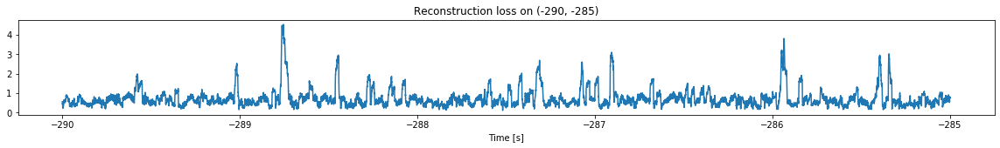

<--------
Entering sections:  (-285, -280)
-------->
Training for section:  (-290, -285)
Finished training, mean of the log(loss) is:  -0.5663963111230058
Triggering for section:  (-285, -280)
Using this mean for triggering: -0.6333958979107405


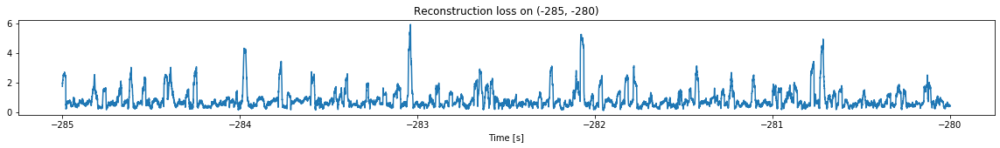

<--------
Entering sections:  (-280, -275)
-------->
Training for section:  (-285, -280)
Finished training, mean of the log(loss) is:  -0.5254842622397177
Triggering for section:  (-280, -275)
Using this mean for triggering: -0.5663963111230058


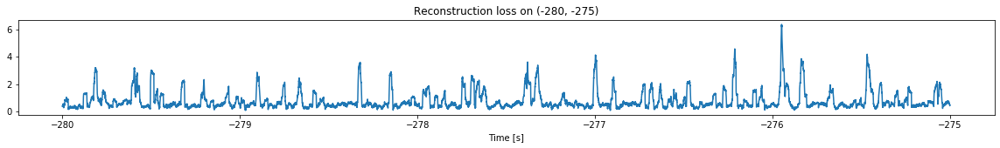

<--------
Entering sections:  (-275, -270)
-------->
Training for section:  (-280, -275)
Finished training, mean of the log(loss) is:  -0.5438505075169572
Triggering for section:  (-275, -270)
Using this mean for triggering: -0.5254842622397177


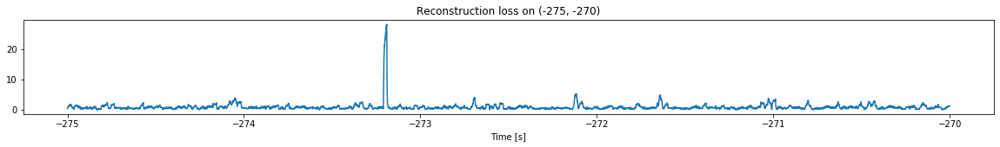

<--------
Entering sections:  (-270, -265)
-------->
Training for section:  (-275, -270)
Finished training, mean of the log(loss) is:  -0.38441110205596646
Triggering for section:  (-270, -265)
Using this mean for triggering: -0.5438505075169572


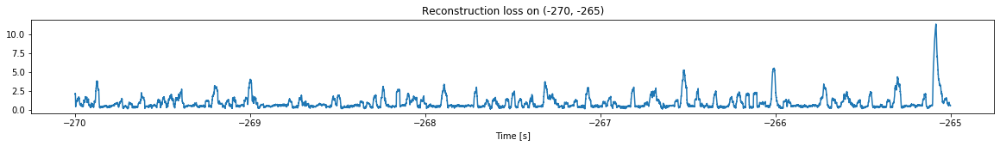

<--------
Entering sections:  (-265, -260)
-------->
Training for section:  (-270, -265)
Finished training, mean of the log(loss) is:  -0.5822907869953475
Triggering for section:  (-265, -260)
Using this mean for triggering: -0.38441110205596646


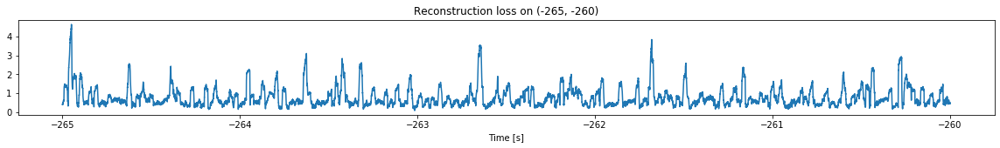

<--------
Entering sections:  (-260, -255)
-------->
Training for section:  (-265, -260)
Finished training, mean of the log(loss) is:  -0.5869699917617868
Triggering for section:  (-260, -255)
Using this mean for triggering: -0.5822907869953475


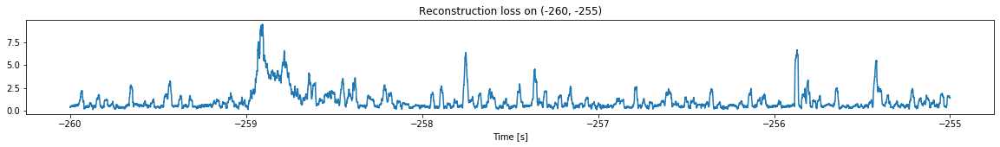

<--------
Entering sections:  (-255, -250)
-------->
Training for section:  (-260, -255)
Finished training, mean of the log(loss) is:  -0.39114512494684045
Triggering for section:  (-255, -250)
Using this mean for triggering: -0.5869699917617868


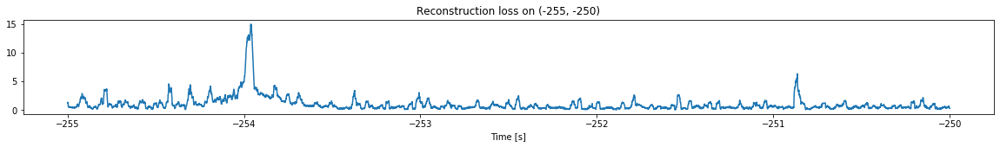

<--------
Entering sections:  (-250, -245)
-------->
Training for section:  (-255, -250)
Finished training, mean of the log(loss) is:  -0.44426452563538876
Triggering for section:  (-250, -245)
Using this mean for triggering: -0.39114512494684045


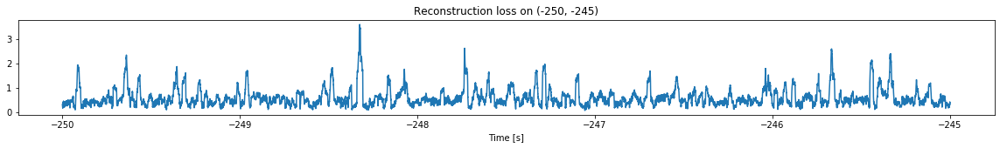

<--------
Entering sections:  (-245, -240)
-------->
Training for section:  (-250, -245)
Finished training, mean of the log(loss) is:  -0.6287259971665465
Triggering for section:  (-245, -240)
Using this mean for triggering: -0.44426452563538876


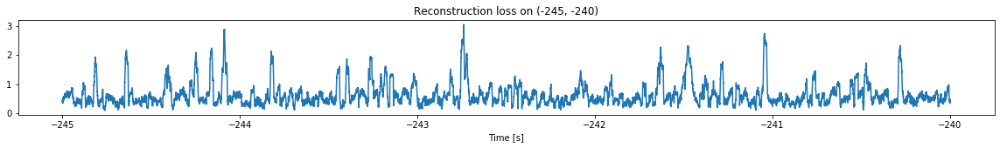

<--------
Entering sections:  (-240, -235)
-------->
Training for section:  (-245, -240)
Finished training, mean of the log(loss) is:  -0.5501345639298109
Triggering for section:  (-240, -235)
Using this mean for triggering: -0.6287259971665465


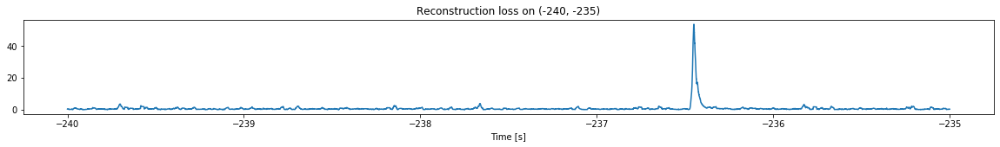

<--------
Entering sections:  (-235, -230)
-------->
Training for section:  (-240, -235)
Finished training, mean of the log(loss) is:  -0.5103081654507221
Triggering for section:  (-235, -230)
Using this mean for triggering: -0.5501345639298109


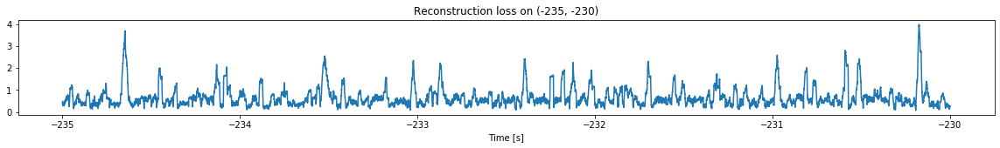

<--------
Entering sections:  (-230, -225)
-------->
Training for section:  (-235, -230)
Finished training, mean of the log(loss) is:  -0.5783051965335713
Triggering for section:  (-230, -225)
Using this mean for triggering: -0.5103081654507221


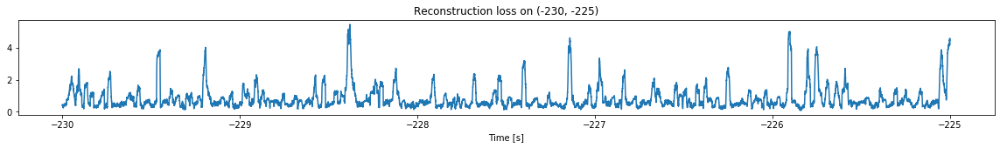

<--------
Entering sections:  (-225, -220)
-------->
Training for section:  (-230, -225)
Finished training, mean of the log(loss) is:  -0.5490818611536293
Triggering for section:  (-225, -220)
Using this mean for triggering: -0.5783051965335713


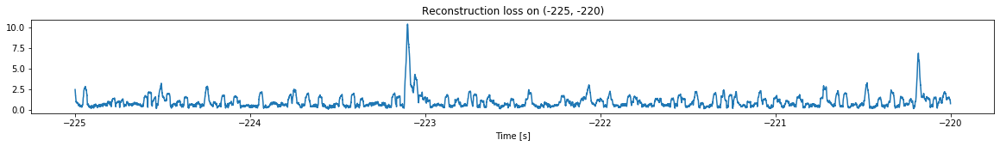

<--------
Entering sections:  (-220, -215)
-------->
Training for section:  (-225, -220)
Finished training, mean of the log(loss) is:  -0.5189160679893976
Triggering for section:  (-220, -215)
Using this mean for triggering: -0.5490818611536293


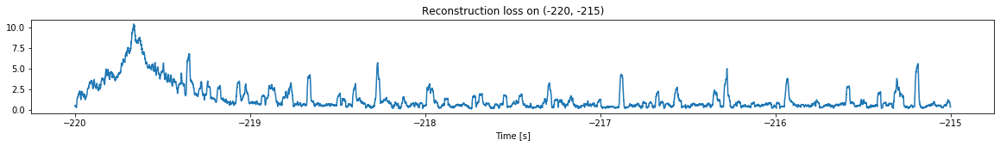

<--------
Entering sections:  (-215, -210)
-------->
Training for section:  (-220, -215)
Finished training, mean of the log(loss) is:  -0.3603867079736734
Triggering for section:  (-215, -210)
Using this mean for triggering: -0.5189160679893976


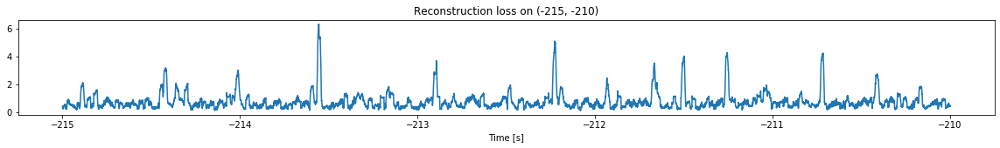

<--------
Entering sections:  (-210, -205)
-------->
Training for section:  (-215, -210)
Finished training, mean of the log(loss) is:  -0.620051305876697
Triggering for section:  (-210, -205)
Using this mean for triggering: -0.3603867079736734


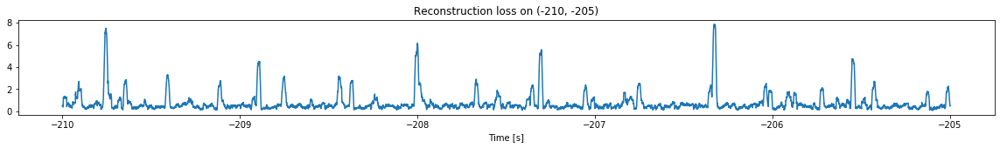

<--------
Entering sections:  (-205, -200)
-------->
Training for section:  (-210, -205)
Finished training, mean of the log(loss) is:  -0.49814994723705636
Triggering for section:  (-205, -200)
Using this mean for triggering: -0.620051305876697


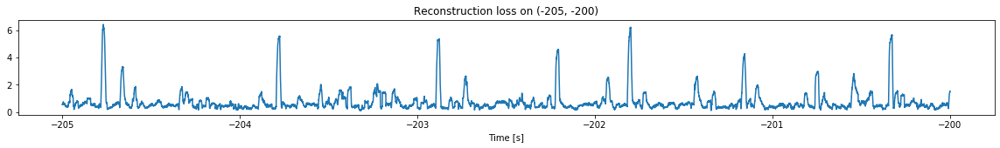

<--------
Entering sections:  (-200, -195)
-------->
Training for section:  (-205, -200)
Finished training, mean of the log(loss) is:  -0.6215308672676549
Triggering for section:  (-200, -195)
Using this mean for triggering: -0.49814994723705636


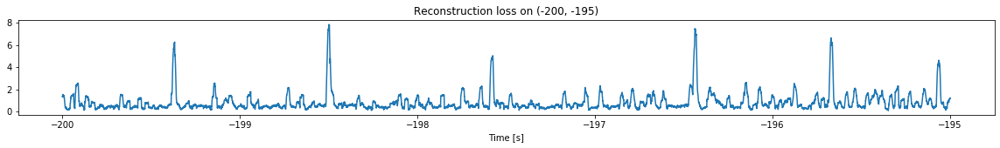

<--------
Entering sections:  (-195, -190)
-------->
Training for section:  (-200, -195)
Finished training, mean of the log(loss) is:  -0.5391758598539456
Triggering for section:  (-195, -190)
Using this mean for triggering: -0.6215308672676549


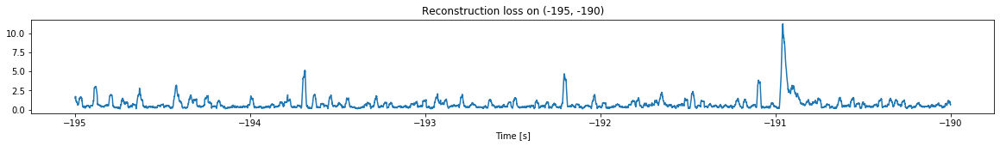

<--------
Entering sections:  (-190, -185)
-------->
Training for section:  (-195, -190)
Finished training, mean of the log(loss) is:  -0.5674269050059186
Triggering for section:  (-190, -185)
Using this mean for triggering: -0.5391758598539456


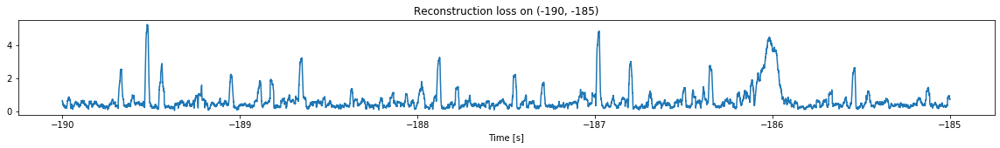

<--------
Entering sections:  (-185, -180)
-------->
Training for section:  (-190, -185)
Finished training, mean of the log(loss) is:  -0.5811778434110111
Triggering for section:  (-185, -180)
Using this mean for triggering: -0.5674269050059186


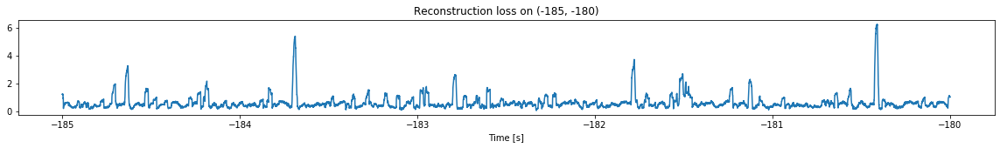

<--------
Entering sections:  (-180, -175)
-------->
Training for section:  (-185, -180)
Finished training, mean of the log(loss) is:  -0.7110416824380891
Triggering for section:  (-180, -175)
Using this mean for triggering: -0.5811778434110111


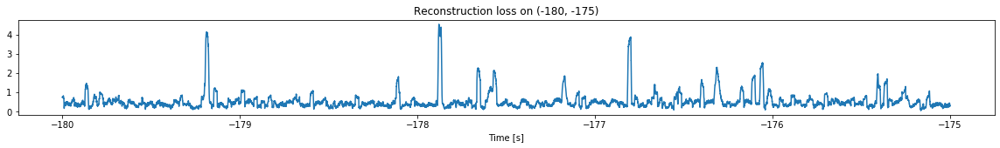

<--------
Entering sections:  (-175, -170)
-------->
Training for section:  (-180, -175)
Finished training, mean of the log(loss) is:  -0.6920285492272521
Triggering for section:  (-175, -170)
Using this mean for triggering: -0.7110416824380891


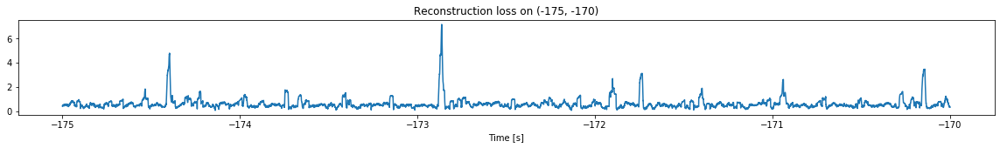

<--------
Entering sections:  (-170, -165)
-------->
Training for section:  (-175, -170)
Finished training, mean of the log(loss) is:  -0.756918111866565
Triggering for section:  (-170, -165)
Using this mean for triggering: -0.6920285492272521


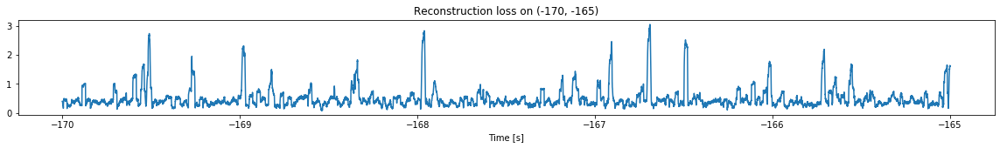

<--------
Entering sections:  (-165, -160)
-------->
Training for section:  (-170, -165)
Finished training, mean of the log(loss) is:  -0.7244401389422603
Triggering for section:  (-165, -160)
Using this mean for triggering: -0.756918111866565


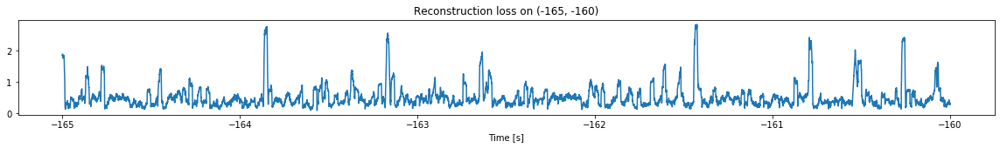

<--------
Entering sections:  (-160, -155)
-------->
Training for section:  (-165, -160)
Finished training, mean of the log(loss) is:  -0.6469743652787695
Triggering for section:  (-160, -155)
Using this mean for triggering: -0.7244401389422603


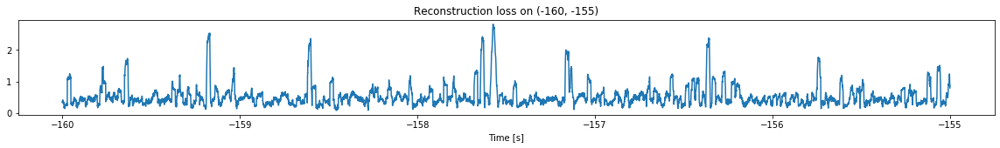

<--------
Entering sections:  (-155, -150)
-------->
Training for section:  (-160, -155)
Finished training, mean of the log(loss) is:  -0.6882523775577496
Triggering for section:  (-155, -150)
Using this mean for triggering: -0.6469743652787695


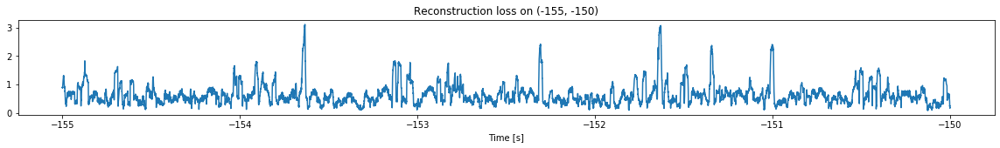

<--------
Entering sections:  (-150, -145)
-------->
Training for section:  (-155, -150)
Finished training, mean of the log(loss) is:  -0.7220173316320858
Triggering for section:  (-150, -145)
Using this mean for triggering: -0.6882523775577496


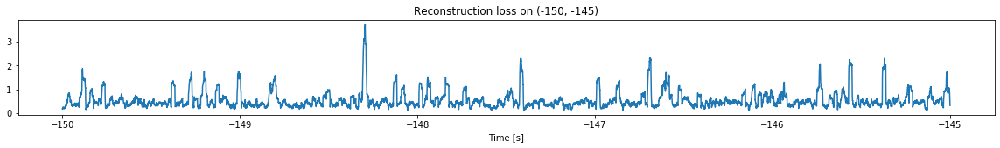

<--------
Entering sections:  (-145, -140)
-------->
Training for section:  (-150, -145)
Finished training, mean of the log(loss) is:  -0.6907838444034128
Triggering for section:  (-145, -140)
Using this mean for triggering: -0.7220173316320858


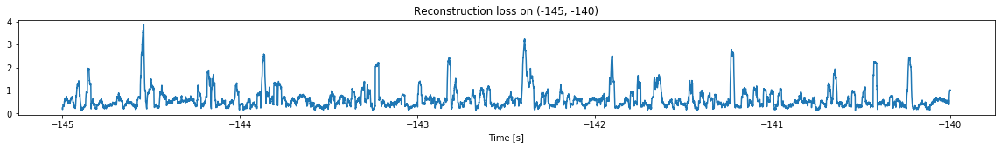

<--------
Entering sections:  (-140, -135)
-------->
Training for section:  (-145, -140)
Finished training, mean of the log(loss) is:  -0.6571519753875357
Triggering for section:  (-140, -135)
Using this mean for triggering: -0.6907838444034128


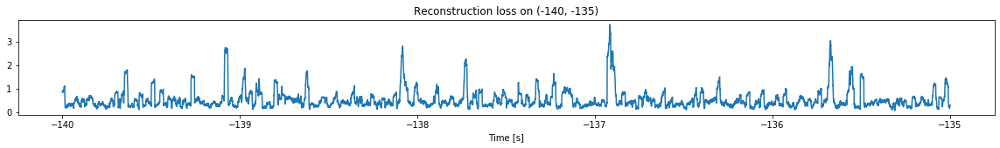

<--------
Entering sections:  (-135, -130)
-------->
Training for section:  (-140, -135)
Finished training, mean of the log(loss) is:  -0.7327326269877688
Triggering for section:  (-135, -130)
Using this mean for triggering: -0.6571519753875357


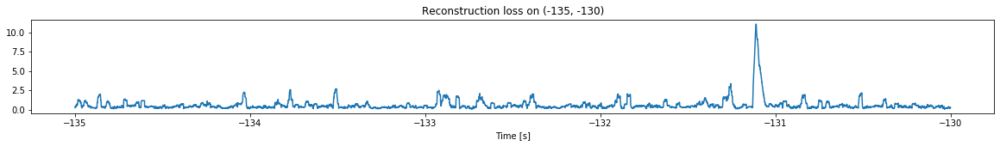

<--------
Entering sections:  (-130, -125)
-------->
Training for section:  (-135, -130)
Finished training, mean of the log(loss) is:  -0.6170768962168283
Triggering for section:  (-130, -125)
Using this mean for triggering: -0.7327326269877688


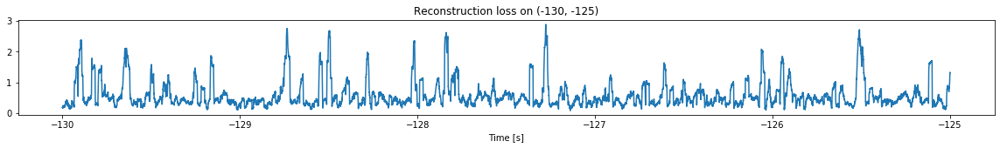

<--------
Entering sections:  (-125, -120)
-------->
Training for section:  (-130, -125)
Finished training, mean of the log(loss) is:  -0.6863326895020736
Triggering for section:  (-125, -120)
Using this mean for triggering: -0.6170768962168283


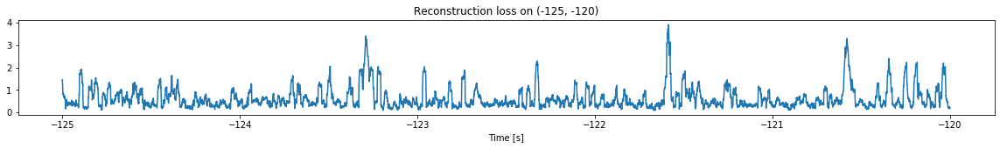

<--------
Entering sections:  (-120, -115)
-------->
Training for section:  (-125, -120)
Finished training, mean of the log(loss) is:  -0.7281680594330451
Triggering for section:  (-120, -115)
Using this mean for triggering: -0.6863326895020736


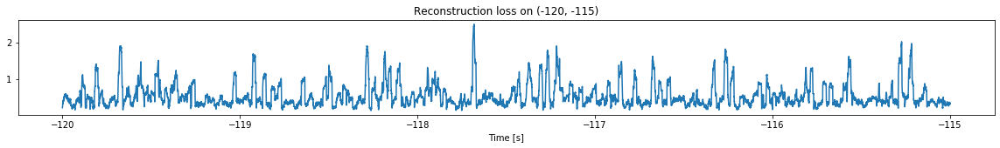

<--------
Entering sections:  (-115, -110)
-------->
Training for section:  (-120, -115)
Finished training, mean of the log(loss) is:  -0.6719428580183329
Triggering for section:  (-115, -110)
Using this mean for triggering: -0.7281680594330451


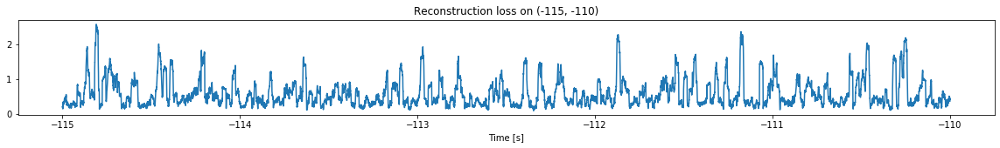

<--------
Entering sections:  (-110, -105)
-------->
Training for section:  (-115, -110)
Finished training, mean of the log(loss) is:  -0.6538128776072432
Triggering for section:  (-110, -105)
Using this mean for triggering: -0.6719428580183329


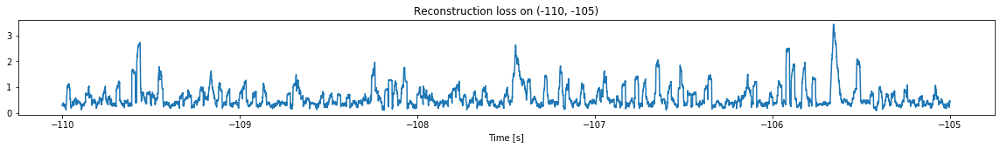

<--------
Entering sections:  (-105, -100)
-------->
Training for section:  (-110, -105)
Finished training, mean of the log(loss) is:  -0.6656331209541996
Triggering for section:  (-105, -100)
Using this mean for triggering: -0.6538128776072432


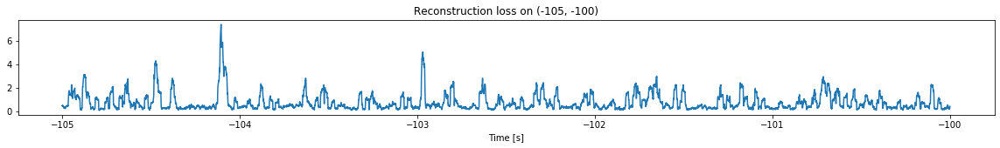

<--------
Entering sections:  (-100, -95)
-------->
Training for section:  (-105, -100)
Finished training, mean of the log(loss) is:  -0.641271162308892
Triggering for section:  (-100, -95)
Using this mean for triggering: -0.6656331209541996


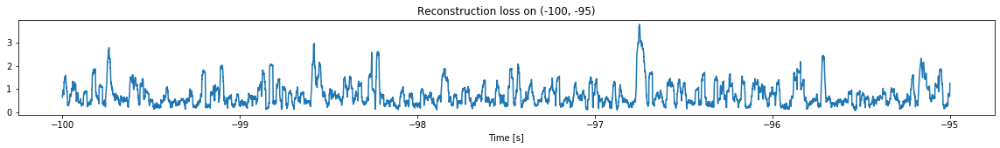

<--------
Entering sections:  (-95, -90)
-------->
Training for section:  (-100, -95)
Finished training, mean of the log(loss) is:  -0.6443106092285992
Triggering for section:  (-95, -90)
Using this mean for triggering: -0.641271162308892


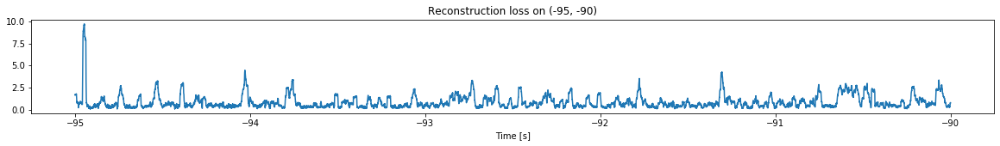

<--------
Entering sections:  (-90, -85)
-------->
Training for section:  (-95, -90)
Finished training, mean of the log(loss) is:  -0.543341039549233
Triggering for section:  (-90, -85)
Using this mean for triggering: -0.6443106092285992


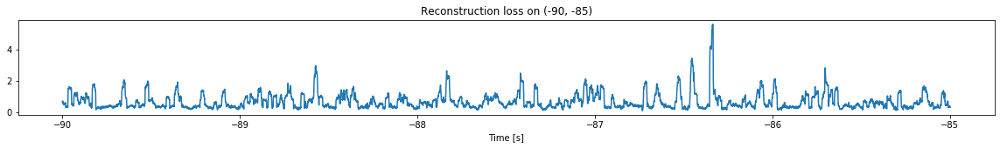

<--------
Entering sections:  (-85, -80)
-------->
Training for section:  (-90, -85)
Finished training, mean of the log(loss) is:  -0.5952364783886395
Triggering for section:  (-85, -80)
Using this mean for triggering: -0.543341039549233


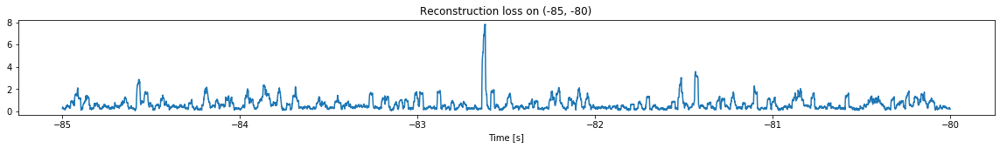

<--------
Entering sections:  (-80, -75)
-------->
Training for section:  (-85, -80)
Finished training, mean of the log(loss) is:  -0.6507566396039809
Triggering for section:  (-80, -75)
Using this mean for triggering: -0.5952364783886395


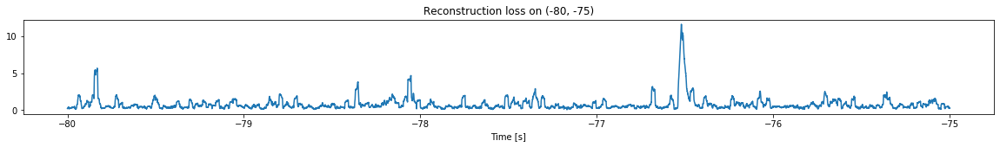

<--------
Entering sections:  (-75, -70)
-------->
Training for section:  (-80, -75)
Finished training, mean of the log(loss) is:  -0.5312952001741548
Triggering for section:  (-75, -70)
Using this mean for triggering: -0.6507566396039809


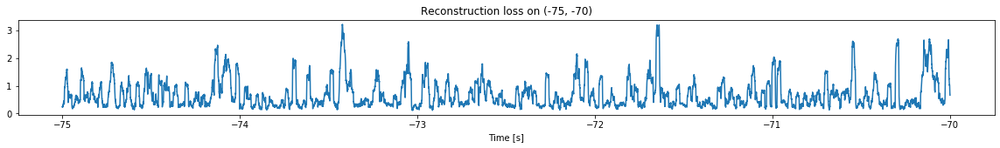

<--------
Entering sections:  (-70, -65)
-------->
Training for section:  (-75, -70)
Finished training, mean of the log(loss) is:  -0.7193150246322141
Triggering for section:  (-70, -65)
Using this mean for triggering: -0.5312952001741548


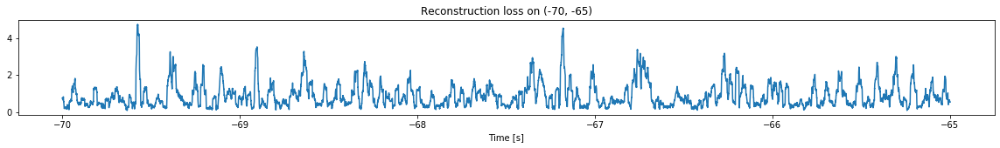

<--------
Entering sections:  (-65, -60)
-------->
Training for section:  (-70, -65)
Finished training, mean of the log(loss) is:  -0.6016249918704344
Triggering for section:  (-65, -60)
Using this mean for triggering: -0.7193150246322141


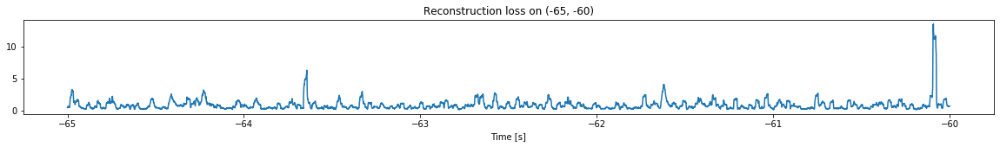

<--------
Entering sections:  (-60, -55)
-------->
Training for section:  (-65, -60)
Finished training, mean of the log(loss) is:  -0.5094587217240139
Triggering for section:  (-60, -55)
Using this mean for triggering: -0.6016249918704344


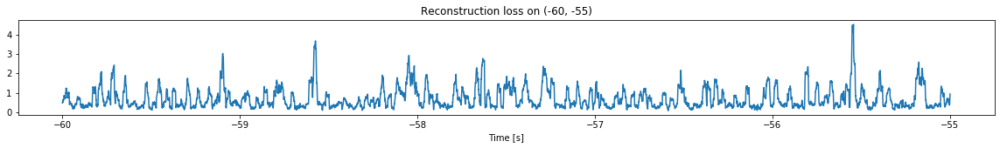

<--------
Entering sections:  (-55, -50)
-------->
Training for section:  (-60, -55)
Finished training, mean of the log(loss) is:  -0.5748982558918722
Triggering for section:  (-55, -50)
Using this mean for triggering: -0.5094587217240139


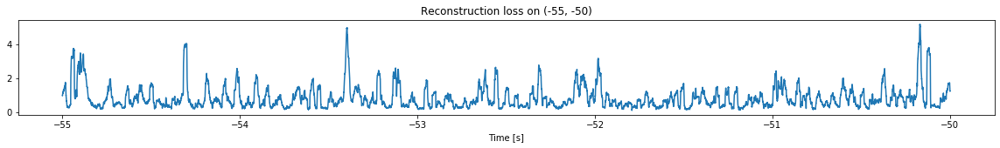

<--------
Entering sections:  (-50, -45)
-------->
Training for section:  (-55, -50)
Finished training, mean of the log(loss) is:  -0.6208059100324305
Triggering for section:  (-50, -45)
Using this mean for triggering: -0.5748982558918722


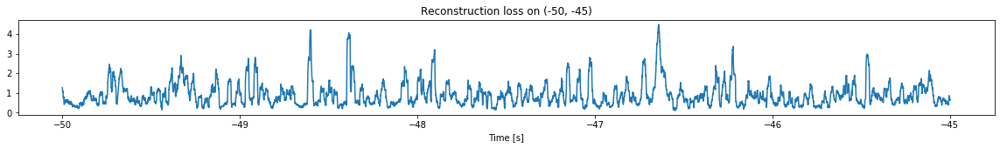

<--------
Entering sections:  (-45, -40)
-------->
Training for section:  (-50, -45)
Finished training, mean of the log(loss) is:  -0.6311507445471045
Triggering for section:  (-45, -40)
Using this mean for triggering: -0.6208059100324305


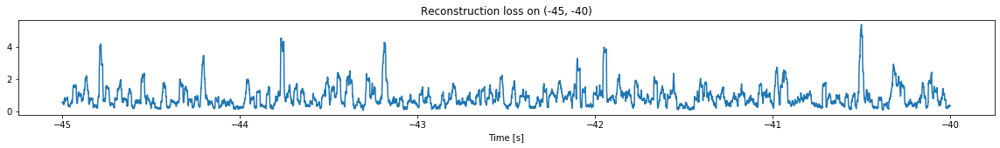

<--------
Entering sections:  (-40, -35)
-------->
Training for section:  (-45, -40)
Finished training, mean of the log(loss) is:  -0.5572234738080464
Triggering for section:  (-40, -35)
Using this mean for triggering: -0.6311507445471045


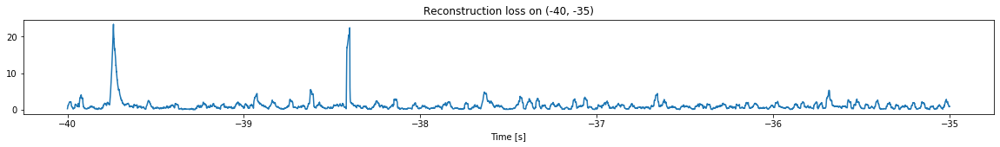

<--------
Entering sections:  (-35, -30)
-------->
Training for section:  (-40, -35)
Finished training, mean of the log(loss) is:  -0.4227757876420634
Triggering for section:  (-35, -30)
Using this mean for triggering: -0.5572234738080464


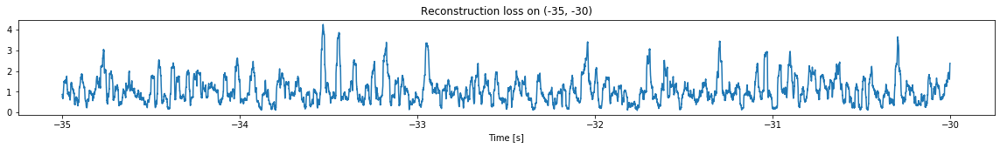

<--------
Entering sections:  (-30, -25)
-------->
Training for section:  (-35, -30)
Finished training, mean of the log(loss) is:  -0.5833632028015956
Triggering for section:  (-30, -25)
Using this mean for triggering: -0.4227757876420634


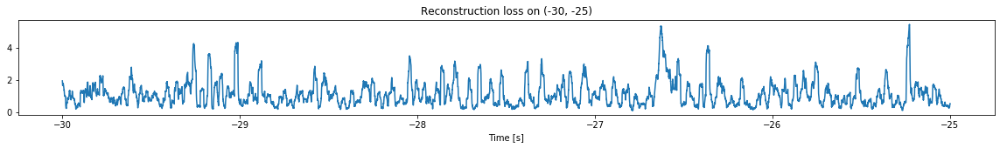

<--------
Entering sections:  (-25, -20)
-------->
Training for section:  (-30, -25)
Finished training, mean of the log(loss) is:  -0.478635013351087
Triggering for section:  (-25, -20)
Using this mean for triggering: -0.5833632028015956


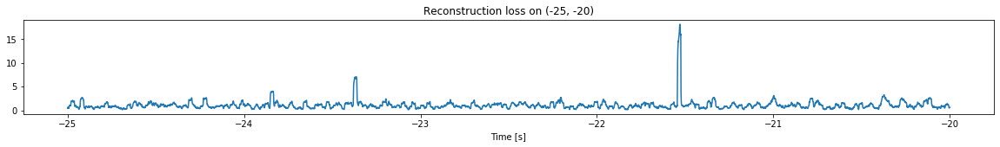

<--------
Entering sections:  (-20, -15)
-------->
Training for section:  (-25, -20)
Finished training, mean of the log(loss) is:  -0.4643438025781369
Triggering for section:  (-20, -15)
Using this mean for triggering: -0.478635013351087


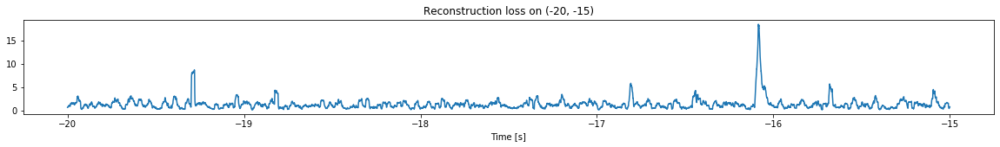

<--------
Entering sections:  (-15, -10)
-------->
Training for section:  (-20, -15)
Finished training, mean of the log(loss) is:  -0.4482156073346397
Triggering for section:  (-15, -10)
Using this mean for triggering: -0.4643438025781369


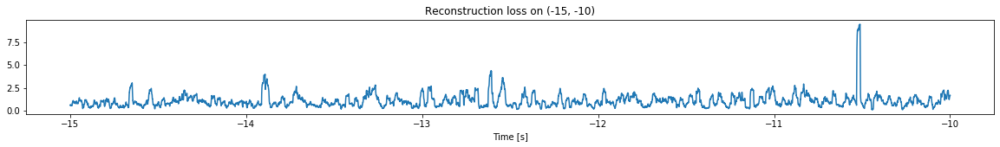

<--------
Entering sections:  (-10, -5)
-------->
Training for section:  (-15, -10)
Finished training, mean of the log(loss) is:  -0.4611797562913198
Triggering for section:  (-10, -5)
Using this mean for triggering: -0.4482156073346397


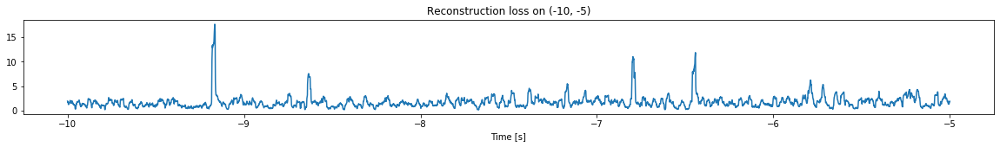

<--------
Entering sections:  (-5, 0)
-------->
Training for section:  (-10, -5)
Finished training, mean of the log(loss) is:  -0.2523354241793832
Triggering for section:  (-5, 0)
Using this mean for triggering: -0.4611797562913198


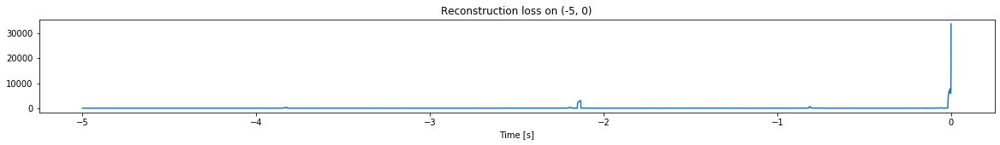

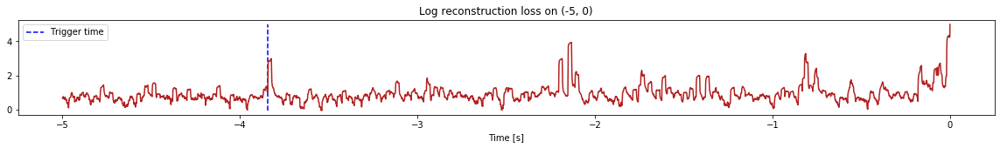

Triggered at:  -3.8414898


-3.8414898

In [3]:
simulation("./data/Ramp4/", 5, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.6009724093458749
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.6293168865347618
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.6009724093458749


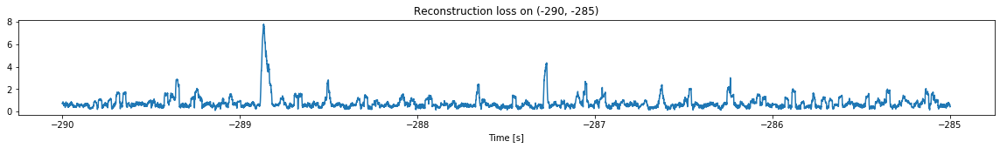

<--------
Entering sections:  (-285, -280)
-------->
Training for section:  (-290, -285)
Finished training, mean of the log(loss) is:  -0.5294188109225599
Triggering for section:  (-285, -280)
Using this mean for triggering: -0.6293168865347618


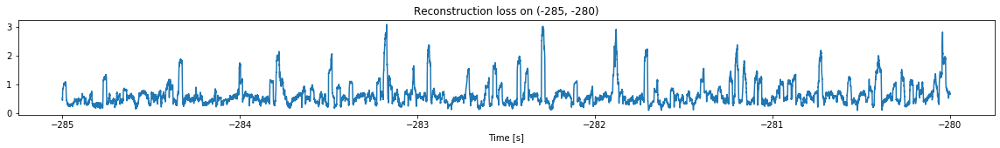

<--------
Entering sections:  (-280, -275)
-------->
Training for section:  (-285, -280)
Finished training, mean of the log(loss) is:  -0.6755197244492764
Triggering for section:  (-280, -275)
Using this mean for triggering: -0.5294188109225599


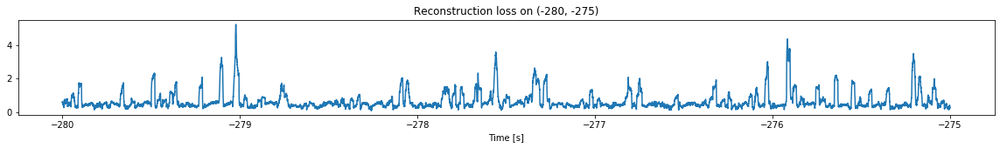

<--------
Entering sections:  (-275, -270)
-------->
Training for section:  (-280, -275)
Finished training, mean of the log(loss) is:  -0.6020836793236403
Triggering for section:  (-275, -270)
Using this mean for triggering: -0.6755197244492764


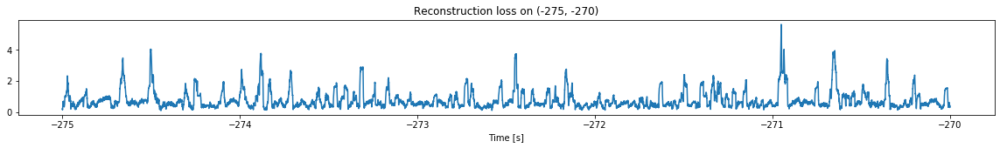

<--------
Entering sections:  (-270, -265)
-------->
Training for section:  (-275, -270)
Finished training, mean of the log(loss) is:  -0.556300024308154
Triggering for section:  (-270, -265)
Using this mean for triggering: -0.6020836793236403


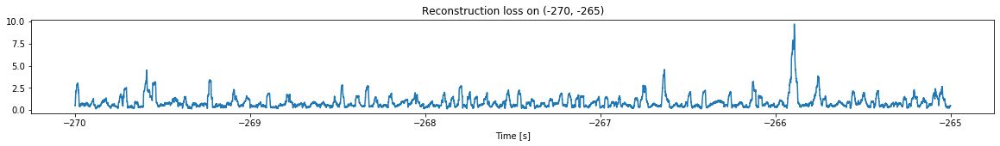

<--------
Entering sections:  (-265, -260)
-------->
Training for section:  (-270, -265)
Finished training, mean of the log(loss) is:  -0.4520607207182822
Triggering for section:  (-265, -260)
Using this mean for triggering: -0.556300024308154


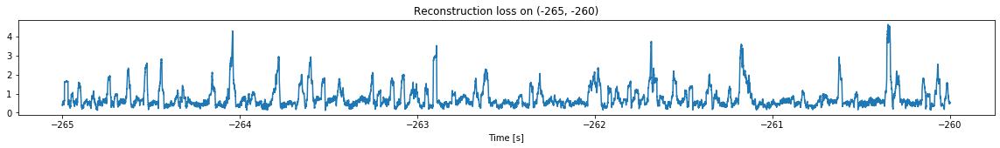

<--------
Entering sections:  (-260, -255)
-------->
Training for section:  (-265, -260)
Finished training, mean of the log(loss) is:  -0.525226089548054
Triggering for section:  (-260, -255)
Using this mean for triggering: -0.4520607207182822


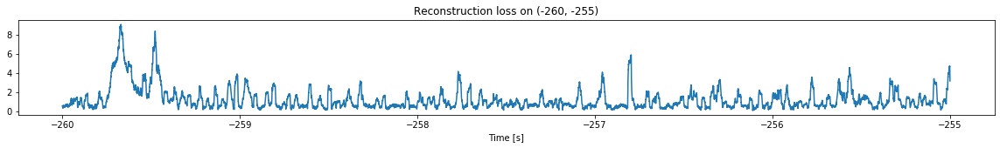

<--------
Entering sections:  (-255, -250)
-------->
Training for section:  (-260, -255)
Finished training, mean of the log(loss) is:  -0.41618062948999235
Triggering for section:  (-255, -250)
Using this mean for triggering: -0.525226089548054


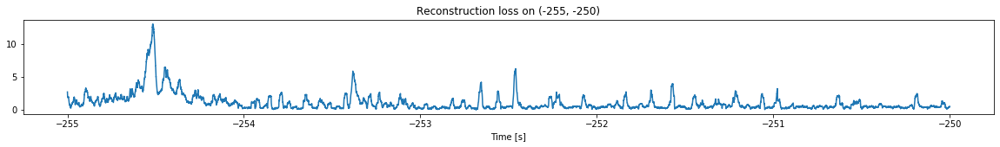

<--------
Entering sections:  (-250, -245)
-------->
Training for section:  (-255, -250)
Finished training, mean of the log(loss) is:  -0.4863390305864301
Triggering for section:  (-250, -245)
Using this mean for triggering: -0.41618062948999235


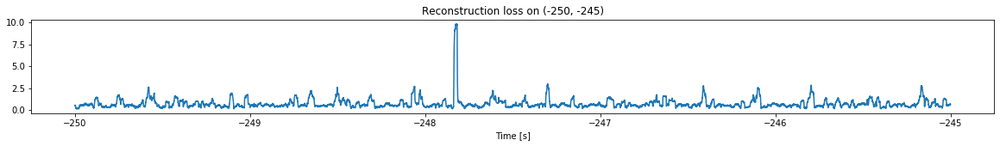

<--------
Entering sections:  (-245, -240)
-------->
Training for section:  (-250, -245)
Finished training, mean of the log(loss) is:  -0.5240081327009777
Triggering for section:  (-245, -240)
Using this mean for triggering: -0.4863390305864301


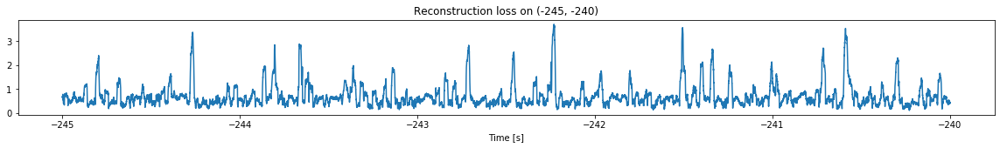

<--------
Entering sections:  (-240, -235)
-------->
Training for section:  (-245, -240)
Finished training, mean of the log(loss) is:  -0.5621981613576774
Triggering for section:  (-240, -235)
Using this mean for triggering: -0.5240081327009777


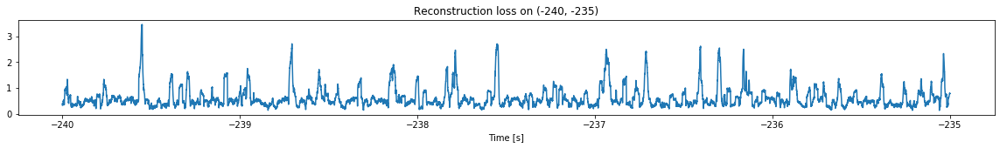

<--------
Entering sections:  (-235, -230)
-------->
Training for section:  (-240, -235)
Finished training, mean of the log(loss) is:  -0.5374111361447431
Triggering for section:  (-235, -230)
Using this mean for triggering: -0.5621981613576774


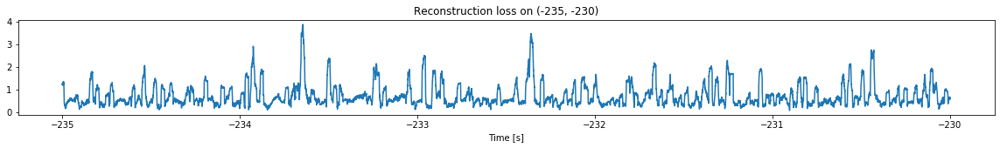

<--------
Entering sections:  (-230, -225)
-------->
Training for section:  (-235, -230)
Finished training, mean of the log(loss) is:  -0.588177751950727
Triggering for section:  (-230, -225)
Using this mean for triggering: -0.5374111361447431


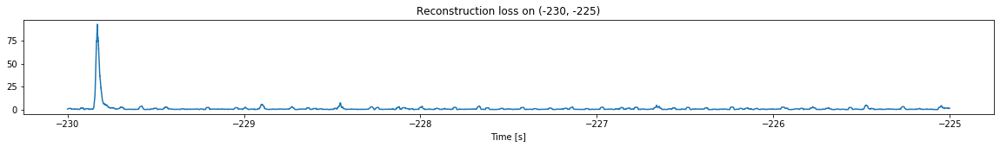

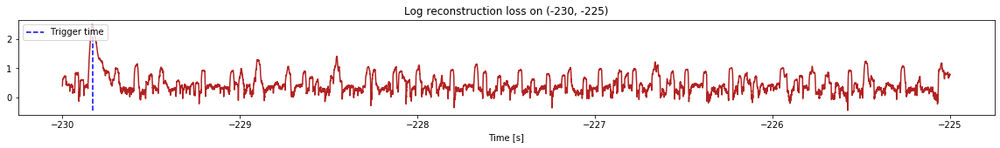

Triggered at:  -229.83127


-229.83127

In [4]:
simulation("./data/Ramp5/", 5, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.5389855057951446
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.6741489834403477
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.5389855057951446


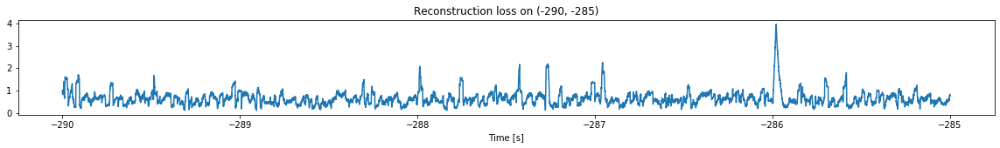

<--------
Entering sections:  (-285, -280)
-------->
Training for section:  (-290, -285)
Finished training, mean of the log(loss) is:  -0.547191599802587
Triggering for section:  (-285, -280)
Using this mean for triggering: -0.6741489834403477


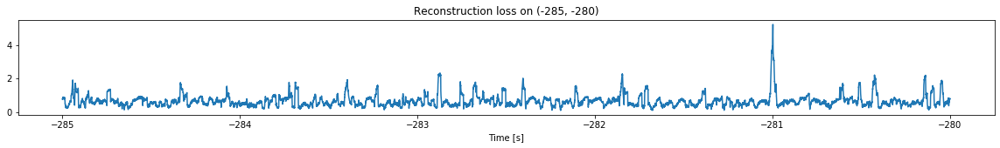

<--------
Entering sections:  (-280, -275)
-------->
Training for section:  (-285, -280)
Finished training, mean of the log(loss) is:  -0.6036882329410393
Triggering for section:  (-280, -275)
Using this mean for triggering: -0.547191599802587


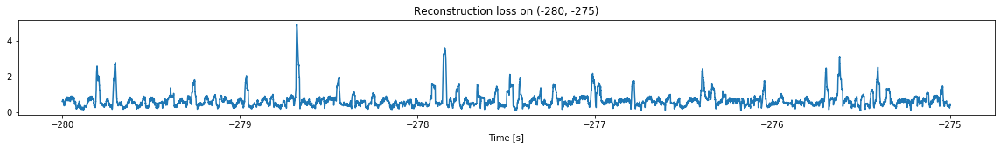

<--------
Entering sections:  (-275, -270)
-------->
Training for section:  (-280, -275)
Finished training, mean of the log(loss) is:  -0.5662916806125522
Triggering for section:  (-275, -270)
Using this mean for triggering: -0.6036882329410393


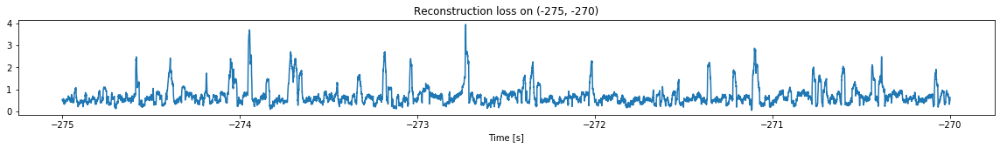

<--------
Entering sections:  (-270, -265)
-------->
Training for section:  (-275, -270)
Finished training, mean of the log(loss) is:  -0.646069521088587
Triggering for section:  (-270, -265)
Using this mean for triggering: -0.5662916806125522


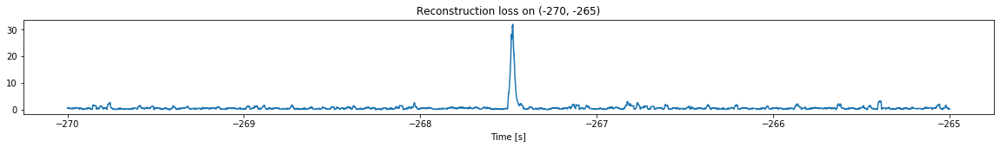

<--------
Entering sections:  (-265, -260)
-------->
Training for section:  (-270, -265)
Finished training, mean of the log(loss) is:  -0.5815846262269694
Triggering for section:  (-265, -260)
Using this mean for triggering: -0.646069521088587


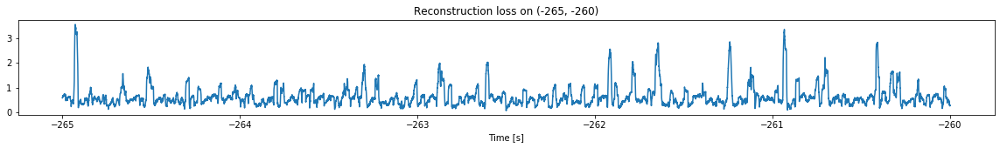

<--------
Entering sections:  (-260, -255)
-------->
Training for section:  (-265, -260)
Finished training, mean of the log(loss) is:  -0.5733101687037815
Triggering for section:  (-260, -255)
Using this mean for triggering: -0.5815846262269694


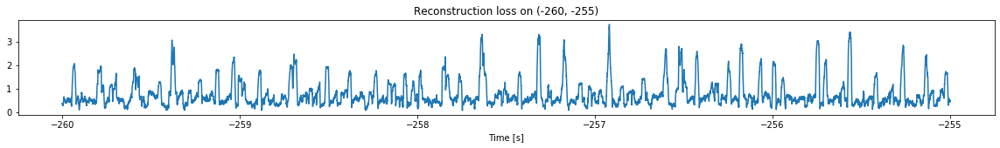

<--------
Entering sections:  (-255, -250)
-------->
Training for section:  (-260, -255)
Finished training, mean of the log(loss) is:  -0.5186762847618778
Triggering for section:  (-255, -250)
Using this mean for triggering: -0.5733101687037815


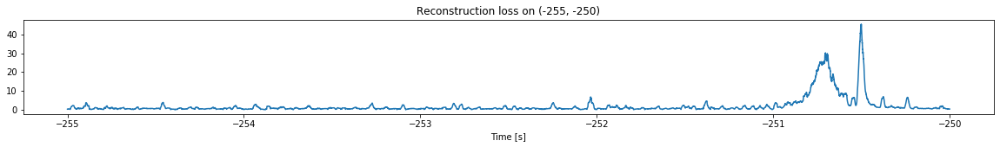

<--------
Entering sections:  (-250, -245)
-------->
Training for section:  (-255, -250)
Finished training, mean of the log(loss) is:  -0.48381991886921877
Triggering for section:  (-250, -245)
Using this mean for triggering: -0.5186762847618778


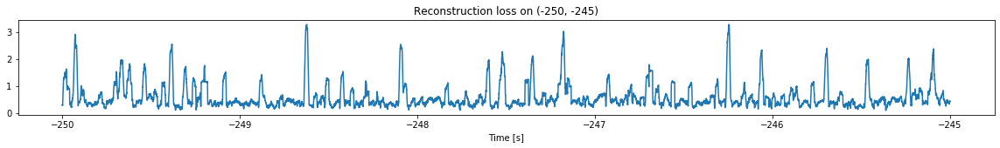

<--------
Entering sections:  (-245, -240)
-------->
Training for section:  (-250, -245)
Finished training, mean of the log(loss) is:  -0.6958947112130289
Triggering for section:  (-245, -240)
Using this mean for triggering: -0.48381991886921877


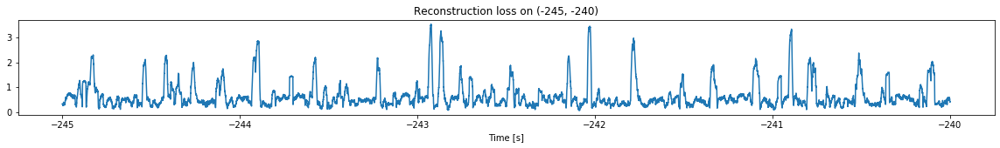

<--------
Entering sections:  (-240, -235)
-------->
Training for section:  (-245, -240)
Finished training, mean of the log(loss) is:  -0.6753284718225969
Triggering for section:  (-240, -235)
Using this mean for triggering: -0.6958947112130289


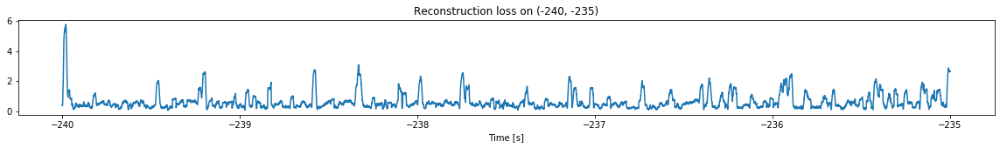

<--------
Entering sections:  (-235, -230)
-------->
Training for section:  (-240, -235)
Finished training, mean of the log(loss) is:  -0.6615432736110797
Triggering for section:  (-235, -230)
Using this mean for triggering: -0.6753284718225969


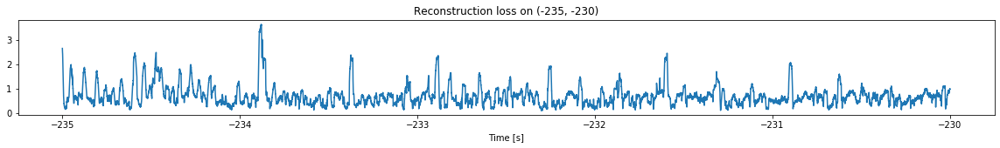

<--------
Entering sections:  (-230, -225)
-------->
Training for section:  (-235, -230)
Finished training, mean of the log(loss) is:  -0.654263313041813
Triggering for section:  (-230, -225)
Using this mean for triggering: -0.6615432736110797


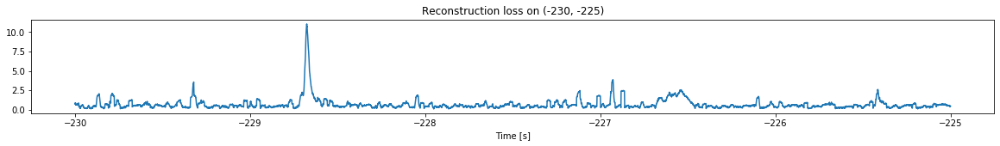

<--------
Entering sections:  (-225, -220)
-------->
Training for section:  (-230, -225)
Finished training, mean of the log(loss) is:  -0.6594883111487673
Triggering for section:  (-225, -220)
Using this mean for triggering: -0.654263313041813


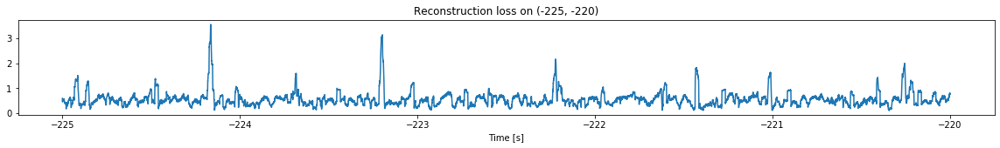

<--------
Entering sections:  (-220, -215)
-------->
Training for section:  (-225, -220)
Finished training, mean of the log(loss) is:  -0.7456481118538798
Triggering for section:  (-220, -215)
Using this mean for triggering: -0.6594883111487673


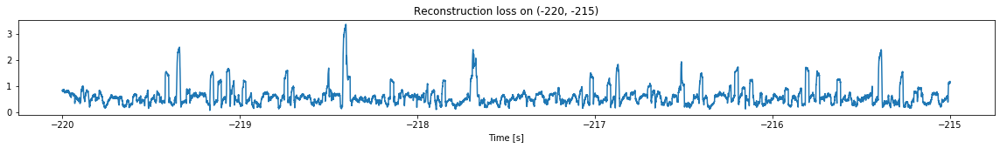

<--------
Entering sections:  (-215, -210)
-------->
Training for section:  (-220, -215)
Finished training, mean of the log(loss) is:  -0.751605756363842
Triggering for section:  (-215, -210)
Using this mean for triggering: -0.7456481118538798


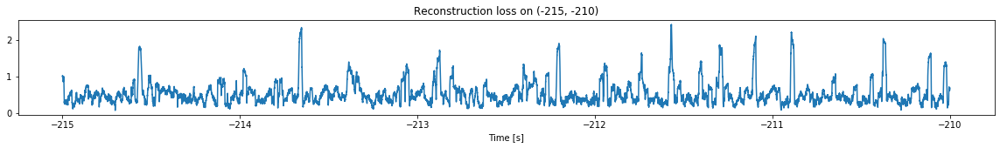

<--------
Entering sections:  (-210, -205)
-------->
Training for section:  (-215, -210)
Finished training, mean of the log(loss) is:  -0.7178977747193809
Triggering for section:  (-210, -205)
Using this mean for triggering: -0.751605756363842


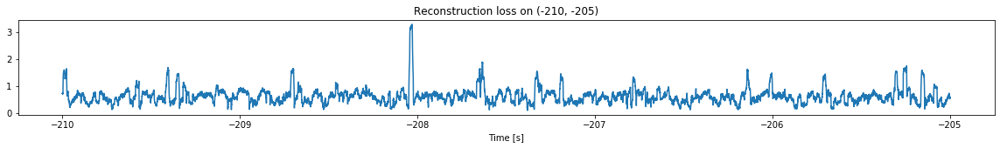

<--------
Entering sections:  (-205, -200)
-------->
Training for section:  (-210, -205)
Finished training, mean of the log(loss) is:  -0.7235396937956173
Triggering for section:  (-205, -200)
Using this mean for triggering: -0.7178977747193809


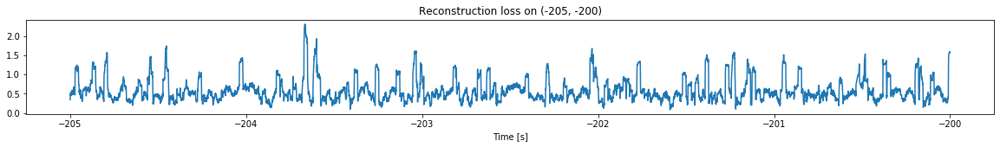

<--------
Entering sections:  (-200, -195)
-------->
Training for section:  (-205, -200)
Finished training, mean of the log(loss) is:  -0.7486023439310482
Triggering for section:  (-200, -195)
Using this mean for triggering: -0.7235396937956173


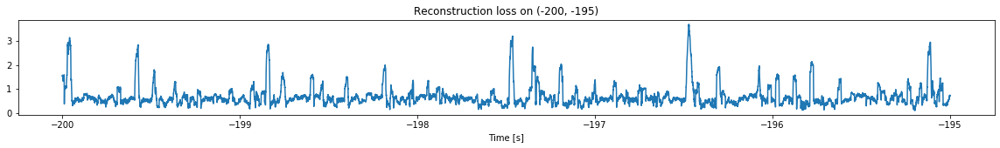

<--------
Entering sections:  (-195, -190)
-------->
Training for section:  (-200, -195)
Finished training, mean of the log(loss) is:  -0.7462994055069337
Triggering for section:  (-195, -190)
Using this mean for triggering: -0.7486023439310482


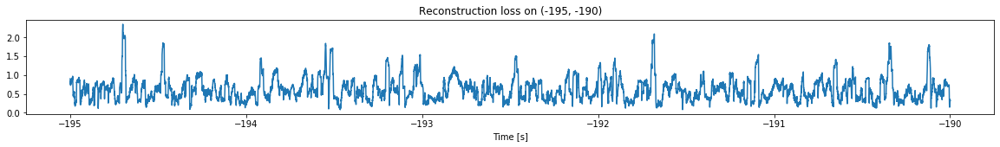

<--------
Entering sections:  (-190, -185)
-------->
Training for section:  (-195, -190)
Finished training, mean of the log(loss) is:  -0.7291844497509486
Triggering for section:  (-190, -185)
Using this mean for triggering: -0.7462994055069337


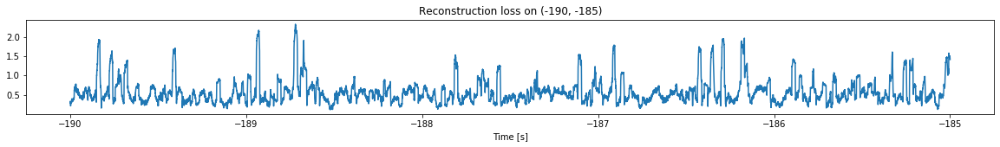

<--------
Entering sections:  (-185, -180)
-------->
Training for section:  (-190, -185)
Finished training, mean of the log(loss) is:  -0.7037499813102294
Triggering for section:  (-185, -180)
Using this mean for triggering: -0.7291844497509486


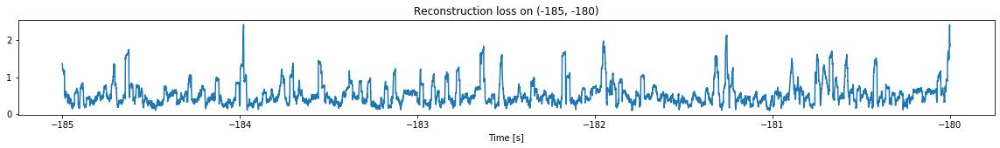

<--------
Entering sections:  (-180, -175)
-------->
Training for section:  (-185, -180)
Finished training, mean of the log(loss) is:  -0.7010019030585306
Triggering for section:  (-180, -175)
Using this mean for triggering: -0.7037499813102294


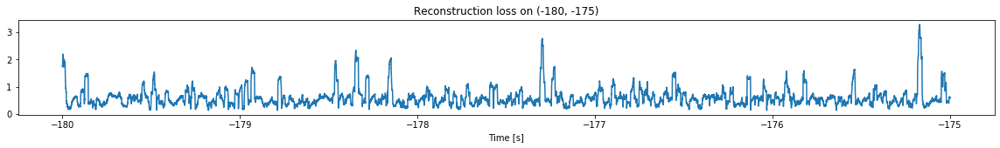

<--------
Entering sections:  (-175, -170)
-------->
Training for section:  (-180, -175)
Finished training, mean of the log(loss) is:  -0.7217735223906009
Triggering for section:  (-175, -170)
Using this mean for triggering: -0.7010019030585306


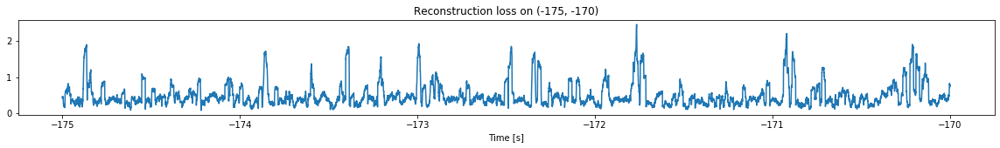

<--------
Entering sections:  (-170, -165)
-------->
Training for section:  (-175, -170)
Finished training, mean of the log(loss) is:  -0.7394717857005011
Triggering for section:  (-170, -165)
Using this mean for triggering: -0.7217735223906009


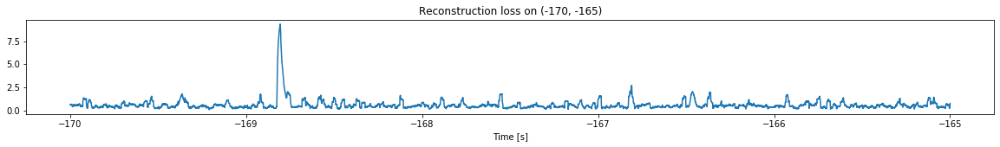

<--------
Entering sections:  (-165, -160)
-------->
Training for section:  (-170, -165)
Finished training, mean of the log(loss) is:  -0.6382187665190567
Triggering for section:  (-165, -160)
Using this mean for triggering: -0.7394717857005011


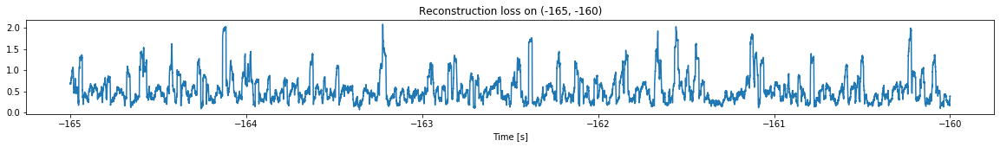

<--------
Entering sections:  (-160, -155)
-------->
Training for section:  (-165, -160)
Finished training, mean of the log(loss) is:  -0.7642941336207777
Triggering for section:  (-160, -155)
Using this mean for triggering: -0.6382187665190567


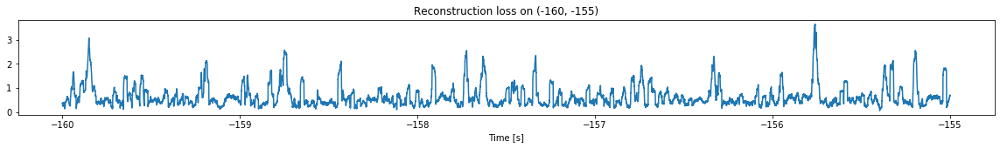

<--------
Entering sections:  (-155, -150)
-------->
Training for section:  (-160, -155)
Finished training, mean of the log(loss) is:  -0.667082952980224
Triggering for section:  (-155, -150)
Using this mean for triggering: -0.7642941336207777


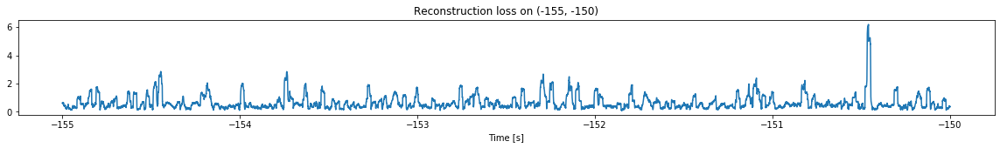

<--------
Entering sections:  (-150, -145)
-------->
Training for section:  (-155, -150)
Finished training, mean of the log(loss) is:  -0.661556657213182
Triggering for section:  (-150, -145)
Using this mean for triggering: -0.667082952980224


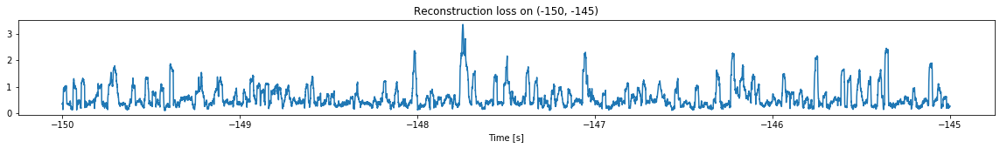

<--------
Entering sections:  (-145, -140)
-------->
Training for section:  (-150, -145)
Finished training, mean of the log(loss) is:  -0.7108585229852826
Triggering for section:  (-145, -140)
Using this mean for triggering: -0.661556657213182


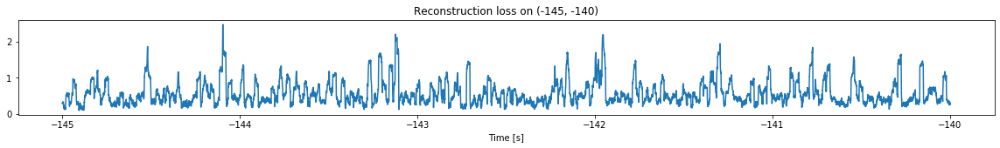

<--------
Entering sections:  (-140, -135)
-------->
Training for section:  (-145, -140)
Finished training, mean of the log(loss) is:  -0.6545764524520015
Triggering for section:  (-140, -135)
Using this mean for triggering: -0.7108585229852826


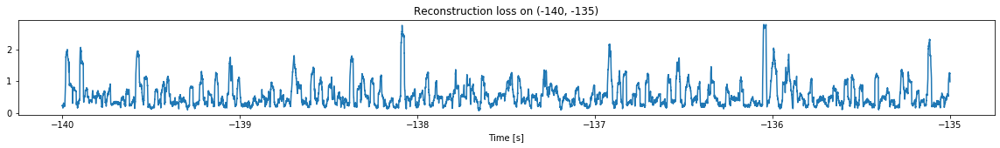

<--------
Entering sections:  (-135, -130)
-------->
Training for section:  (-140, -135)
Finished training, mean of the log(loss) is:  -0.6229241396749073
Triggering for section:  (-135, -130)
Using this mean for triggering: -0.6545764524520015


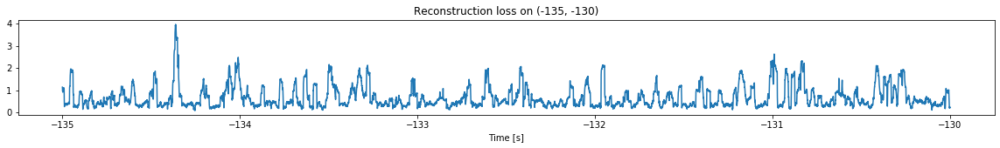

<--------
Entering sections:  (-130, -125)
-------->
Training for section:  (-135, -130)
Finished training, mean of the log(loss) is:  -0.660365234394442
Triggering for section:  (-130, -125)
Using this mean for triggering: -0.6229241396749073


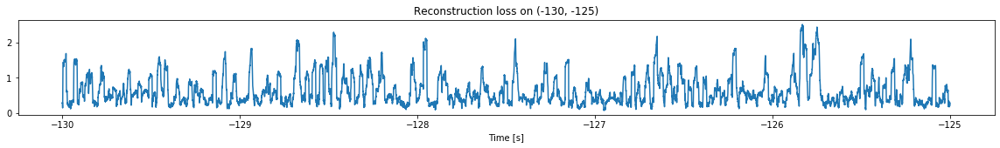

<--------
Entering sections:  (-125, -120)
-------->
Training for section:  (-130, -125)
Finished training, mean of the log(loss) is:  -0.7284532707092536
Triggering for section:  (-125, -120)
Using this mean for triggering: -0.660365234394442


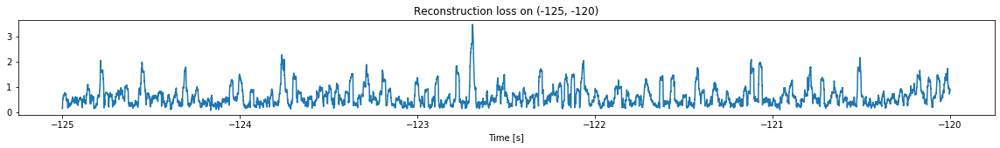

<--------
Entering sections:  (-120, -115)
-------->
Training for section:  (-125, -120)
Finished training, mean of the log(loss) is:  -0.6963614117793477
Triggering for section:  (-120, -115)
Using this mean for triggering: -0.7284532707092536


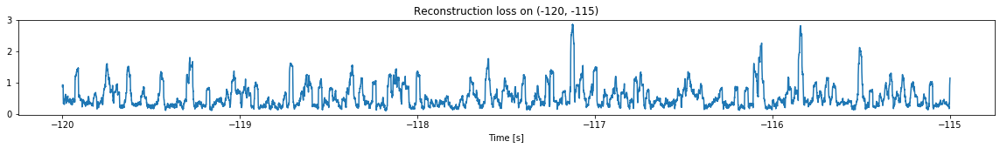

<--------
Entering sections:  (-115, -110)
-------->
Training for section:  (-120, -115)
Finished training, mean of the log(loss) is:  -0.7047371105102078
Triggering for section:  (-115, -110)
Using this mean for triggering: -0.6963614117793477


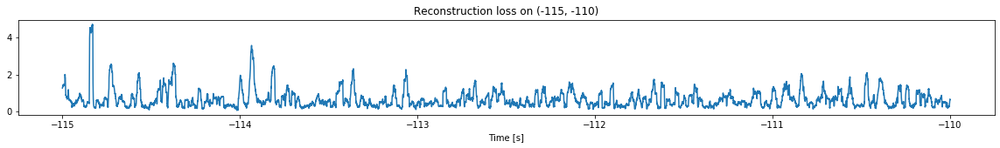

<--------
Entering sections:  (-110, -105)
-------->
Training for section:  (-115, -110)
Finished training, mean of the log(loss) is:  -0.6385214074604404
Triggering for section:  (-110, -105)
Using this mean for triggering: -0.7047371105102078


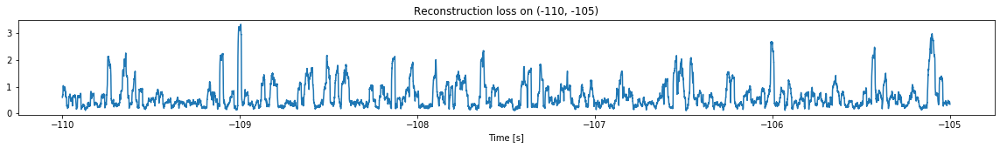

<--------
Entering sections:  (-105, -100)
-------->
Training for section:  (-110, -105)
Finished training, mean of the log(loss) is:  -0.6295987815780866
Triggering for section:  (-105, -100)
Using this mean for triggering: -0.6385214074604404


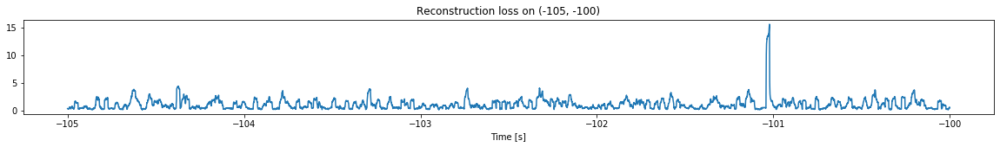

<--------
Entering sections:  (-100, -95)
-------->
Training for section:  (-105, -100)
Finished training, mean of the log(loss) is:  -0.5633419774451053
Triggering for section:  (-100, -95)
Using this mean for triggering: -0.6295987815780866


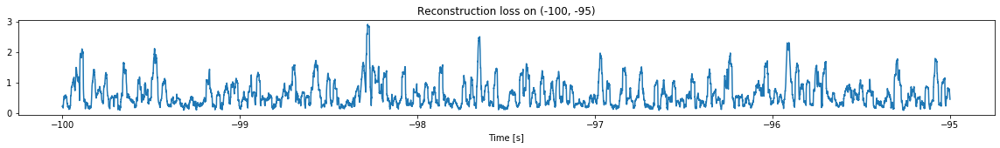

<--------
Entering sections:  (-95, -90)
-------->
Training for section:  (-100, -95)
Finished training, mean of the log(loss) is:  -0.537777680614098
Triggering for section:  (-95, -90)
Using this mean for triggering: -0.5633419774451053


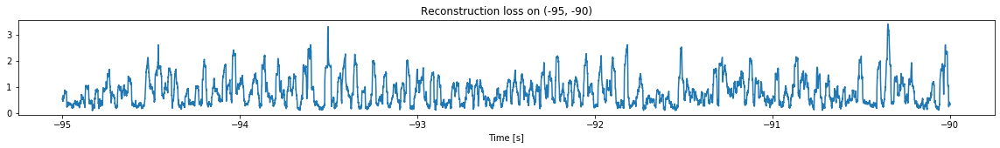

<--------
Entering sections:  (-90, -85)
-------->
Training for section:  (-95, -90)
Finished training, mean of the log(loss) is:  -0.49927815716973856
Triggering for section:  (-90, -85)
Using this mean for triggering: -0.537777680614098


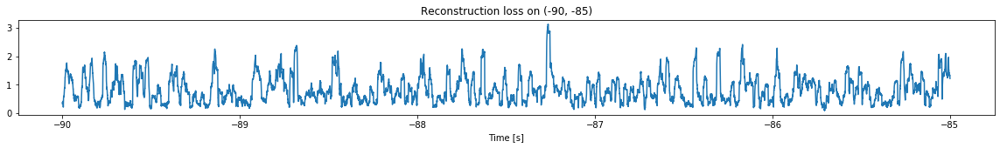

<--------
Entering sections:  (-85, -80)
-------->
Training for section:  (-90, -85)
Finished training, mean of the log(loss) is:  -0.6060070040986224
Triggering for section:  (-85, -80)
Using this mean for triggering: -0.49927815716973856


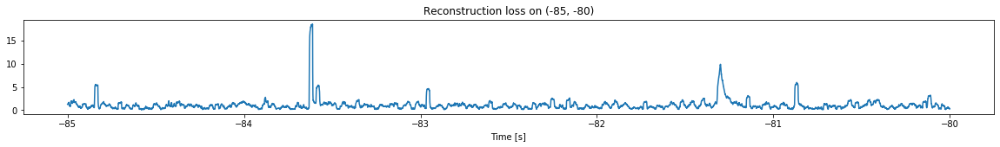

<--------
Entering sections:  (-80, -75)
-------->
Training for section:  (-85, -80)
Finished training, mean of the log(loss) is:  -0.4375279286258075
Triggering for section:  (-80, -75)
Using this mean for triggering: -0.6060070040986224


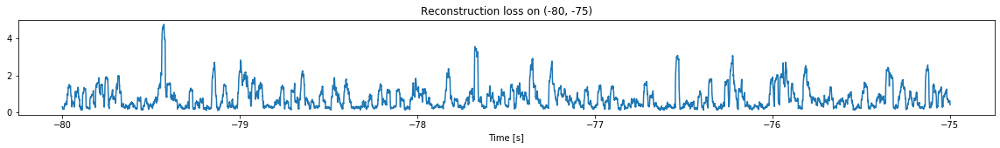

<--------
Entering sections:  (-75, -70)
-------->
Training for section:  (-80, -75)
Finished training, mean of the log(loss) is:  -0.6203838068450337
Triggering for section:  (-75, -70)
Using this mean for triggering: -0.4375279286258075


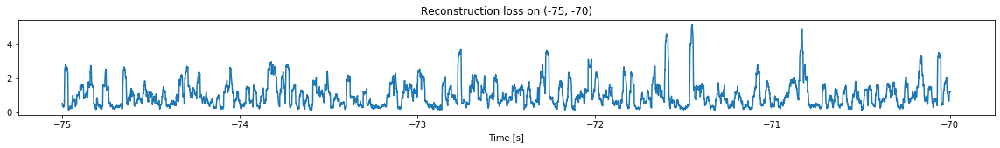

<--------
Entering sections:  (-70, -65)
-------->
Training for section:  (-75, -70)
Finished training, mean of the log(loss) is:  -0.6039657862518637
Triggering for section:  (-70, -65)
Using this mean for triggering: -0.6203838068450337


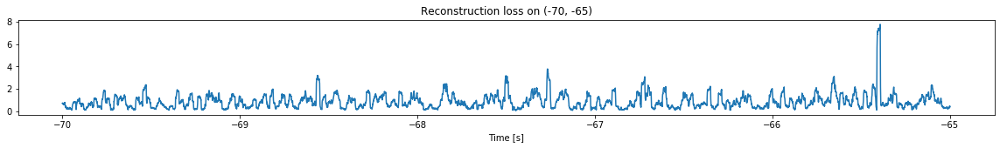

<--------
Entering sections:  (-65, -60)
-------->
Training for section:  (-70, -65)
Finished training, mean of the log(loss) is:  -0.5091448737562091
Triggering for section:  (-65, -60)
Using this mean for triggering: -0.6039657862518637


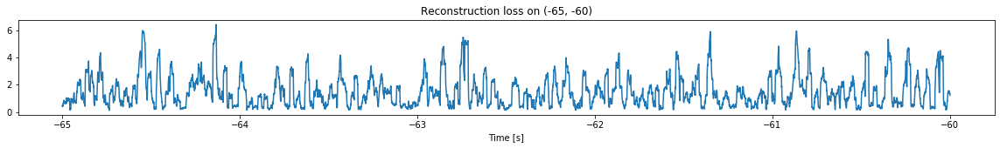

<--------
Entering sections:  (-60, -55)
-------->
Training for section:  (-65, -60)
Finished training, mean of the log(loss) is:  -0.5619578504164232
Triggering for section:  (-60, -55)
Using this mean for triggering: -0.5091448737562091


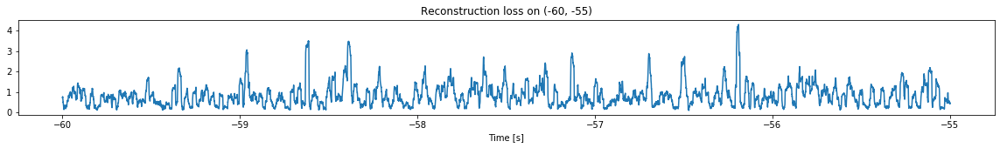

<--------
Entering sections:  (-55, -50)
-------->
Training for section:  (-60, -55)
Finished training, mean of the log(loss) is:  -0.5594752551781615
Triggering for section:  (-55, -50)
Using this mean for triggering: -0.5619578504164232


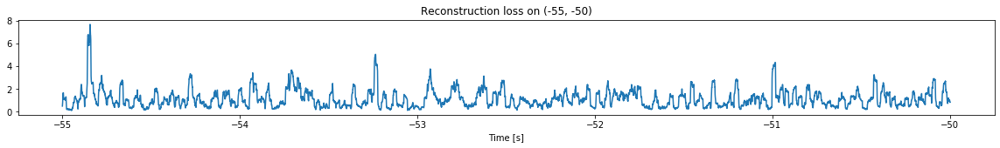

<--------
Entering sections:  (-50, -45)
-------->
Training for section:  (-55, -50)
Finished training, mean of the log(loss) is:  -0.5169376103497334
Triggering for section:  (-50, -45)
Using this mean for triggering: -0.5594752551781615


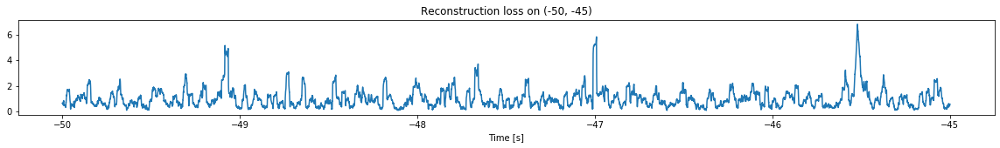

<--------
Entering sections:  (-45, -40)
-------->
Training for section:  (-50, -45)
Finished training, mean of the log(loss) is:  -0.5356644007265908
Triggering for section:  (-45, -40)
Using this mean for triggering: -0.5169376103497334


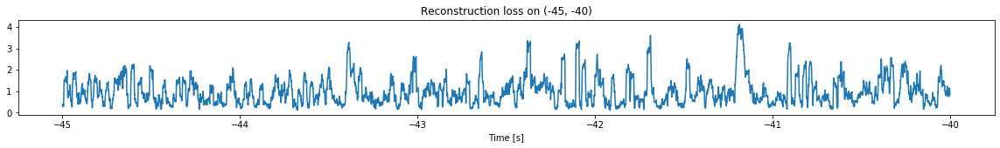

<--------
Entering sections:  (-40, -35)
-------->
Training for section:  (-45, -40)
Finished training, mean of the log(loss) is:  -0.5377488652934056
Triggering for section:  (-40, -35)
Using this mean for triggering: -0.5356644007265908


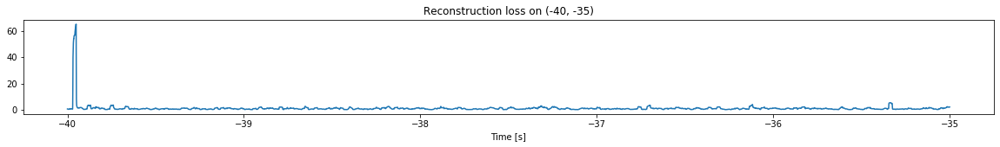

<--------
Entering sections:  (-35, -30)
-------->
Training for section:  (-40, -35)
Finished training, mean of the log(loss) is:  -0.4004404445749036
Triggering for section:  (-35, -30)
Using this mean for triggering: -0.5377488652934056


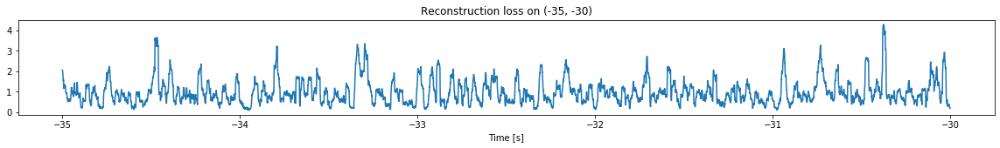

<--------
Entering sections:  (-30, -25)
-------->
Training for section:  (-35, -30)
Finished training, mean of the log(loss) is:  -0.4957049138709848
Triggering for section:  (-30, -25)
Using this mean for triggering: -0.4004404445749036


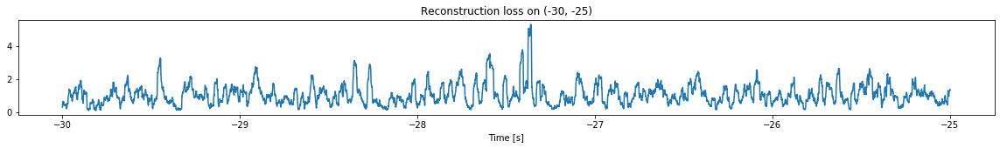

<--------
Entering sections:  (-25, -20)
-------->
Training for section:  (-30, -25)
Finished training, mean of the log(loss) is:  -0.5450424743449748
Triggering for section:  (-25, -20)
Using this mean for triggering: -0.4957049138709848


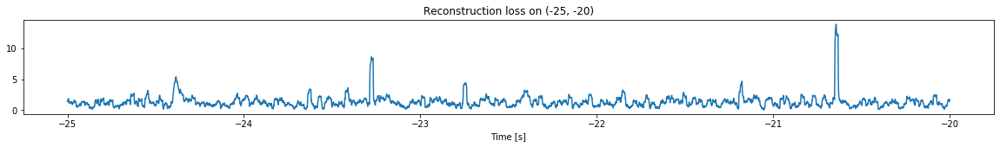

<--------
Entering sections:  (-20, -15)
-------->
Training for section:  (-25, -20)
Finished training, mean of the log(loss) is:  -0.4692642671498371
Triggering for section:  (-20, -15)
Using this mean for triggering: -0.5450424743449748


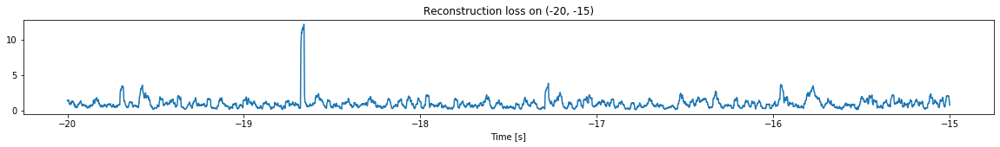

<--------
Entering sections:  (-15, -10)
-------->
Training for section:  (-20, -15)
Finished training, mean of the log(loss) is:  -0.5400284148233911
Triggering for section:  (-15, -10)
Using this mean for triggering: -0.4692642671498371


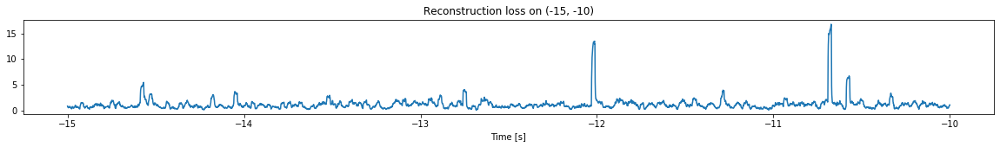

<--------
Entering sections:  (-10, -5)
-------->
Training for section:  (-15, -10)
Finished training, mean of the log(loss) is:  -0.5082172550374244
Triggering for section:  (-10, -5)
Using this mean for triggering: -0.5400284148233911


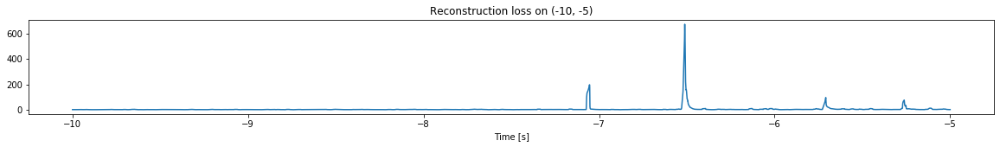

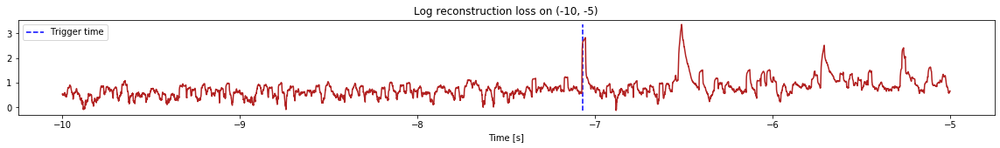

Triggered at:  -7.0710897


-7.0710897

In [5]:
simulation("./data/Ramp12d/", 5, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.6140294377202632
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.6286876782353494
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.6140294377202632


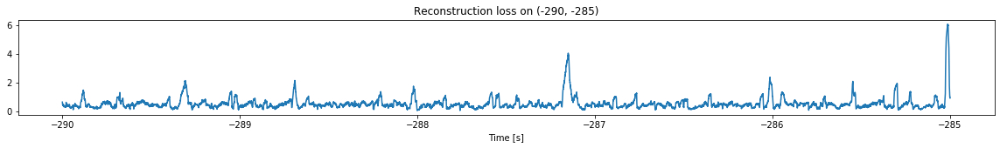

<--------
Entering sections:  (-285, -280)
-------->
Training for section:  (-290, -285)
Finished training, mean of the log(loss) is:  -0.6506520590177741
Triggering for section:  (-285, -280)
Using this mean for triggering: -0.6286876782353494


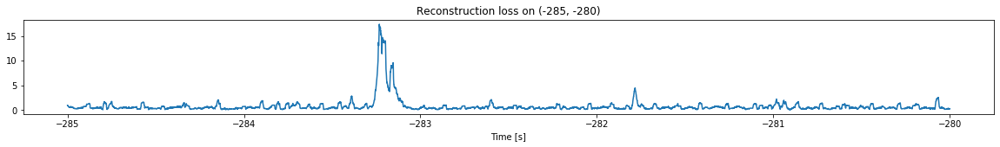

<--------
Entering sections:  (-280, -275)
-------->
Training for section:  (-285, -280)
Finished training, mean of the log(loss) is:  -0.582470017654954
Triggering for section:  (-280, -275)
Using this mean for triggering: -0.6506520590177741


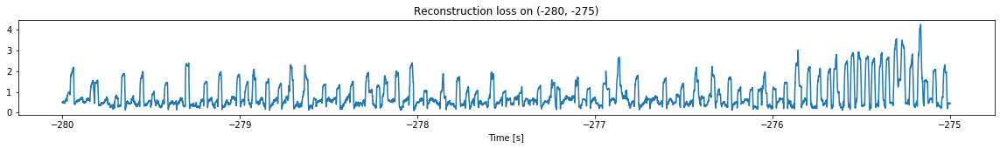

<--------
Entering sections:  (-275, -270)
-------->
Training for section:  (-280, -275)
Finished training, mean of the log(loss) is:  -0.7749761670992541
Triggering for section:  (-275, -270)
Using this mean for triggering: -0.582470017654954


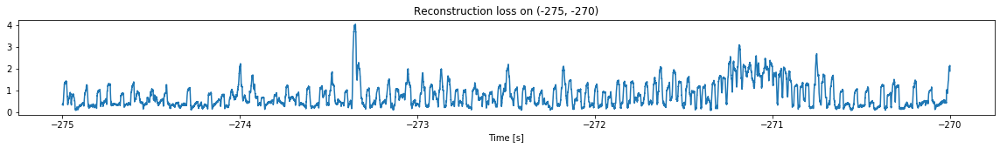

<--------
Entering sections:  (-270, -265)
-------->
Training for section:  (-275, -270)
Finished training, mean of the log(loss) is:  -0.6980833646492046
Triggering for section:  (-270, -265)
Using this mean for triggering: -0.7749761670992541


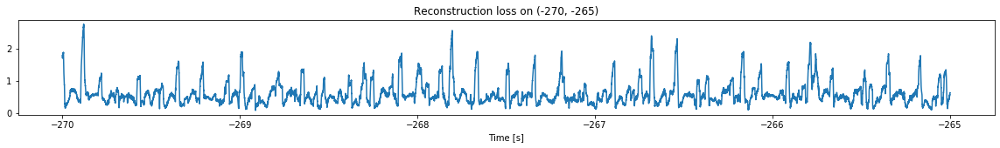

<--------
Entering sections:  (-265, -260)
-------->
Training for section:  (-270, -265)
Finished training, mean of the log(loss) is:  -0.7158460150775866
Triggering for section:  (-265, -260)
Using this mean for triggering: -0.6980833646492046


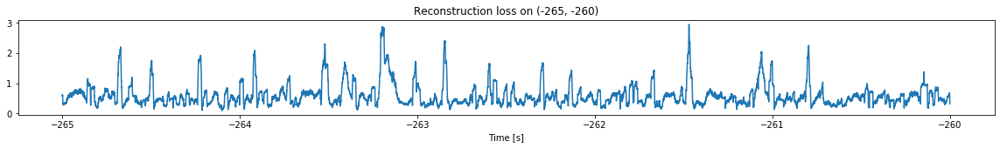

<--------
Entering sections:  (-260, -255)
-------->
Training for section:  (-265, -260)
Finished training, mean of the log(loss) is:  -0.7135084638037301
Triggering for section:  (-260, -255)
Using this mean for triggering: -0.7158460150775866


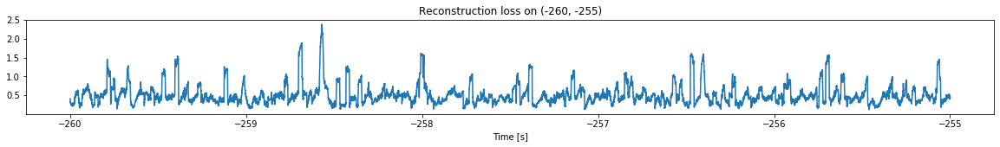

<--------
Entering sections:  (-255, -250)
-------->
Training for section:  (-260, -255)
Finished training, mean of the log(loss) is:  -0.802770150780135
Triggering for section:  (-255, -250)
Using this mean for triggering: -0.7135084638037301


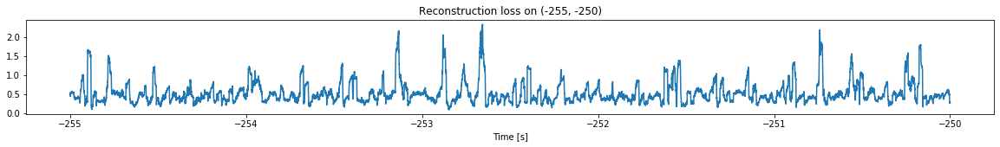

<--------
Entering sections:  (-250, -245)
-------->
Training for section:  (-255, -250)
Finished training, mean of the log(loss) is:  -0.6916055391824357
Triggering for section:  (-250, -245)
Using this mean for triggering: -0.802770150780135


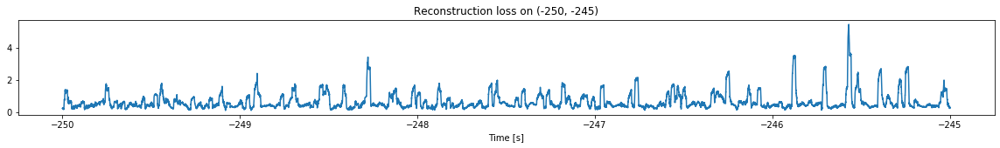

<--------
Entering sections:  (-245, -240)
-------->
Training for section:  (-250, -245)
Finished training, mean of the log(loss) is:  -0.629386690216515
Triggering for section:  (-245, -240)
Using this mean for triggering: -0.6916055391824357


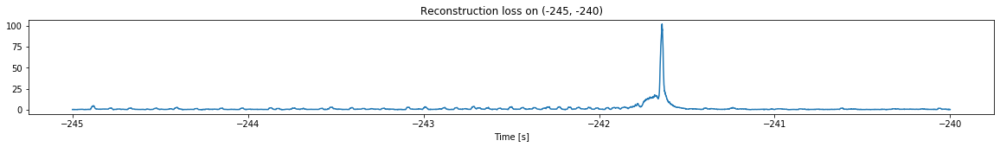

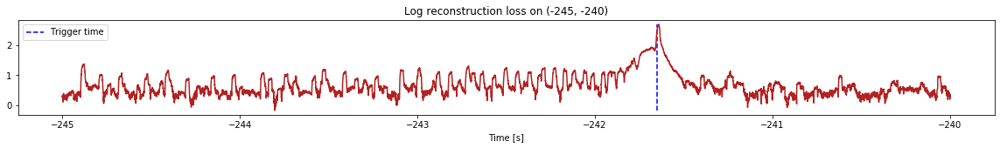

Triggered at:  -241.65


-241.65

In [6]:
simulation("./data/Ramp19/", 5, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.6540236018203784
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.6080833630321997
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.6540236018203784


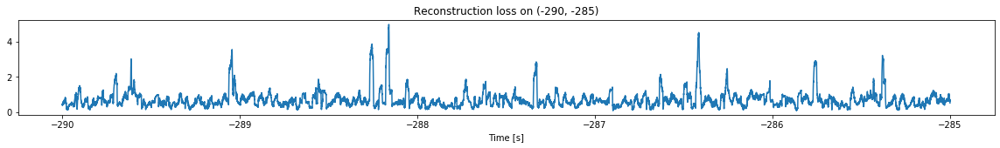

<--------
Entering sections:  (-285, -280)
-------->
Training for section:  (-290, -285)
Finished training, mean of the log(loss) is:  -0.6623458709391368
Triggering for section:  (-285, -280)
Using this mean for triggering: -0.6080833630321997


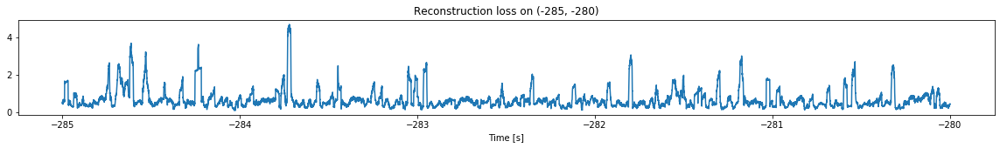

<--------
Entering sections:  (-280, -275)
-------->
Training for section:  (-285, -280)
Finished training, mean of the log(loss) is:  -0.6073775349475994
Triggering for section:  (-280, -275)
Using this mean for triggering: -0.6623458709391368


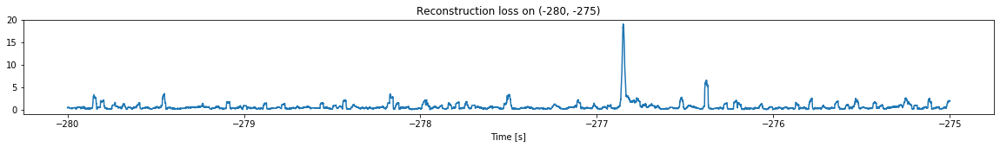

<--------
Entering sections:  (-275, -270)
-------->
Training for section:  (-280, -275)
Finished training, mean of the log(loss) is:  -0.547181053615849
Triggering for section:  (-275, -270)
Using this mean for triggering: -0.6073775349475994


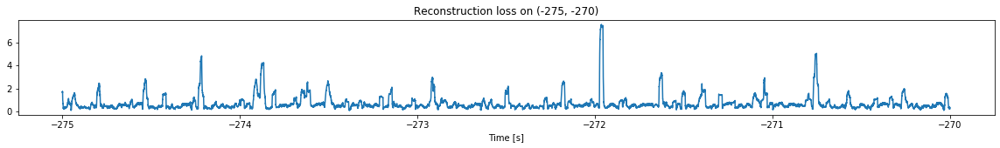

<--------
Entering sections:  (-270, -265)
-------->
Training for section:  (-275, -270)
Finished training, mean of the log(loss) is:  -0.5941091983572966
Triggering for section:  (-270, -265)
Using this mean for triggering: -0.547181053615849


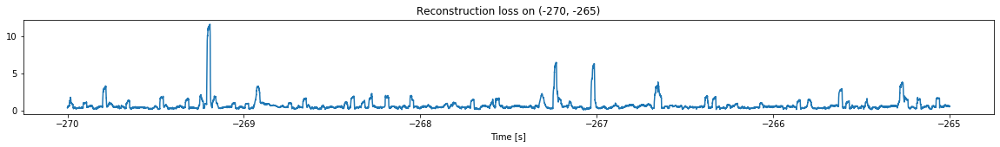

<--------
Entering sections:  (-265, -260)
-------->
Training for section:  (-270, -265)
Finished training, mean of the log(loss) is:  -0.6033444896270902
Triggering for section:  (-265, -260)
Using this mean for triggering: -0.5941091983572966


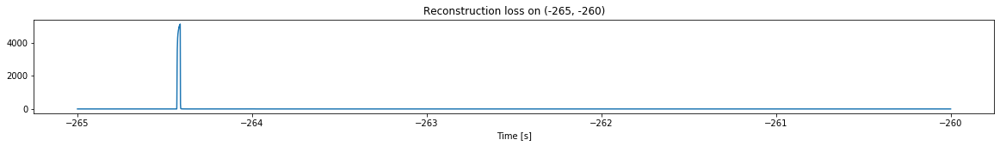

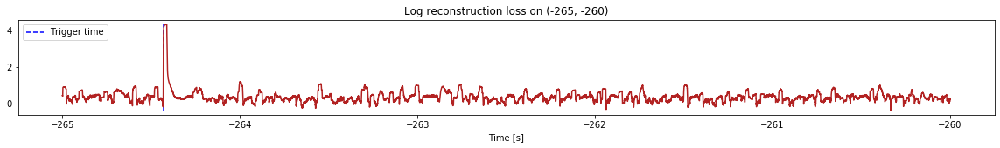

Triggered at:  -264.43106


-264.43106

In [7]:
simulation("./data/Ramp20/", 5, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.6496487784655355
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.6181464042601543
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.6496487784655355


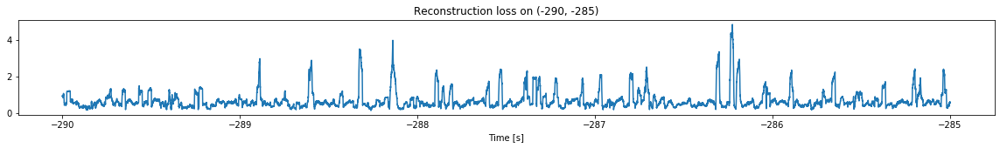

<--------
Entering sections:  (-285, -280)
-------->
Training for section:  (-290, -285)
Finished training, mean of the log(loss) is:  -0.6320290921854479
Triggering for section:  (-285, -280)
Using this mean for triggering: -0.6181464042601543


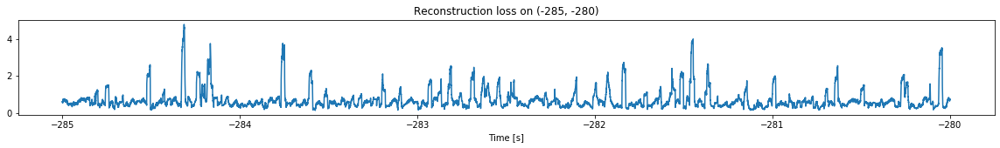

<--------
Entering sections:  (-280, -275)
-------->
Training for section:  (-285, -280)
Finished training, mean of the log(loss) is:  -0.6612265903300558
Triggering for section:  (-280, -275)
Using this mean for triggering: -0.6320290921854479


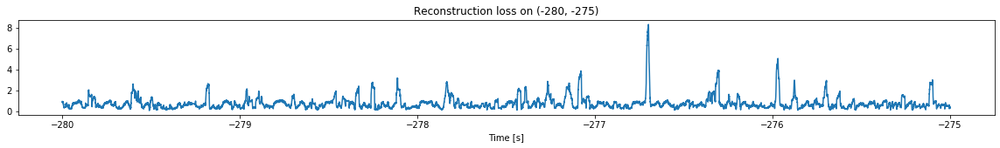

<--------
Entering sections:  (-275, -270)
-------->
Training for section:  (-280, -275)
Finished training, mean of the log(loss) is:  -0.5979722144546994
Triggering for section:  (-275, -270)
Using this mean for triggering: -0.6612265903300558


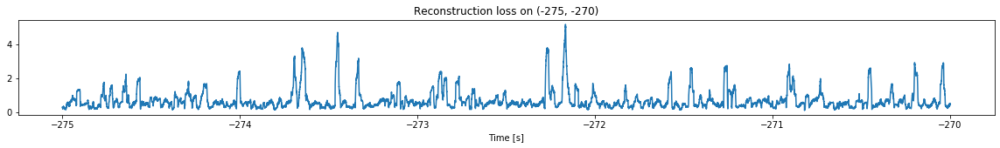

<--------
Entering sections:  (-270, -265)
-------->
Training for section:  (-275, -270)
Finished training, mean of the log(loss) is:  -0.553646214220203
Triggering for section:  (-270, -265)
Using this mean for triggering: -0.5979722144546994


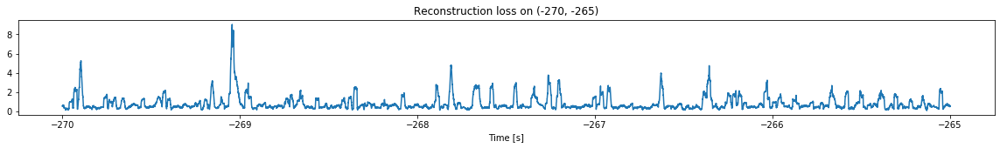

<--------
Entering sections:  (-265, -260)
-------->
Training for section:  (-270, -265)
Finished training, mean of the log(loss) is:  -0.500208256445127
Triggering for section:  (-265, -260)
Using this mean for triggering: -0.553646214220203


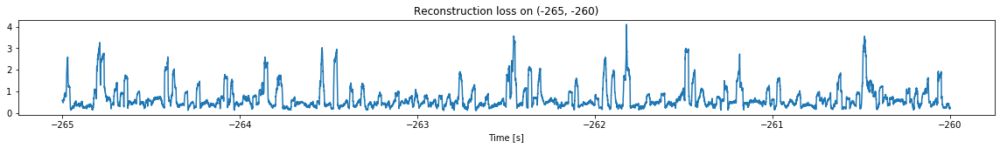

<--------
Entering sections:  (-260, -255)
-------->
Training for section:  (-265, -260)
Finished training, mean of the log(loss) is:  -0.6700705392641376
Triggering for section:  (-260, -255)
Using this mean for triggering: -0.500208256445127


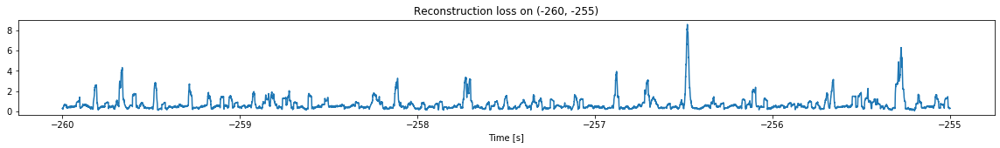

<--------
Entering sections:  (-255, -250)
-------->
Training for section:  (-260, -255)
Finished training, mean of the log(loss) is:  -0.5129992139894823
Triggering for section:  (-255, -250)
Using this mean for triggering: -0.6700705392641376


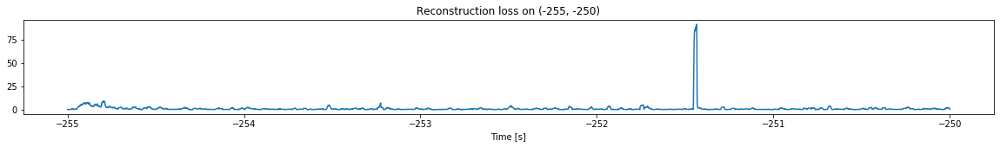

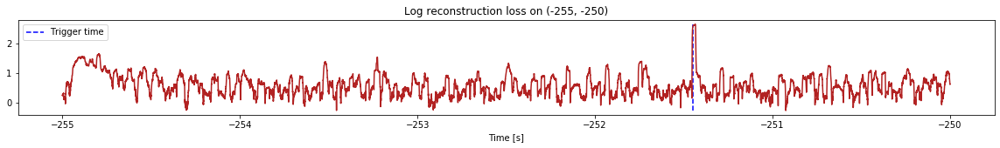

Triggered at:  -251.44987


-251.44987

In [8]:
simulation("./data/Ramp21/", 5, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.6257164397193081
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.6636853377326982
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.6257164397193081


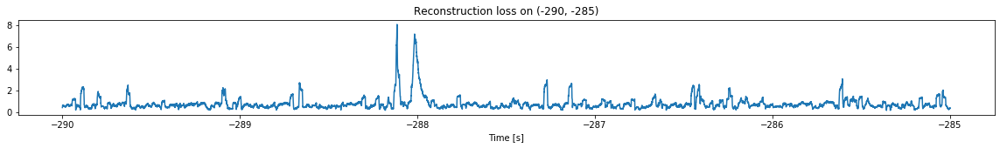

<--------
Entering sections:  (-285, -280)
-------->
Training for section:  (-290, -285)
Finished training, mean of the log(loss) is:  -0.5882438042845641
Triggering for section:  (-285, -280)
Using this mean for triggering: -0.6636853377326982


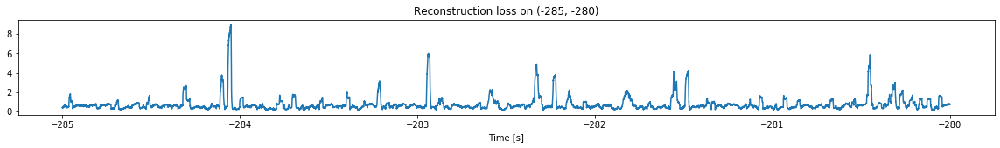

<--------
Entering sections:  (-280, -275)
-------->
Training for section:  (-285, -280)
Finished training, mean of the log(loss) is:  -0.6146536133748685
Triggering for section:  (-280, -275)
Using this mean for triggering: -0.5882438042845641


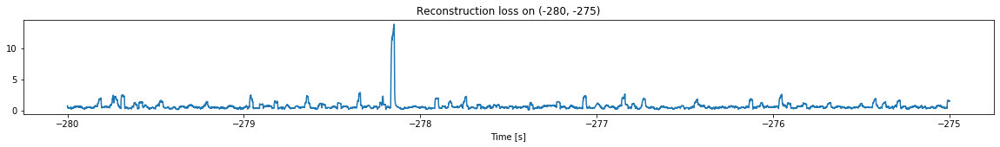

<--------
Entering sections:  (-275, -270)
-------->
Training for section:  (-280, -275)
Finished training, mean of the log(loss) is:  -0.5860094619043654
Triggering for section:  (-275, -270)
Using this mean for triggering: -0.6146536133748685


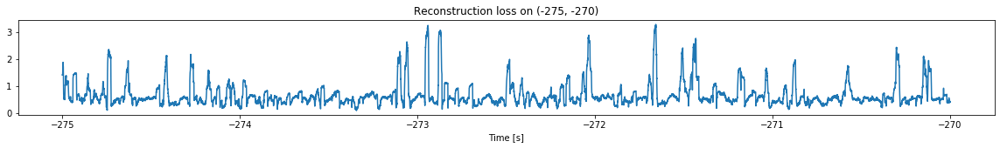

<--------
Entering sections:  (-270, -265)
-------->
Training for section:  (-275, -270)
Finished training, mean of the log(loss) is:  -0.6047718306440253
Triggering for section:  (-270, -265)
Using this mean for triggering: -0.5860094619043654


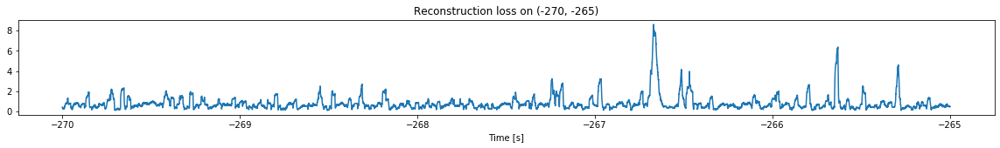

<--------
Entering sections:  (-265, -260)
-------->
Training for section:  (-270, -265)
Finished training, mean of the log(loss) is:  -0.6278476671772443
Triggering for section:  (-265, -260)
Using this mean for triggering: -0.6047718306440253


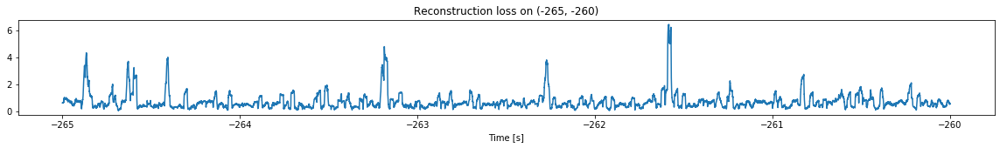

<--------
Entering sections:  (-260, -255)
-------->
Training for section:  (-265, -260)
Finished training, mean of the log(loss) is:  -0.5801039706486341
Triggering for section:  (-260, -255)
Using this mean for triggering: -0.6278476671772443


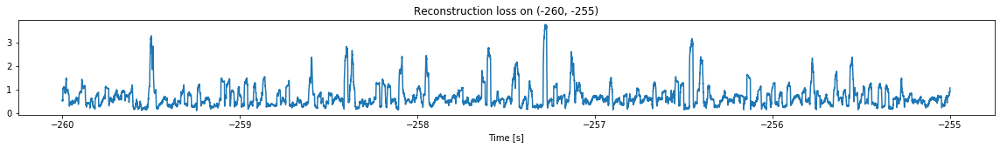

<--------
Entering sections:  (-255, -250)
-------->
Training for section:  (-260, -255)
Finished training, mean of the log(loss) is:  -0.6741156763408556
Triggering for section:  (-255, -250)
Using this mean for triggering: -0.5801039706486341


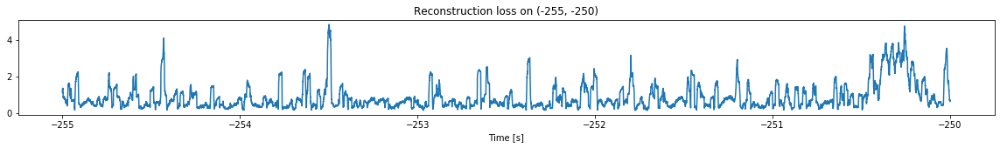

<--------
Entering sections:  (-250, -245)
-------->
Training for section:  (-255, -250)
Finished training, mean of the log(loss) is:  -0.5609368231713194
Triggering for section:  (-250, -245)
Using this mean for triggering: -0.6741156763408556


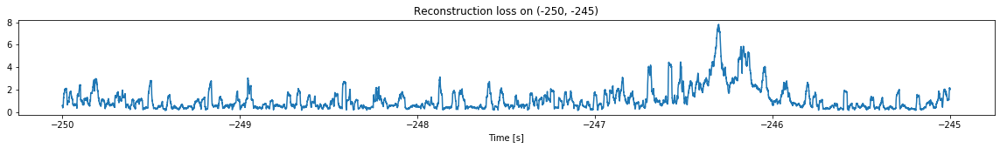

<--------
Entering sections:  (-245, -240)
-------->
Training for section:  (-250, -245)
Finished training, mean of the log(loss) is:  -0.48637967984677855
Triggering for section:  (-245, -240)
Using this mean for triggering: -0.5609368231713194


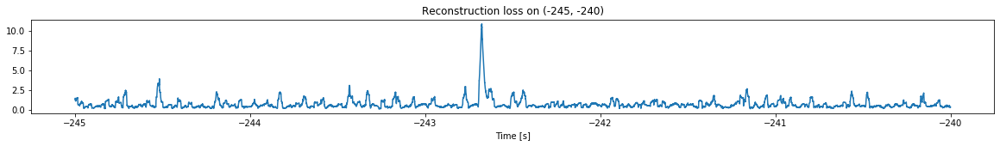

<--------
Entering sections:  (-240, -235)
-------->
Training for section:  (-245, -240)
Finished training, mean of the log(loss) is:  -0.47560738610712333
Triggering for section:  (-240, -235)
Using this mean for triggering: -0.48637967984677855


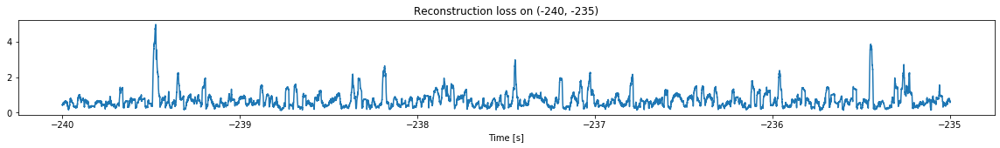

<--------
Entering sections:  (-235, -230)
-------->
Training for section:  (-240, -235)
Finished training, mean of the log(loss) is:  -0.6510218425932941
Triggering for section:  (-235, -230)
Using this mean for triggering: -0.47560738610712333


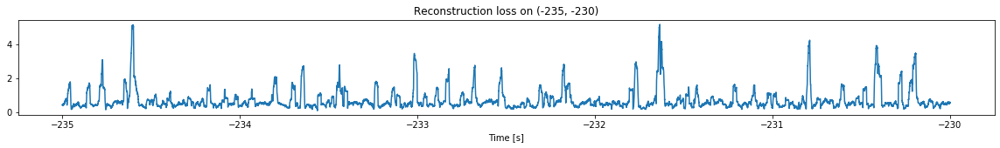

<--------
Entering sections:  (-230, -225)
-------->
Training for section:  (-235, -230)
Finished training, mean of the log(loss) is:  -0.5252362706890054
Triggering for section:  (-230, -225)
Using this mean for triggering: -0.6510218425932941


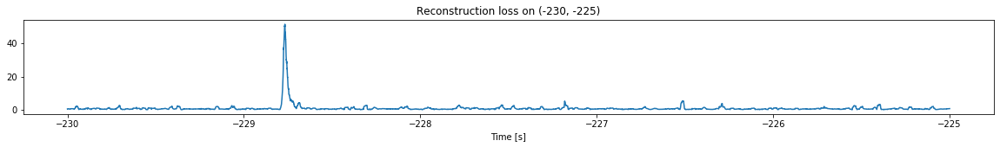

<--------
Entering sections:  (-225, -220)
-------->
Training for section:  (-230, -225)
Finished training, mean of the log(loss) is:  -0.4341645967224582
Triggering for section:  (-225, -220)
Using this mean for triggering: -0.5252362706890054


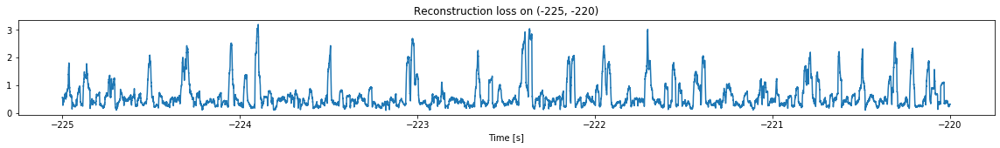

<--------
Entering sections:  (-220, -215)
-------->
Training for section:  (-225, -220)
Finished training, mean of the log(loss) is:  -0.6106611608141811
Triggering for section:  (-220, -215)
Using this mean for triggering: -0.4341645967224582


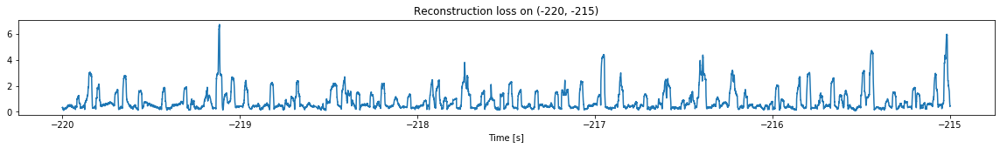

<--------
Entering sections:  (-215, -210)
-------->
Training for section:  (-220, -215)
Finished training, mean of the log(loss) is:  -0.5210325369903529
Triggering for section:  (-215, -210)
Using this mean for triggering: -0.6106611608141811


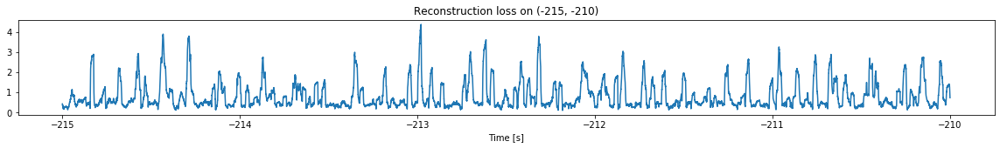

<--------
Entering sections:  (-210, -205)
-------->
Training for section:  (-215, -210)
Finished training, mean of the log(loss) is:  -0.537981310674341
Triggering for section:  (-210, -205)
Using this mean for triggering: -0.5210325369903529


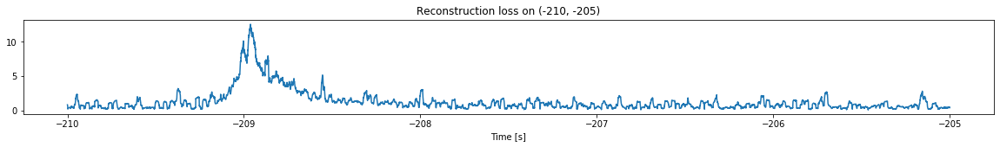

<--------
Entering sections:  (-205, -200)
-------->
Training for section:  (-210, -205)
Finished training, mean of the log(loss) is:  -0.4335815718950221
Triggering for section:  (-205, -200)
Using this mean for triggering: -0.537981310674341


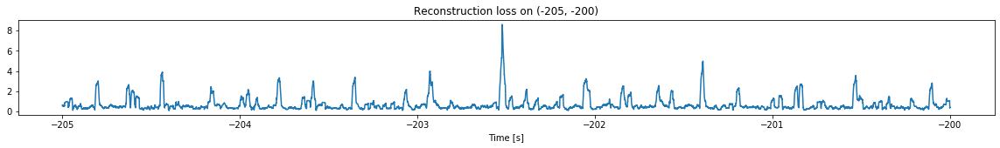

<--------
Entering sections:  (-200, -195)
-------->
Training for section:  (-205, -200)
Finished training, mean of the log(loss) is:  -0.5959278558304457
Triggering for section:  (-200, -195)
Using this mean for triggering: -0.4335815718950221


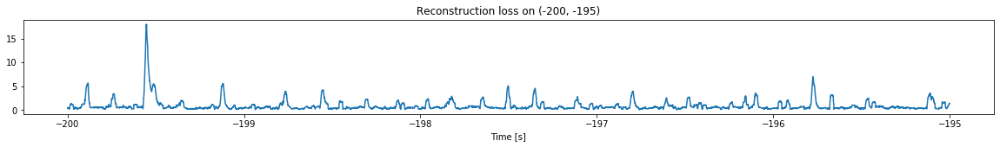

<--------
Entering sections:  (-195, -190)
-------->
Training for section:  (-200, -195)
Finished training, mean of the log(loss) is:  -0.5562179209224587
Triggering for section:  (-195, -190)
Using this mean for triggering: -0.5959278558304457


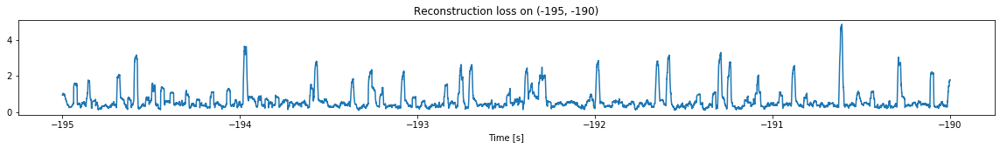

<--------
Entering sections:  (-190, -185)
-------->
Training for section:  (-195, -190)
Finished training, mean of the log(loss) is:  -0.6290077014540381
Triggering for section:  (-190, -185)
Using this mean for triggering: -0.5562179209224587


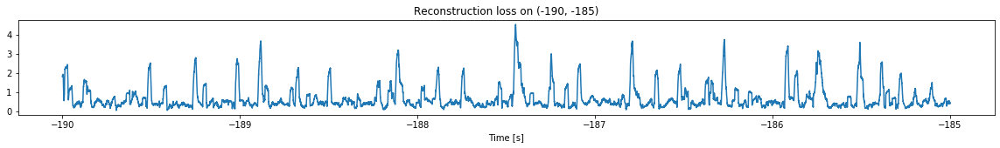

<--------
Entering sections:  (-185, -180)
-------->
Training for section:  (-190, -185)
Finished training, mean of the log(loss) is:  -0.5806177437928813
Triggering for section:  (-185, -180)
Using this mean for triggering: -0.6290077014540381


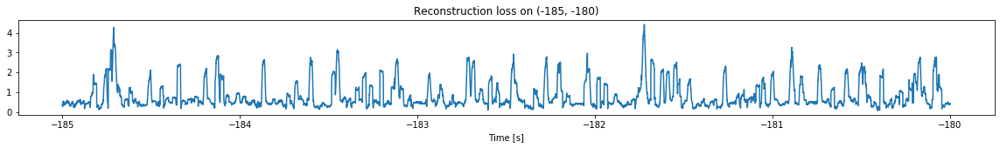

<--------
Entering sections:  (-180, -175)
-------->
Training for section:  (-185, -180)
Finished training, mean of the log(loss) is:  -0.5154572196573733
Triggering for section:  (-180, -175)
Using this mean for triggering: -0.5806177437928813


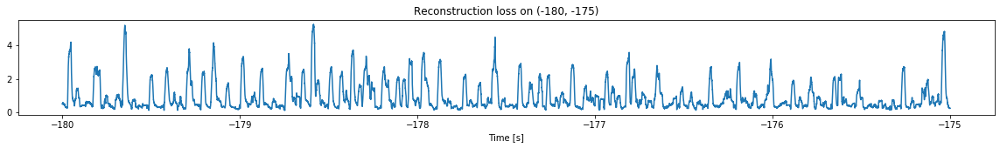

<--------
Entering sections:  (-175, -170)
-------->
Training for section:  (-180, -175)
Finished training, mean of the log(loss) is:  -0.6069250351617607
Triggering for section:  (-175, -170)
Using this mean for triggering: -0.5154572196573733


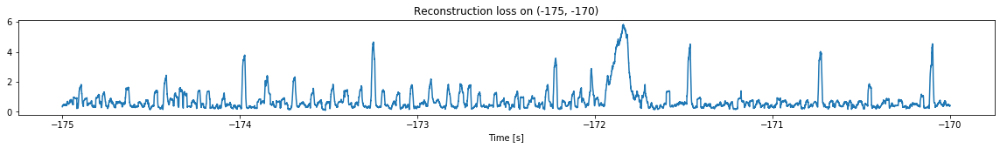

<--------
Entering sections:  (-170, -165)
-------->
Training for section:  (-175, -170)
Finished training, mean of the log(loss) is:  -0.5555479221236437
Triggering for section:  (-170, -165)
Using this mean for triggering: -0.6069250351617607


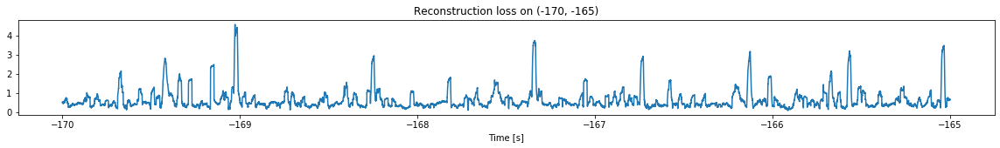

<--------
Entering sections:  (-165, -160)
-------->
Training for section:  (-170, -165)
Finished training, mean of the log(loss) is:  -0.7480045919520291
Triggering for section:  (-165, -160)
Using this mean for triggering: -0.5555479221236437


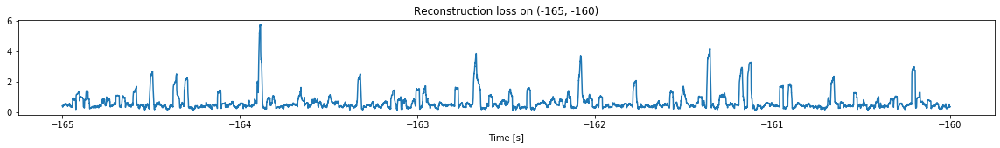

<--------
Entering sections:  (-160, -155)
-------->
Training for section:  (-165, -160)
Finished training, mean of the log(loss) is:  -0.7301002826570303
Triggering for section:  (-160, -155)
Using this mean for triggering: -0.7480045919520291


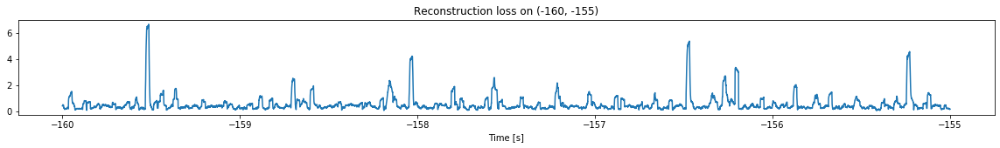

<--------
Entering sections:  (-155, -150)
-------->
Training for section:  (-160, -155)
Finished training, mean of the log(loss) is:  -0.6227604354679125
Triggering for section:  (-155, -150)
Using this mean for triggering: -0.7301002826570303


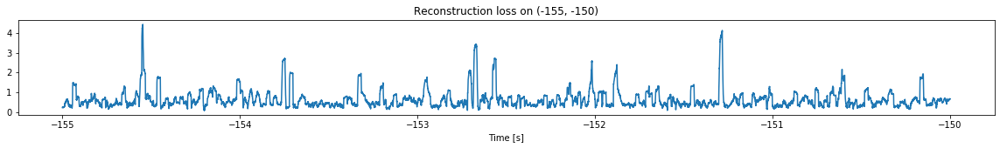

<--------
Entering sections:  (-150, -145)
-------->
Training for section:  (-155, -150)
Finished training, mean of the log(loss) is:  -0.7089227973491404
Triggering for section:  (-150, -145)
Using this mean for triggering: -0.6227604354679125


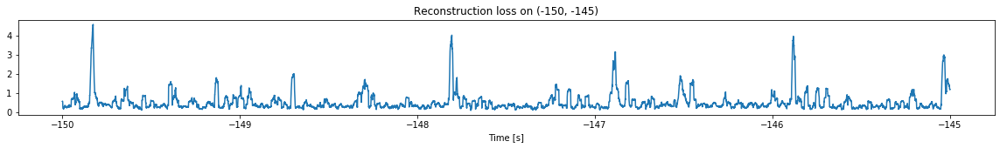

<--------
Entering sections:  (-145, -140)
-------->
Training for section:  (-150, -145)
Finished training, mean of the log(loss) is:  -0.6148901250471195
Triggering for section:  (-145, -140)
Using this mean for triggering: -0.7089227973491404


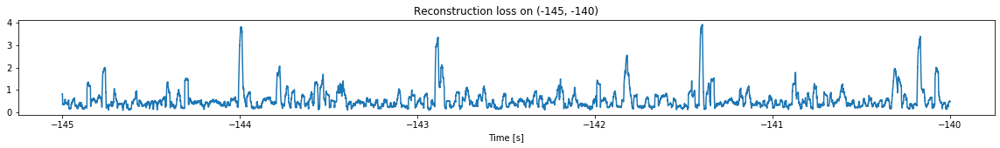

<--------
Entering sections:  (-140, -135)
-------->
Training for section:  (-145, -140)
Finished training, mean of the log(loss) is:  -0.6922964832415317
Triggering for section:  (-140, -135)
Using this mean for triggering: -0.6148901250471195


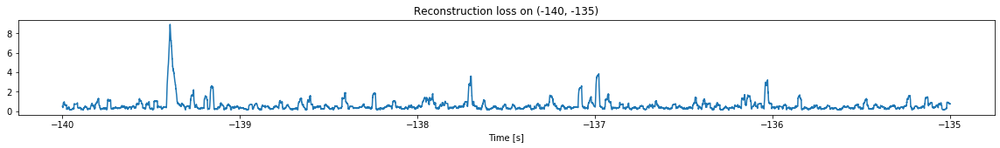

<--------
Entering sections:  (-135, -130)
-------->
Training for section:  (-140, -135)
Finished training, mean of the log(loss) is:  -0.5823649572582204
Triggering for section:  (-135, -130)
Using this mean for triggering: -0.6922964832415317


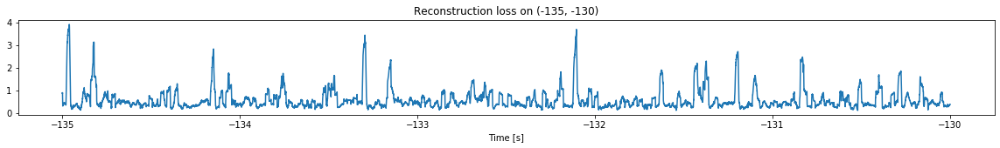

<--------
Entering sections:  (-130, -125)
-------->
Training for section:  (-135, -130)
Finished training, mean of the log(loss) is:  -0.7351884950659874
Triggering for section:  (-130, -125)
Using this mean for triggering: -0.5823649572582204


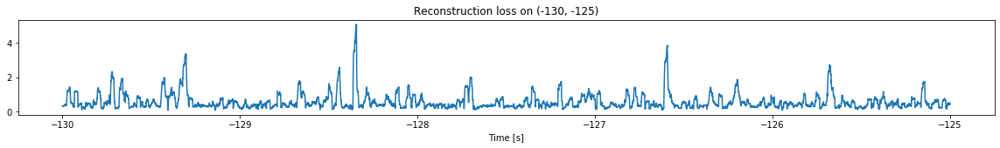

<--------
Entering sections:  (-125, -120)
-------->
Training for section:  (-130, -125)
Finished training, mean of the log(loss) is:  -0.6584451593232163
Triggering for section:  (-125, -120)
Using this mean for triggering: -0.7351884950659874


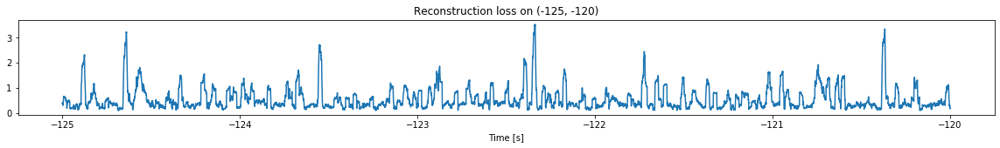

<--------
Entering sections:  (-120, -115)
-------->
Training for section:  (-125, -120)
Finished training, mean of the log(loss) is:  -0.6546788495972451
Triggering for section:  (-120, -115)
Using this mean for triggering: -0.6584451593232163


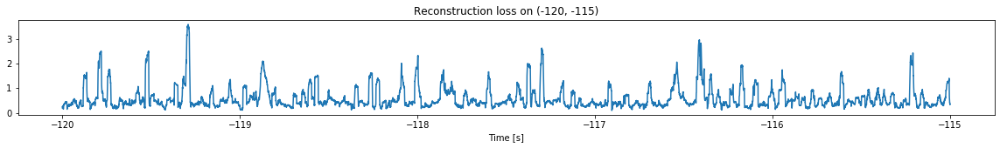

<--------
Entering sections:  (-115, -110)
-------->
Training for section:  (-120, -115)
Finished training, mean of the log(loss) is:  -0.6714598887419968
Triggering for section:  (-115, -110)
Using this mean for triggering: -0.6546788495972451


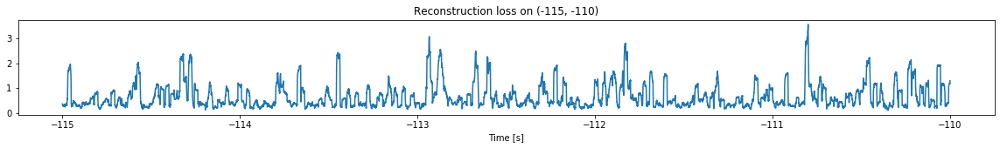

<--------
Entering sections:  (-110, -105)
-------->
Training for section:  (-115, -110)
Finished training, mean of the log(loss) is:  -0.6840696140462419
Triggering for section:  (-110, -105)
Using this mean for triggering: -0.6714598887419968


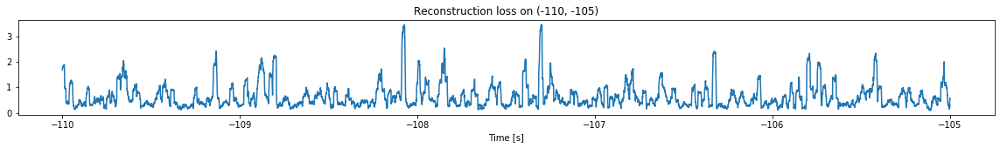

<--------
Entering sections:  (-105, -100)
-------->
Training for section:  (-110, -105)
Finished training, mean of the log(loss) is:  -0.6651408312280696
Triggering for section:  (-105, -100)
Using this mean for triggering: -0.6840696140462419


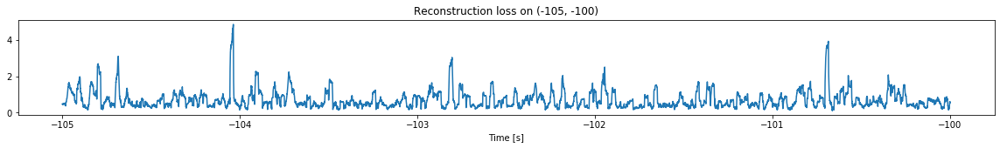

<--------
Entering sections:  (-100, -95)
-------->
Training for section:  (-105, -100)
Finished training, mean of the log(loss) is:  -0.5628566650376586
Triggering for section:  (-100, -95)
Using this mean for triggering: -0.6651408312280696


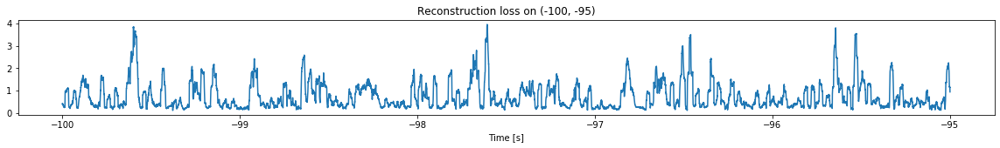

<--------
Entering sections:  (-95, -90)
-------->
Training for section:  (-100, -95)
Finished training, mean of the log(loss) is:  -0.6100288356965485
Triggering for section:  (-95, -90)
Using this mean for triggering: -0.5628566650376586


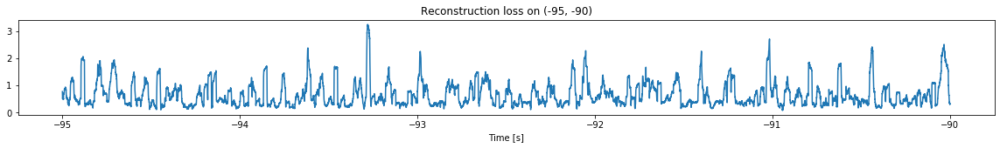

<--------
Entering sections:  (-90, -85)
-------->
Training for section:  (-95, -90)
Finished training, mean of the log(loss) is:  -0.5685743718205617
Triggering for section:  (-90, -85)
Using this mean for triggering: -0.6100288356965485


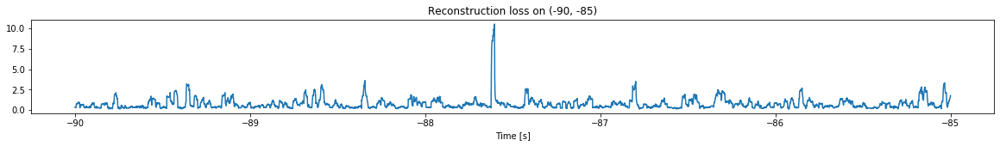

<--------
Entering sections:  (-85, -80)
-------->
Training for section:  (-90, -85)
Finished training, mean of the log(loss) is:  -0.6127965713395462
Triggering for section:  (-85, -80)
Using this mean for triggering: -0.5685743718205617


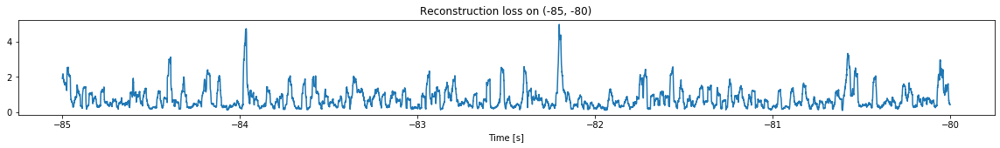

<--------
Entering sections:  (-80, -75)
-------->
Training for section:  (-85, -80)
Finished training, mean of the log(loss) is:  -0.5735593818021516
Triggering for section:  (-80, -75)
Using this mean for triggering: -0.6127965713395462


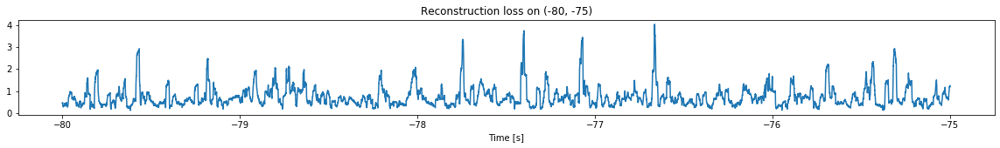

<--------
Entering sections:  (-75, -70)
-------->
Training for section:  (-80, -75)
Finished training, mean of the log(loss) is:  -0.6151539570950407
Triggering for section:  (-75, -70)
Using this mean for triggering: -0.5735593818021516


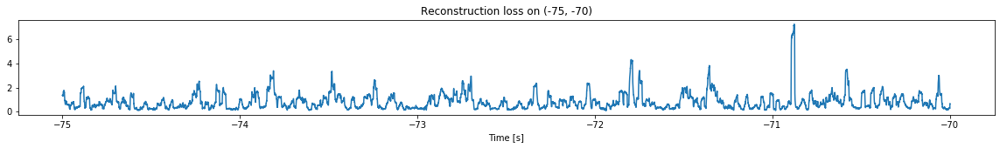

<--------
Entering sections:  (-70, -65)
-------->
Training for section:  (-75, -70)
Finished training, mean of the log(loss) is:  -0.5632027961593843
Triggering for section:  (-70, -65)
Using this mean for triggering: -0.6151539570950407


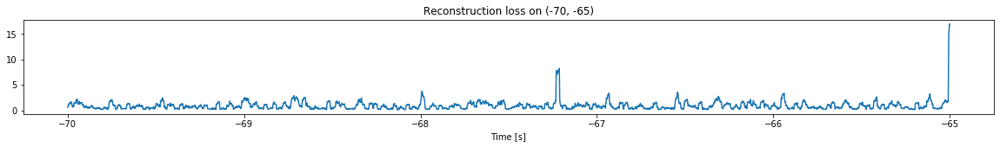

<--------
Entering sections:  (-65, -60)
-------->
Training for section:  (-70, -65)
Finished training, mean of the log(loss) is:  -0.4588468325532208
Triggering for section:  (-65, -60)
Using this mean for triggering: -0.5632027961593843


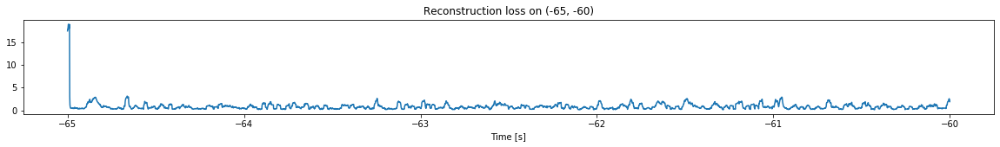

<--------
Entering sections:  (-60, -55)
-------->
Training for section:  (-65, -60)
Finished training, mean of the log(loss) is:  -0.5081317751789016
Triggering for section:  (-60, -55)
Using this mean for triggering: -0.4588468325532208


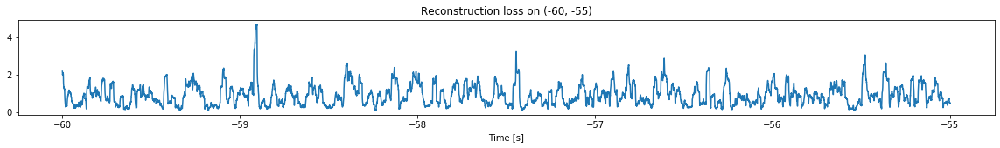

<--------
Entering sections:  (-55, -50)
-------->
Training for section:  (-60, -55)
Finished training, mean of the log(loss) is:  -0.6338784025222642
Triggering for section:  (-55, -50)
Using this mean for triggering: -0.5081317751789016


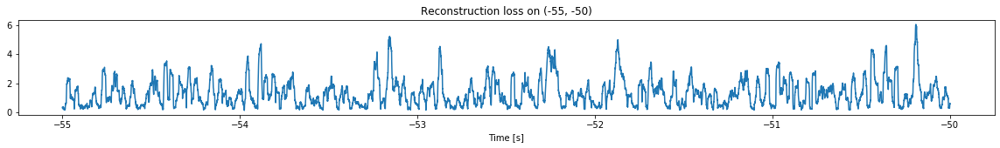

<--------
Entering sections:  (-50, -45)
-------->
Training for section:  (-55, -50)
Finished training, mean of the log(loss) is:  -0.5984130912207287
Triggering for section:  (-50, -45)
Using this mean for triggering: -0.6338784025222642


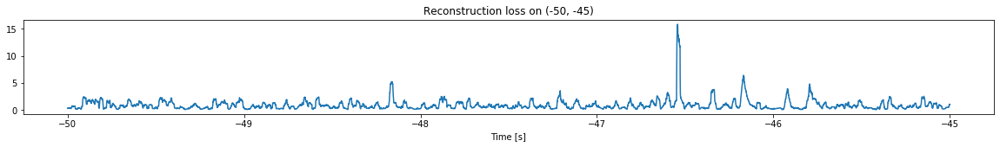

<--------
Entering sections:  (-45, -40)
-------->
Training for section:  (-50, -45)
Finished training, mean of the log(loss) is:  -0.4486148219553586
Triggering for section:  (-45, -40)
Using this mean for triggering: -0.5984130912207287


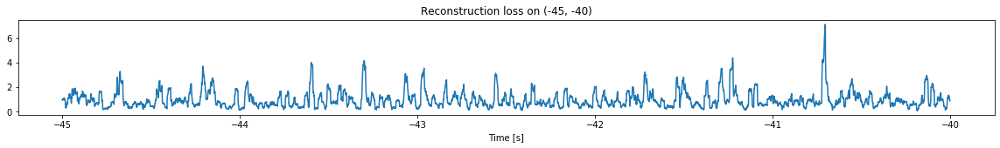

<--------
Entering sections:  (-40, -35)
-------->
Training for section:  (-45, -40)
Finished training, mean of the log(loss) is:  -0.498438889450084
Triggering for section:  (-40, -35)
Using this mean for triggering: -0.4486148219553586


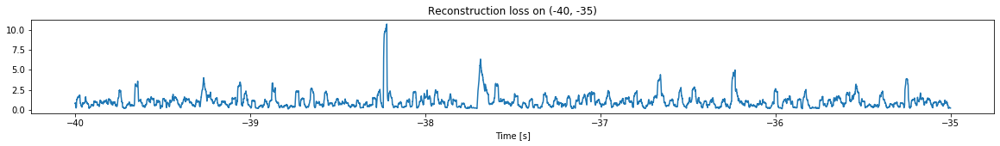

<--------
Entering sections:  (-35, -30)
-------->
Training for section:  (-40, -35)
Finished training, mean of the log(loss) is:  -0.46547721581395657
Triggering for section:  (-35, -30)
Using this mean for triggering: -0.498438889450084


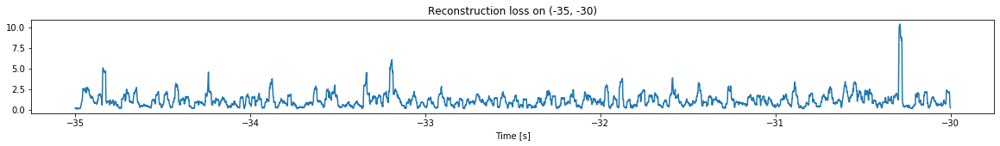

<--------
Entering sections:  (-30, -25)
-------->
Training for section:  (-35, -30)
Finished training, mean of the log(loss) is:  -0.5083928761373532
Triggering for section:  (-30, -25)
Using this mean for triggering: -0.46547721581395657


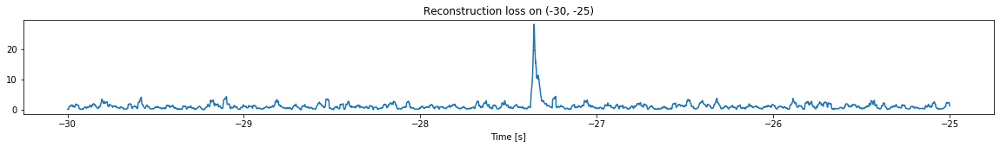

<--------
Entering sections:  (-25, -20)
-------->
Training for section:  (-30, -25)
Finished training, mean of the log(loss) is:  -0.4487146691900993
Triggering for section:  (-25, -20)
Using this mean for triggering: -0.5083928761373532


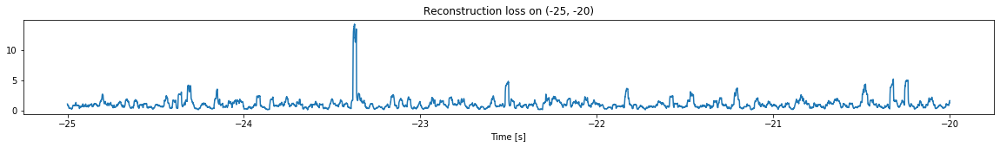

<--------
Entering sections:  (-20, -15)
-------->
Training for section:  (-25, -20)
Finished training, mean of the log(loss) is:  -0.44830836287782555
Triggering for section:  (-20, -15)
Using this mean for triggering: -0.4487146691900993


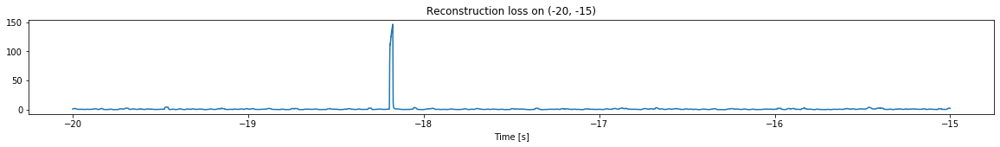

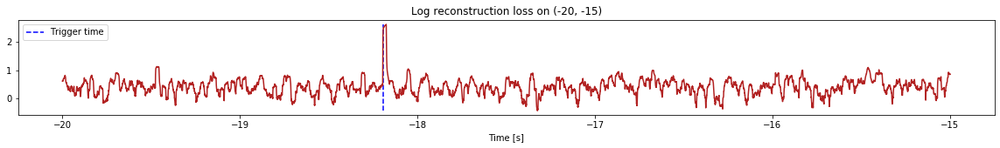

Triggered at:  -18.19139


-18.19139

In [9]:
simulation("./data/Ramp22/", 5, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (497500, 12)
Flushing input history
Number of sections: 10
Entering sections:  (-50, -45)
-------->
Entering sections:  (-45, -40)
-------->
Training for section:  (None, -45)
Finished training, mean of the log(loss) is:  -0.6563974121286663
<--------
Entering sections:  (-40, -35)
-------->
Training for section:  (-45, -40)
Finished training, mean of the log(loss) is:  -0.7705776376023709
Triggering for section:  (-40, -35)
Using this mean for triggering: -0.6563974121286663


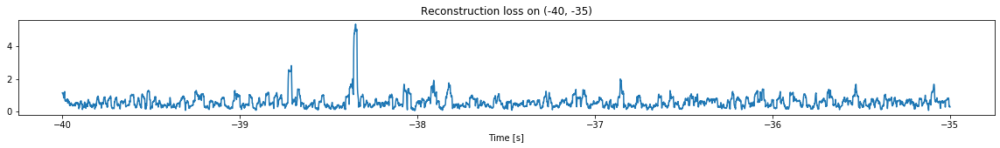

<--------
Entering sections:  (-35, -30)
-------->
Training for section:  (-40, -35)
Finished training, mean of the log(loss) is:  -0.6168794585076703
Triggering for section:  (-35, -30)
Using this mean for triggering: -0.7705776376023709


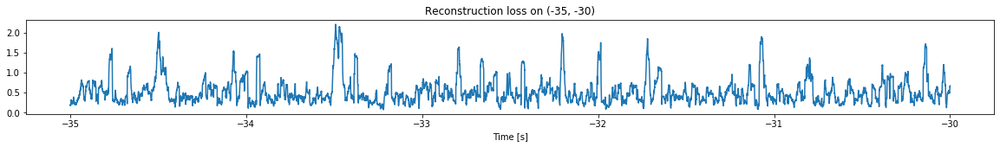

<--------
Entering sections:  (-30, -25)
-------->
Training for section:  (-35, -30)
Finished training, mean of the log(loss) is:  -0.704222716458387
Triggering for section:  (-30, -25)
Using this mean for triggering: -0.6168794585076703


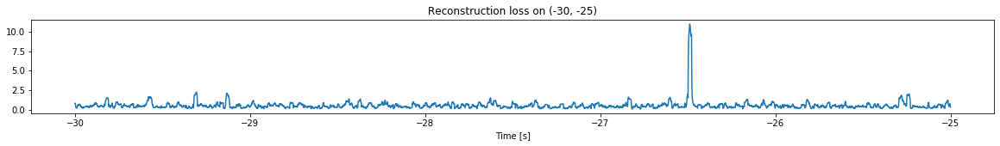

<--------
Entering sections:  (-25, -20)
-------->
Training for section:  (-30, -25)
Finished training, mean of the log(loss) is:  -0.637941635074097
Triggering for section:  (-25, -20)
Using this mean for triggering: -0.704222716458387


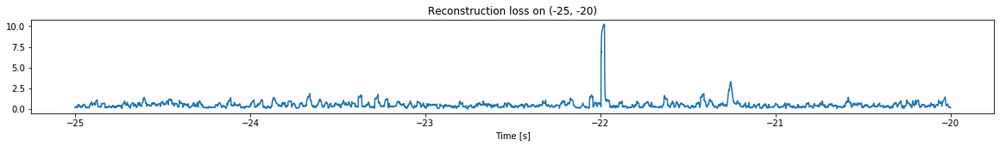

<--------
Entering sections:  (-20, -15)
-------->
Training for section:  (-25, -20)
Finished training, mean of the log(loss) is:  -0.608507370062958
Triggering for section:  (-20, -15)
Using this mean for triggering: -0.637941635074097


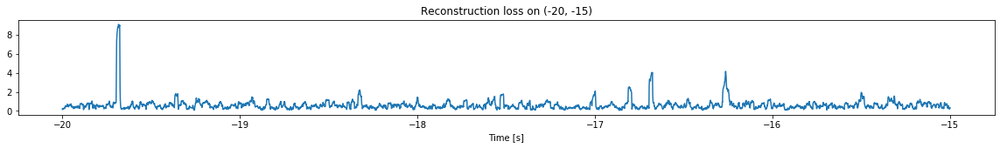

<--------
Entering sections:  (-15, -10)
-------->
Training for section:  (-20, -15)
Finished training, mean of the log(loss) is:  -0.6231275377949735
Triggering for section:  (-15, -10)
Using this mean for triggering: -0.608507370062958


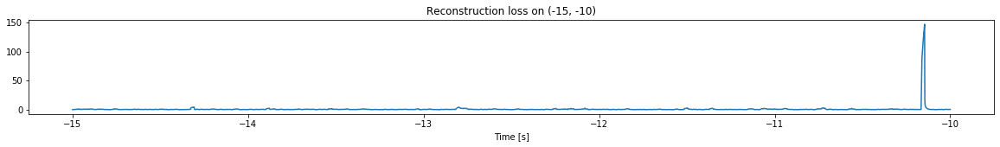

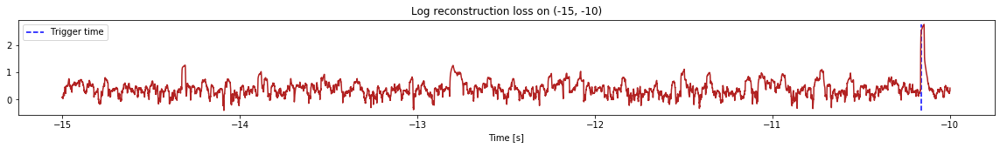

Triggered at:  -10.1623


-10.1623

In [10]:
simulation("./data/Ramp23/", 5, (-50,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.6379769192356525
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.663085133455756
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.6379769192356525


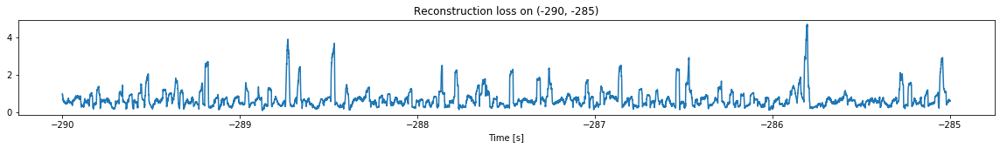

<--------
Entering sections:  (-285, -280)
-------->
Training for section:  (-290, -285)
Finished training, mean of the log(loss) is:  -0.6776717279958865
Triggering for section:  (-285, -280)
Using this mean for triggering: -0.663085133455756


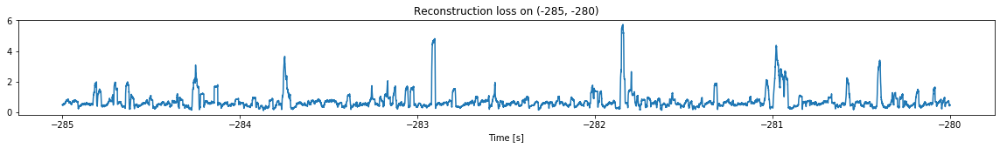

<--------
Entering sections:  (-280, -275)
-------->
Training for section:  (-285, -280)
Finished training, mean of the log(loss) is:  -0.630510011200759
Triggering for section:  (-280, -275)
Using this mean for triggering: -0.6776717279958865


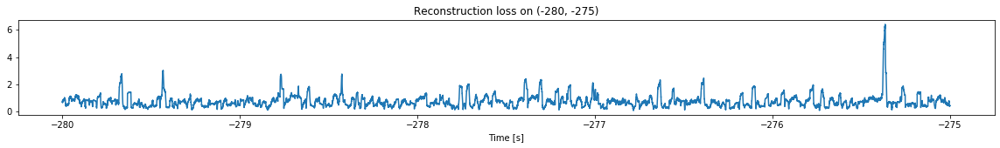

<--------
Entering sections:  (-275, -270)
-------->
Training for section:  (-280, -275)
Finished training, mean of the log(loss) is:  -0.5654907359713282
Triggering for section:  (-275, -270)
Using this mean for triggering: -0.630510011200759


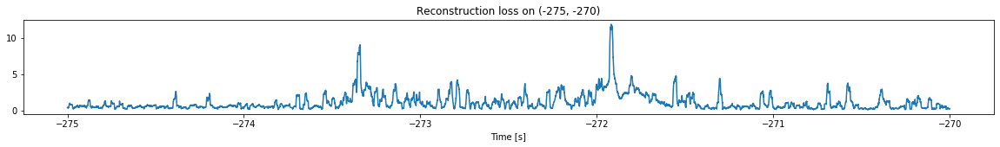

<--------
Entering sections:  (-270, -265)
-------->
Training for section:  (-275, -270)
Finished training, mean of the log(loss) is:  -0.49557120310849956
Triggering for section:  (-270, -265)
Using this mean for triggering: -0.5654907359713282


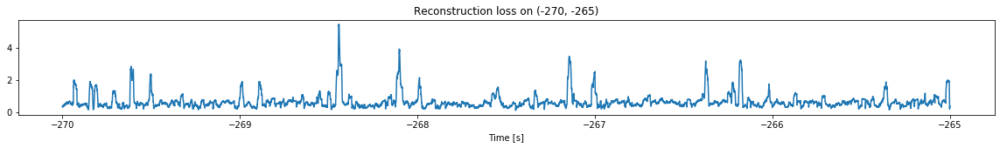

<--------
Entering sections:  (-265, -260)
-------->
Training for section:  (-270, -265)
Finished training, mean of the log(loss) is:  -0.630580063066483
Triggering for section:  (-265, -260)
Using this mean for triggering: -0.49557120310849956


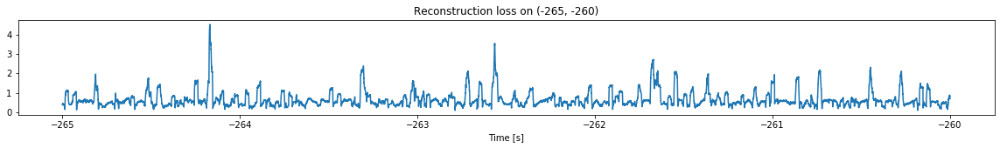

<--------
Entering sections:  (-260, -255)
-------->
Training for section:  (-265, -260)
Finished training, mean of the log(loss) is:  -0.6585244106242891
Triggering for section:  (-260, -255)
Using this mean for triggering: -0.630580063066483


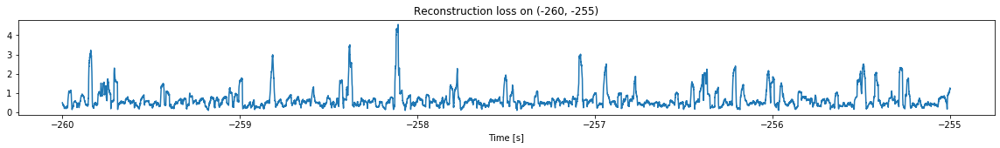

<--------
Entering sections:  (-255, -250)
-------->
Training for section:  (-260, -255)
Finished training, mean of the log(loss) is:  -0.6005163478804291
Triggering for section:  (-255, -250)
Using this mean for triggering: -0.6585244106242891


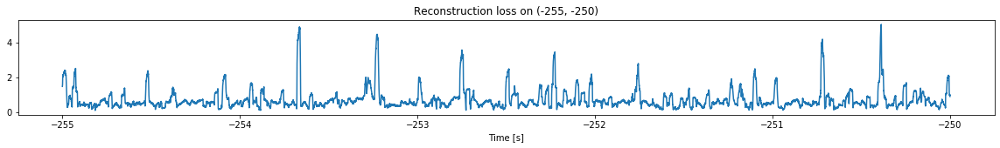

<--------
Entering sections:  (-250, -245)
-------->
Training for section:  (-255, -250)
Finished training, mean of the log(loss) is:  -0.5650202314414496
Triggering for section:  (-250, -245)
Using this mean for triggering: -0.6005163478804291


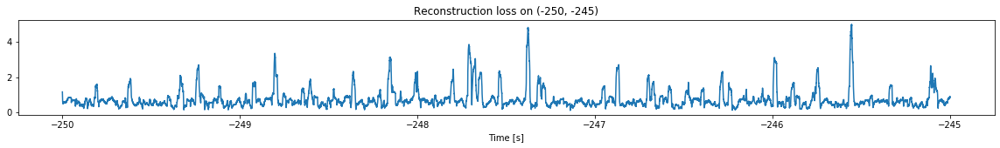

<--------
Entering sections:  (-245, -240)
-------->
Training for section:  (-250, -245)
Finished training, mean of the log(loss) is:  -0.6665767300458033
Triggering for section:  (-245, -240)
Using this mean for triggering: -0.5650202314414496


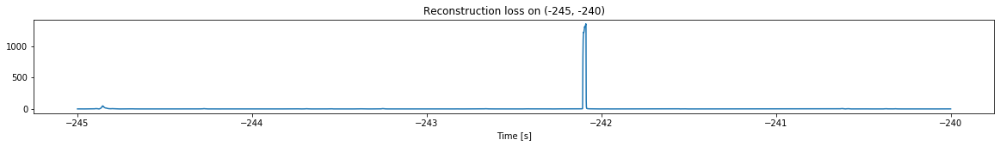

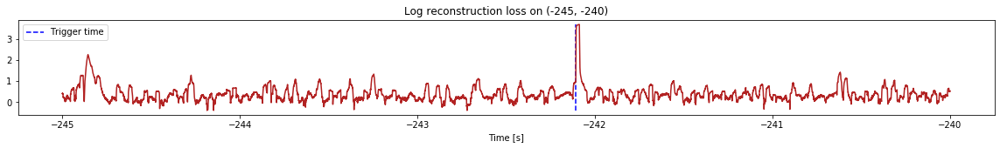

Triggered at:  -242.10707


-242.10707

In [11]:
simulation("./data/Ramp24/", 5, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.6397802151943809
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.63136566520884
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.6397802151943809


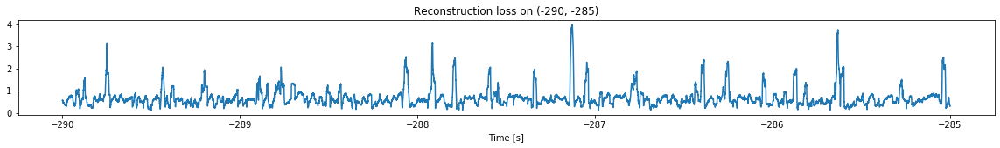

<--------
Entering sections:  (-285, -280)
-------->
Training for section:  (-290, -285)
Finished training, mean of the log(loss) is:  -0.6831396561255634
Triggering for section:  (-285, -280)
Using this mean for triggering: -0.63136566520884


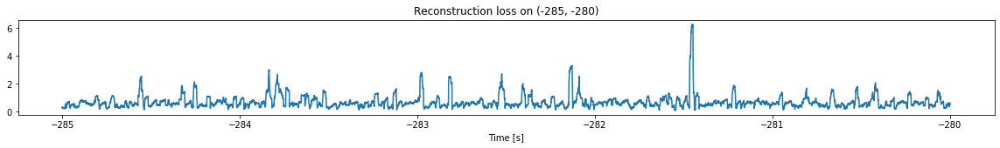

<--------
Entering sections:  (-280, -275)
-------->
Training for section:  (-285, -280)
Finished training, mean of the log(loss) is:  -0.6767911122361023
Triggering for section:  (-280, -275)
Using this mean for triggering: -0.6831396561255634


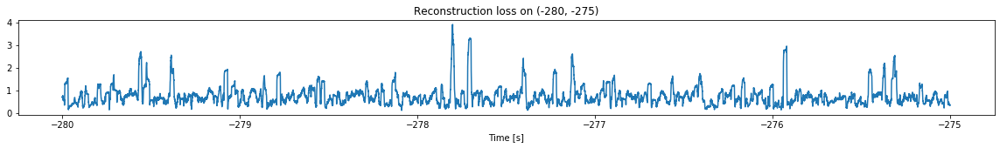

<--------
Entering sections:  (-275, -270)
-------->
Training for section:  (-280, -275)
Finished training, mean of the log(loss) is:  -0.6852889750931863
Triggering for section:  (-275, -270)
Using this mean for triggering: -0.6767911122361023


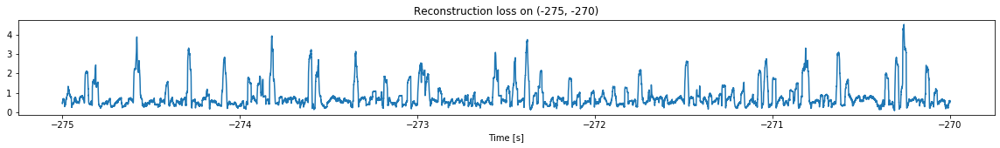

<--------
Entering sections:  (-270, -265)
-------->
Training for section:  (-275, -270)
Finished training, mean of the log(loss) is:  -0.6021208714694405
Triggering for section:  (-270, -265)
Using this mean for triggering: -0.6852889750931863


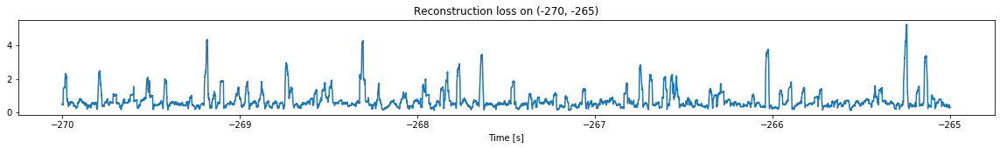

<--------
Entering sections:  (-265, -260)
-------->
Training for section:  (-270, -265)
Finished training, mean of the log(loss) is:  -0.6141978074220463
Triggering for section:  (-265, -260)
Using this mean for triggering: -0.6021208714694405


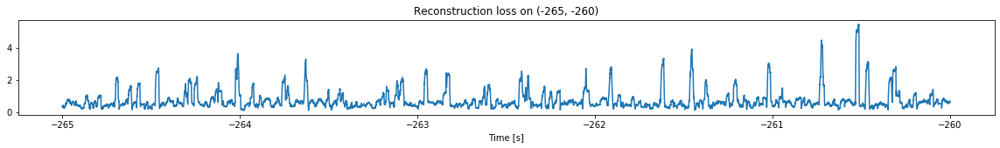

<--------
Entering sections:  (-260, -255)
-------->
Training for section:  (-265, -260)
Finished training, mean of the log(loss) is:  -0.6077514362668456
Triggering for section:  (-260, -255)
Using this mean for triggering: -0.6141978074220463


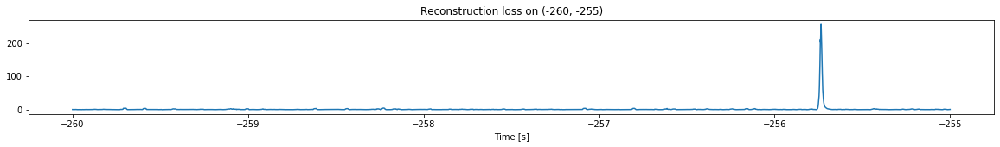

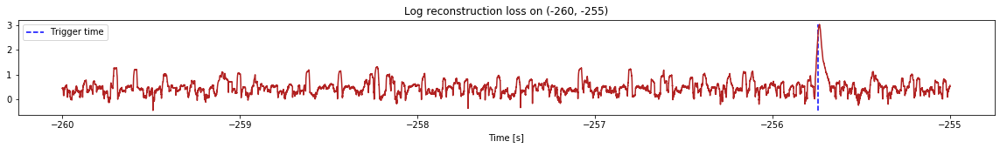

Triggered at:  -255.7444


-255.7444

In [12]:
simulation("./data/Ramp25/", 5, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.6251454232486641
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.6288779130302548
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.6251454232486641


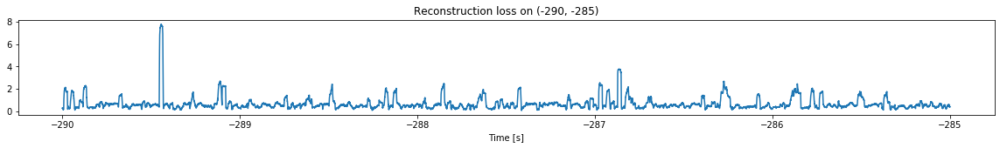

<--------
Entering sections:  (-285, -280)
-------->
Training for section:  (-290, -285)
Finished training, mean of the log(loss) is:  -0.6644845511918747
Triggering for section:  (-285, -280)
Using this mean for triggering: -0.6288779130302548


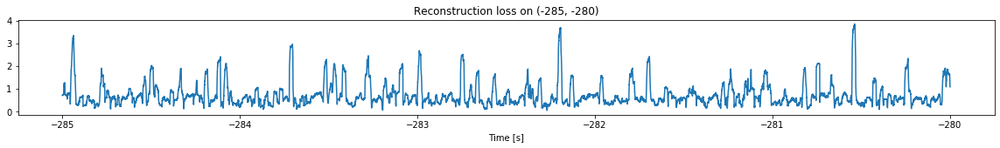

<--------
Entering sections:  (-280, -275)
-------->
Training for section:  (-285, -280)
Finished training, mean of the log(loss) is:  -0.6842208203497208
Triggering for section:  (-280, -275)
Using this mean for triggering: -0.6644845511918747


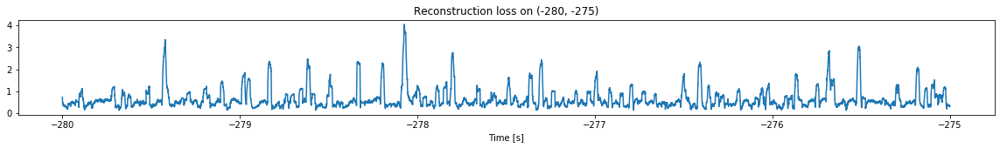

<--------
Entering sections:  (-275, -270)
-------->
Training for section:  (-280, -275)
Finished training, mean of the log(loss) is:  -0.6512942094852822
Triggering for section:  (-275, -270)
Using this mean for triggering: -0.6842208203497208


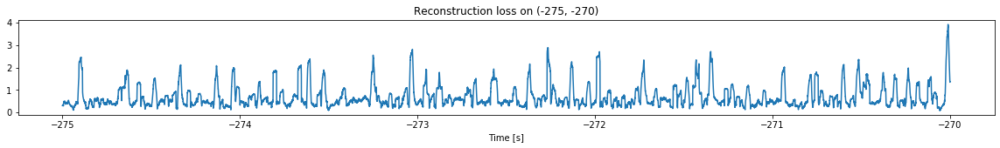

<--------
Entering sections:  (-270, -265)
-------->
Training for section:  (-275, -270)
Finished training, mean of the log(loss) is:  -0.6020129547428242
Triggering for section:  (-270, -265)
Using this mean for triggering: -0.6512942094852822


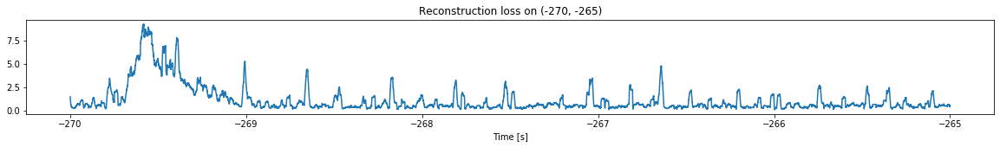

<--------
Entering sections:  (-265, -260)
-------->
Training for section:  (-270, -265)
Finished training, mean of the log(loss) is:  -0.5133351590395208
Triggering for section:  (-265, -260)
Using this mean for triggering: -0.6020129547428242


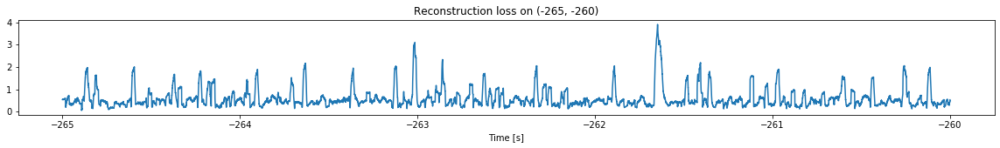

<--------
Entering sections:  (-260, -255)
-------->
Training for section:  (-265, -260)
Finished training, mean of the log(loss) is:  -0.6999658559196869
Triggering for section:  (-260, -255)
Using this mean for triggering: -0.5133351590395208


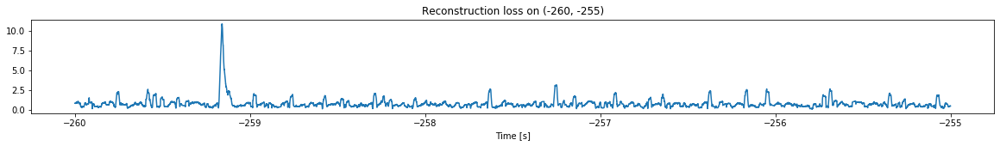

<--------
Entering sections:  (-255, -250)
-------->
Training for section:  (-260, -255)
Finished training, mean of the log(loss) is:  -0.6288161672787
Triggering for section:  (-255, -250)
Using this mean for triggering: -0.6999658559196869


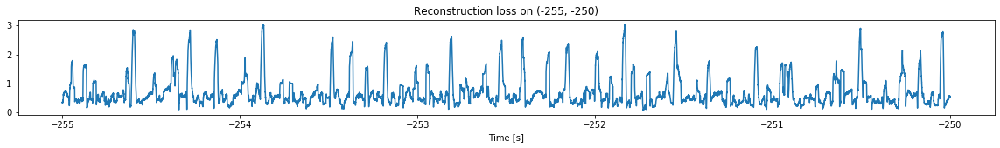

<--------
Entering sections:  (-250, -245)
-------->
Training for section:  (-255, -250)
Finished training, mean of the log(loss) is:  -0.6755007851881444
Triggering for section:  (-250, -245)
Using this mean for triggering: -0.6288161672787


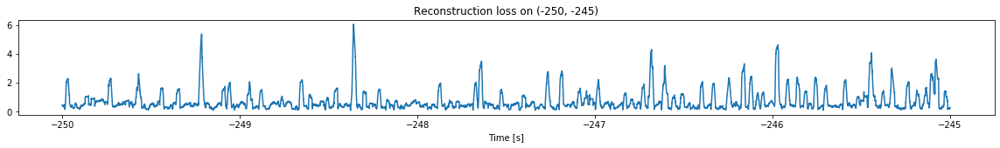

<--------
Entering sections:  (-245, -240)
-------->
Training for section:  (-250, -245)
Finished training, mean of the log(loss) is:  -0.5749442223122554
Triggering for section:  (-245, -240)
Using this mean for triggering: -0.6755007851881444


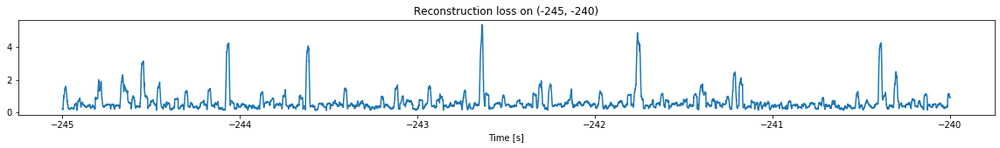

<--------
Entering sections:  (-240, -235)
-------->
Training for section:  (-245, -240)
Finished training, mean of the log(loss) is:  -0.7189458463599281
Triggering for section:  (-240, -235)
Using this mean for triggering: -0.5749442223122554


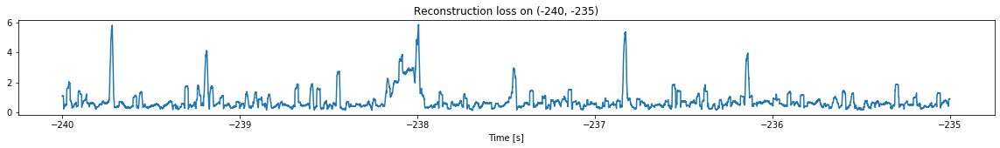

<--------
Entering sections:  (-235, -230)
-------->
Training for section:  (-240, -235)
Finished training, mean of the log(loss) is:  -0.6890315319711726
Triggering for section:  (-235, -230)
Using this mean for triggering: -0.7189458463599281


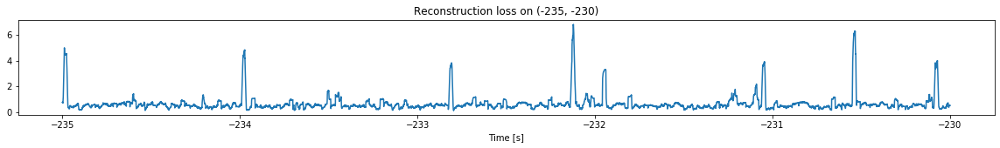

<--------
Entering sections:  (-230, -225)
-------->
Training for section:  (-235, -230)
Finished training, mean of the log(loss) is:  -0.7086495618170884
Triggering for section:  (-230, -225)
Using this mean for triggering: -0.6890315319711726


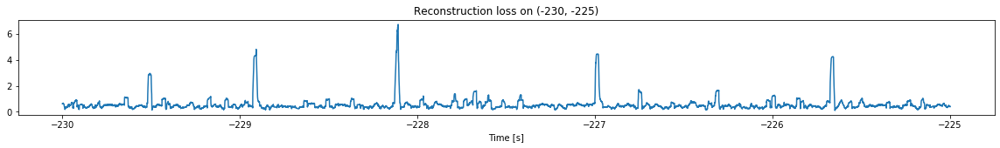

<--------
Entering sections:  (-225, -220)
-------->
Training for section:  (-230, -225)
Finished training, mean of the log(loss) is:  -0.6873346161423709
Triggering for section:  (-225, -220)
Using this mean for triggering: -0.7086495618170884


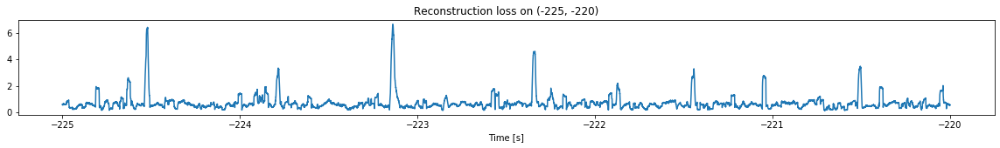

<--------
Entering sections:  (-220, -215)
-------->
Training for section:  (-225, -220)
Finished training, mean of the log(loss) is:  -0.7168702766257251
Triggering for section:  (-220, -215)
Using this mean for triggering: -0.6873346161423709


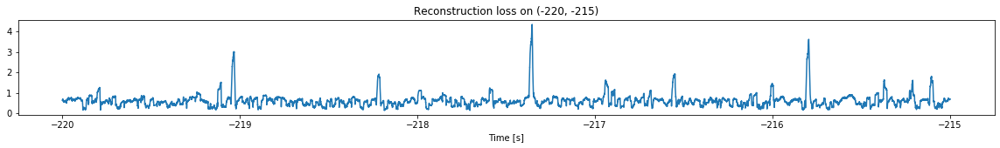

<--------
Entering sections:  (-215, -210)
-------->
Training for section:  (-220, -215)
Finished training, mean of the log(loss) is:  -0.7515450428769452
Triggering for section:  (-215, -210)
Using this mean for triggering: -0.7168702766257251


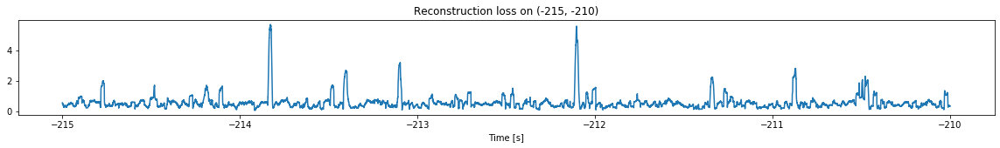

<--------
Entering sections:  (-210, -205)
-------->
Training for section:  (-215, -210)
Finished training, mean of the log(loss) is:  -0.7917946891303939
Triggering for section:  (-210, -205)
Using this mean for triggering: -0.7515450428769452


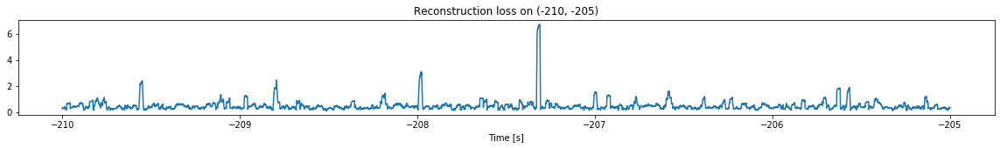

<--------
Entering sections:  (-205, -200)
-------->
Training for section:  (-210, -205)
Finished training, mean of the log(loss) is:  -0.710047198799081
Triggering for section:  (-205, -200)
Using this mean for triggering: -0.7917946891303939


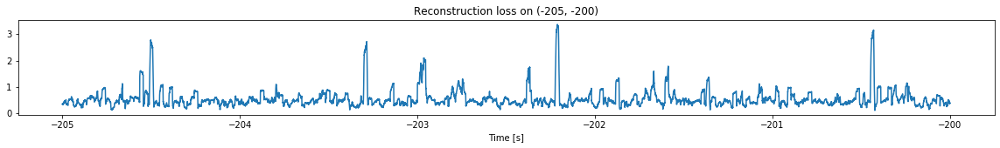

<--------
Entering sections:  (-200, -195)
-------->
Training for section:  (-205, -200)
Finished training, mean of the log(loss) is:  -0.7159384183471786
Triggering for section:  (-200, -195)
Using this mean for triggering: -0.710047198799081


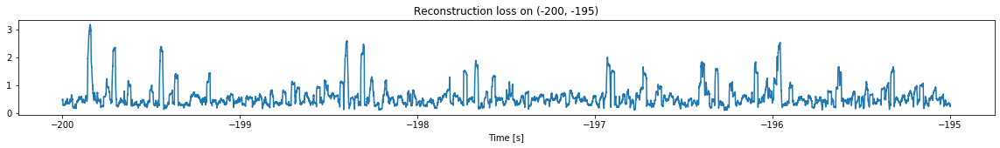

<--------
Entering sections:  (-195, -190)
-------->
Training for section:  (-200, -195)
Finished training, mean of the log(loss) is:  -0.7612746883360842
Triggering for section:  (-195, -190)
Using this mean for triggering: -0.7159384183471786


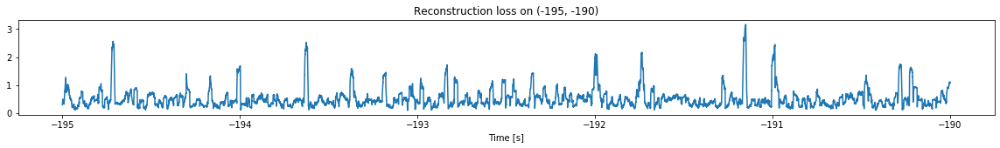

<--------
Entering sections:  (-190, -185)
-------->
Training for section:  (-195, -190)
Finished training, mean of the log(loss) is:  -0.815207735486509
Triggering for section:  (-190, -185)
Using this mean for triggering: -0.7612746883360842


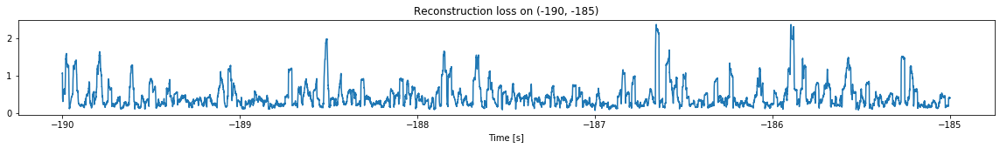

<--------
Entering sections:  (-185, -180)
-------->
Training for section:  (-190, -185)
Finished training, mean of the log(loss) is:  -0.6975452489088745
Triggering for section:  (-185, -180)
Using this mean for triggering: -0.815207735486509


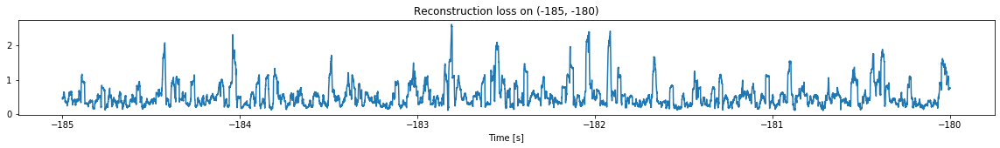

<--------
Entering sections:  (-180, -175)
-------->
Training for section:  (-185, -180)
Finished training, mean of the log(loss) is:  -0.7042118191799388
Triggering for section:  (-180, -175)
Using this mean for triggering: -0.6975452489088745


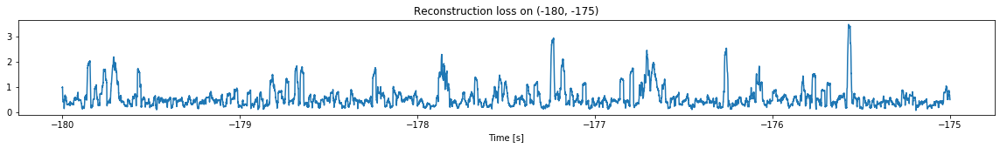

<--------
Entering sections:  (-175, -170)
-------->
Training for section:  (-180, -175)
Finished training, mean of the log(loss) is:  -0.6575105121634294
Triggering for section:  (-175, -170)
Using this mean for triggering: -0.7042118191799388


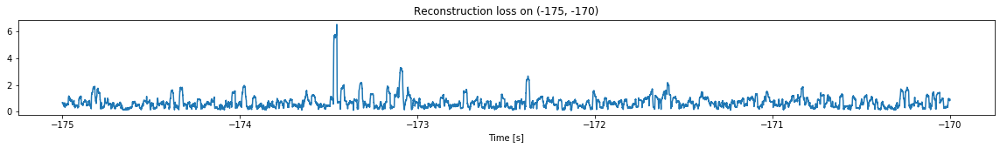

<--------
Entering sections:  (-170, -165)
-------->
Training for section:  (-175, -170)
Finished training, mean of the log(loss) is:  -0.6140227114987631
Triggering for section:  (-170, -165)
Using this mean for triggering: -0.6575105121634294


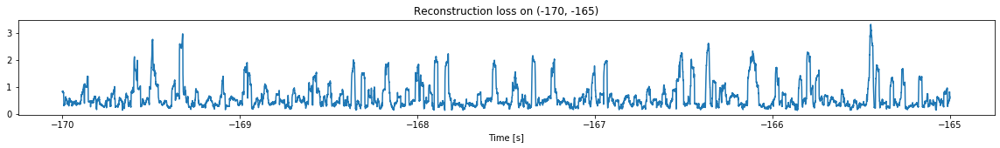

<--------
Entering sections:  (-165, -160)
-------->
Training for section:  (-170, -165)
Finished training, mean of the log(loss) is:  -0.7374051952365425
Triggering for section:  (-165, -160)
Using this mean for triggering: -0.6140227114987631


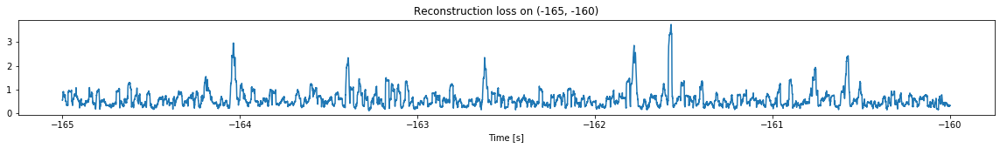

<--------
Entering sections:  (-160, -155)
-------->
Training for section:  (-165, -160)
Finished training, mean of the log(loss) is:  -0.6958724692173106
Triggering for section:  (-160, -155)
Using this mean for triggering: -0.7374051952365425


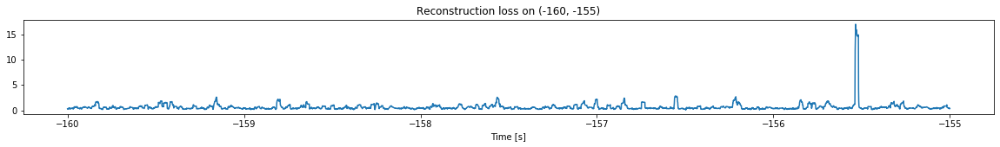

<--------
Entering sections:  (-155, -150)
-------->
Training for section:  (-160, -155)
Finished training, mean of the log(loss) is:  -0.5809392268015592
Triggering for section:  (-155, -150)
Using this mean for triggering: -0.6958724692173106


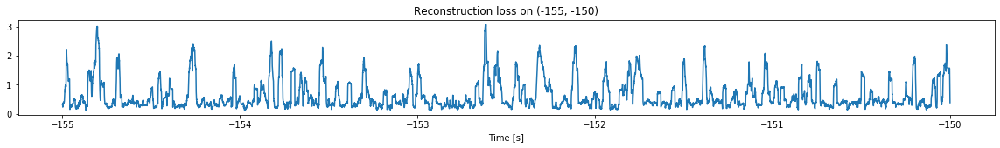

<--------
Entering sections:  (-150, -145)
-------->
Training for section:  (-155, -150)
Finished training, mean of the log(loss) is:  -0.6341786185229947
Triggering for section:  (-150, -145)
Using this mean for triggering: -0.5809392268015592


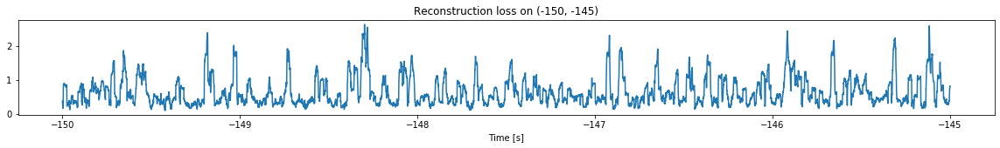

<--------
Entering sections:  (-145, -140)
-------->
Training for section:  (-150, -145)
Finished training, mean of the log(loss) is:  -0.6607292643959315
Triggering for section:  (-145, -140)
Using this mean for triggering: -0.6341786185229947


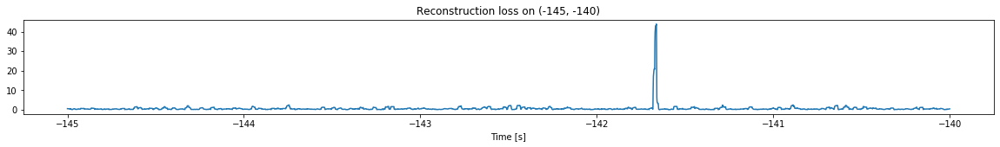

<--------
Entering sections:  (-140, -135)
-------->
Training for section:  (-145, -140)
Finished training, mean of the log(loss) is:  -0.5222756934626632
Triggering for section:  (-140, -135)
Using this mean for triggering: -0.6607292643959315


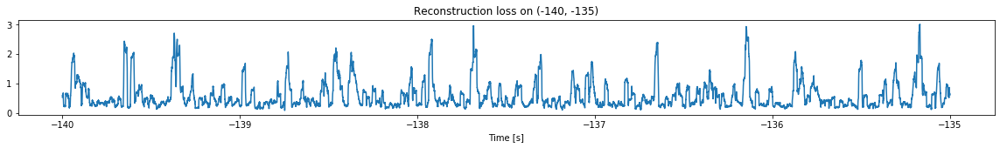

<--------
Entering sections:  (-135, -130)
-------->
Training for section:  (-140, -135)
Finished training, mean of the log(loss) is:  -0.6469833416118294
Triggering for section:  (-135, -130)
Using this mean for triggering: -0.5222756934626632


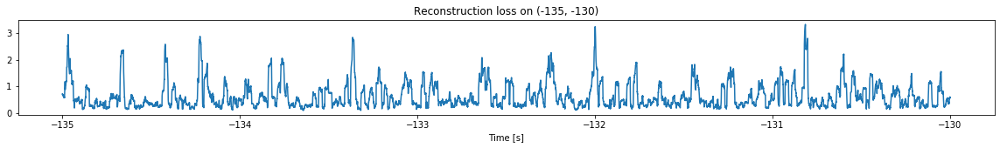

<--------
Entering sections:  (-130, -125)
-------->
Training for section:  (-135, -130)
Finished training, mean of the log(loss) is:  -0.6736719052557549
Triggering for section:  (-130, -125)
Using this mean for triggering: -0.6469833416118294


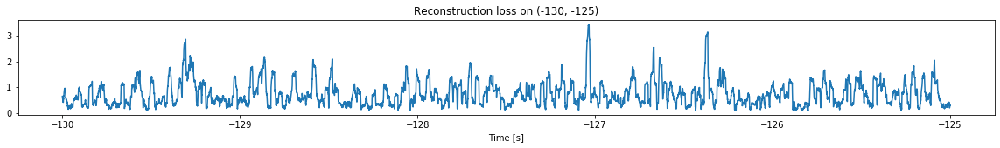

<--------
Entering sections:  (-125, -120)
-------->
Training for section:  (-130, -125)
Finished training, mean of the log(loss) is:  -0.6885984853194624
Triggering for section:  (-125, -120)
Using this mean for triggering: -0.6736719052557549


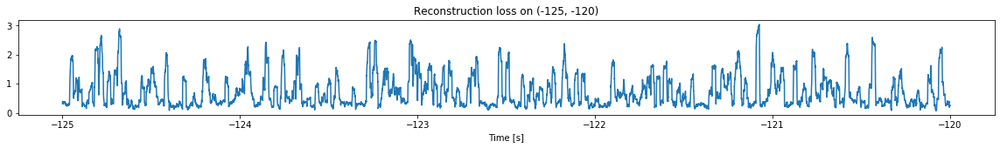

<--------
Entering sections:  (-120, -115)
-------->
Training for section:  (-125, -120)
Finished training, mean of the log(loss) is:  -0.6242302346781354
Triggering for section:  (-120, -115)
Using this mean for triggering: -0.6885984853194624


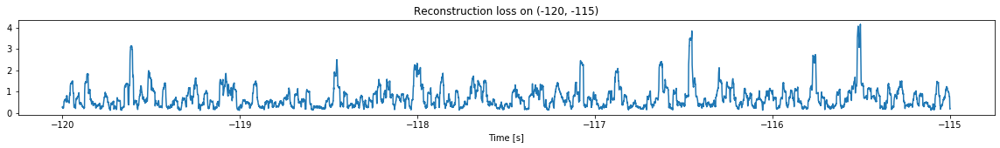

<--------
Entering sections:  (-115, -110)
-------->
Training for section:  (-120, -115)
Finished training, mean of the log(loss) is:  -0.55437207855883
Triggering for section:  (-115, -110)
Using this mean for triggering: -0.6242302346781354


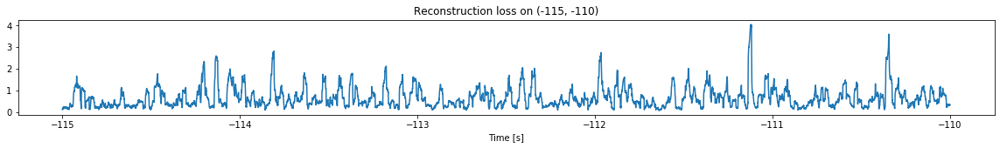

<--------
Entering sections:  (-110, -105)
-------->
Training for section:  (-115, -110)
Finished training, mean of the log(loss) is:  -0.5517157570724935
Triggering for section:  (-110, -105)
Using this mean for triggering: -0.55437207855883


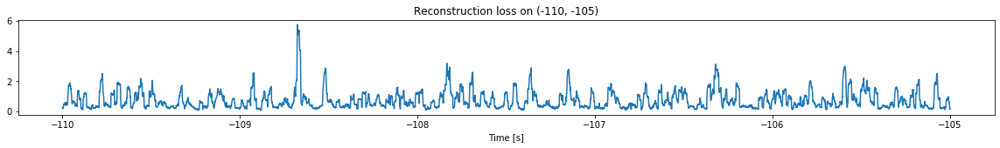

<--------
Entering sections:  (-105, -100)
-------->
Training for section:  (-110, -105)
Finished training, mean of the log(loss) is:  -0.6209809519571419
Triggering for section:  (-105, -100)
Using this mean for triggering: -0.5517157570724935


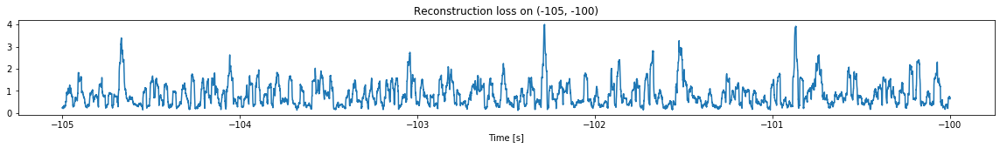

<--------
Entering sections:  (-100, -95)
-------->
Training for section:  (-105, -100)
Finished training, mean of the log(loss) is:  -0.5143960660545279
Triggering for section:  (-100, -95)
Using this mean for triggering: -0.6209809519571419


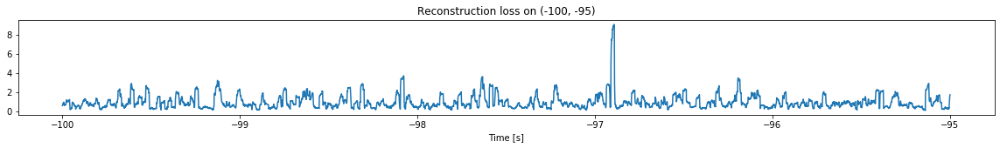

<--------
Entering sections:  (-95, -90)
-------->
Training for section:  (-100, -95)
Finished training, mean of the log(loss) is:  -0.5074882710016259
Triggering for section:  (-95, -90)
Using this mean for triggering: -0.5143960660545279


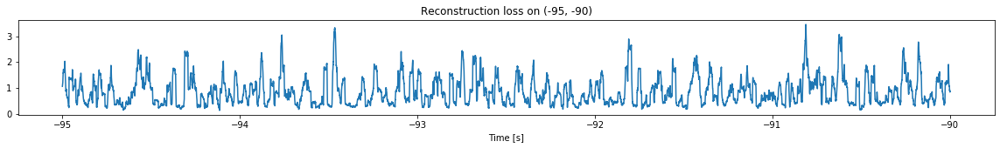

<--------
Entering sections:  (-90, -85)
-------->
Training for section:  (-95, -90)
Finished training, mean of the log(loss) is:  -0.5755778949040451
Triggering for section:  (-90, -85)
Using this mean for triggering: -0.5074882710016259


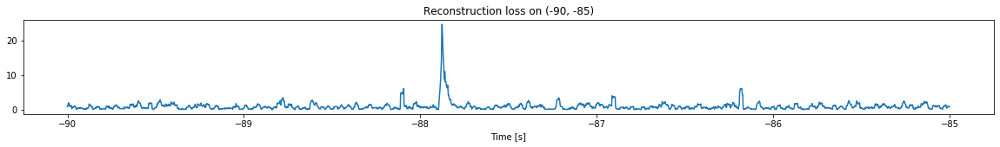

<--------
Entering sections:  (-85, -80)
-------->
Training for section:  (-90, -85)
Finished training, mean of the log(loss) is:  -0.4786422266916117
Triggering for section:  (-85, -80)
Using this mean for triggering: -0.5755778949040451


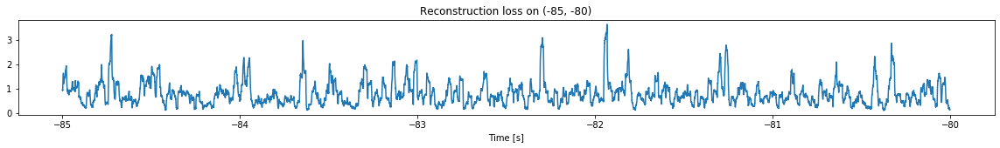

<--------
Entering sections:  (-80, -75)
-------->
Training for section:  (-85, -80)
Finished training, mean of the log(loss) is:  -0.43126124984968817
Triggering for section:  (-80, -75)
Using this mean for triggering: -0.4786422266916117


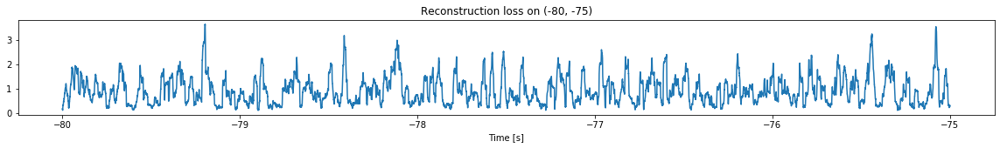

<--------
Entering sections:  (-75, -70)
-------->
Training for section:  (-80, -75)
Finished training, mean of the log(loss) is:  -0.5613040047131239
Triggering for section:  (-75, -70)
Using this mean for triggering: -0.43126124984968817


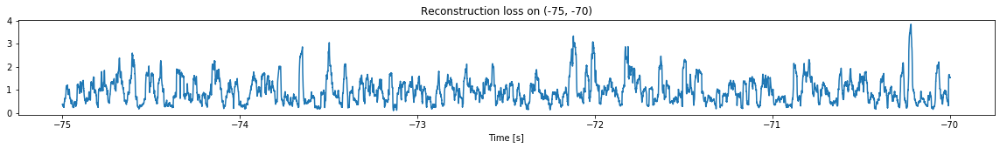

<--------
Entering sections:  (-70, -65)
-------->
Training for section:  (-75, -70)
Finished training, mean of the log(loss) is:  -0.4954880148167727
Triggering for section:  (-70, -65)
Using this mean for triggering: -0.5613040047131239


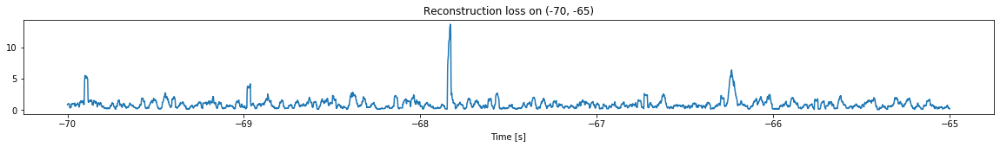

<--------
Entering sections:  (-65, -60)
-------->
Training for section:  (-70, -65)
Finished training, mean of the log(loss) is:  -0.5057876622106211
Triggering for section:  (-65, -60)
Using this mean for triggering: -0.4954880148167727


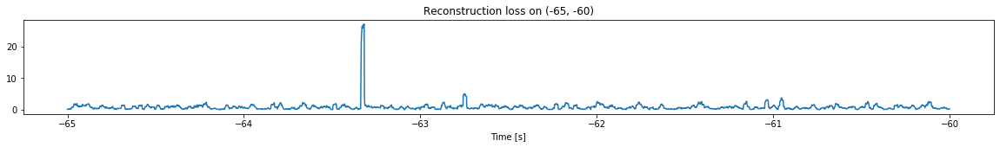

<--------
Entering sections:  (-60, -55)
-------->
Training for section:  (-65, -60)
Finished training, mean of the log(loss) is:  -0.47284659560629827
Triggering for section:  (-60, -55)
Using this mean for triggering: -0.5057876622106211


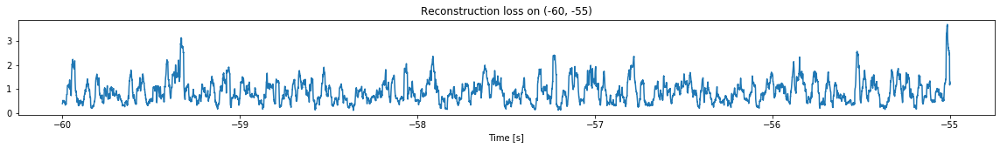

<--------
Entering sections:  (-55, -50)
-------->
Training for section:  (-60, -55)
Finished training, mean of the log(loss) is:  -0.583684542752872
Triggering for section:  (-55, -50)
Using this mean for triggering: -0.47284659560629827


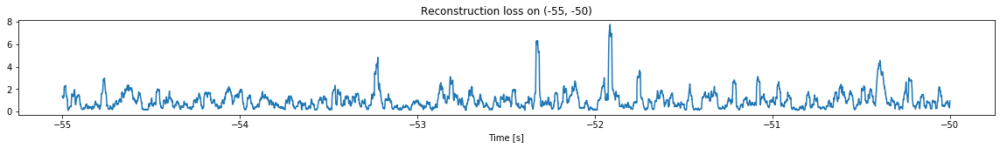

<--------
Entering sections:  (-50, -45)
-------->
Training for section:  (-55, -50)
Finished training, mean of the log(loss) is:  -0.5277121684593554
Triggering for section:  (-50, -45)
Using this mean for triggering: -0.583684542752872


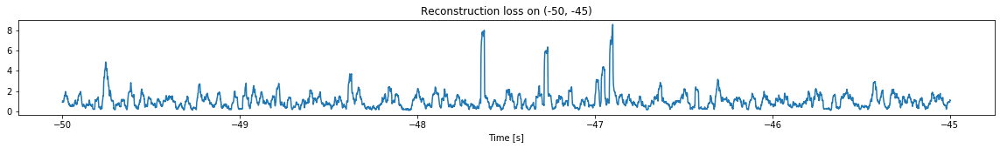

<--------
Entering sections:  (-45, -40)
-------->
Training for section:  (-50, -45)
Finished training, mean of the log(loss) is:  -0.49825968520049296
Triggering for section:  (-45, -40)
Using this mean for triggering: -0.5277121684593554


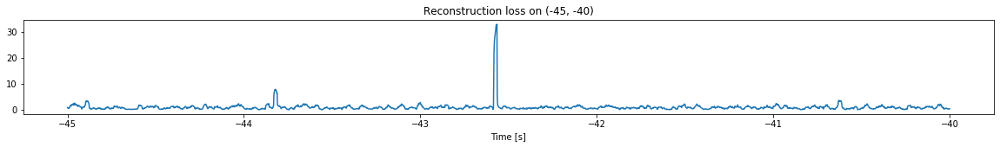

<--------
Entering sections:  (-40, -35)
-------->
Training for section:  (-45, -40)
Finished training, mean of the log(loss) is:  -0.49244428664214446
Triggering for section:  (-40, -35)
Using this mean for triggering: -0.49825968520049296


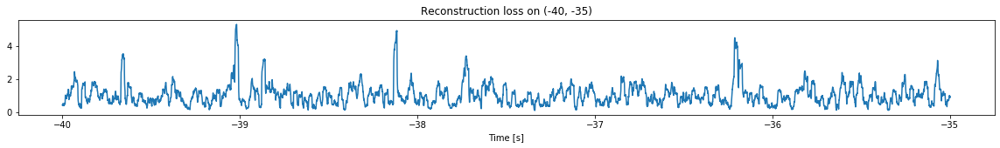

<--------
Entering sections:  (-35, -30)
-------->
Training for section:  (-40, -35)
Finished training, mean of the log(loss) is:  -0.442554751533347
Triggering for section:  (-35, -30)
Using this mean for triggering: -0.49244428664214446


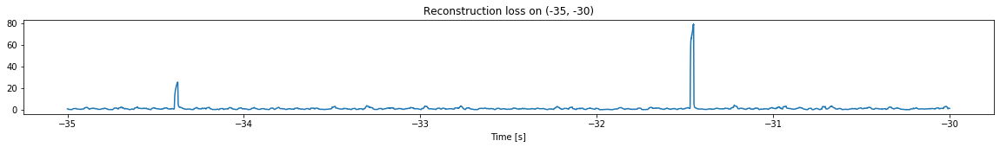

<--------
Entering sections:  (-30, -25)
-------->
Training for section:  (-35, -30)
Finished training, mean of the log(loss) is:  -0.42310102135828476
Triggering for section:  (-30, -25)
Using this mean for triggering: -0.442554751533347


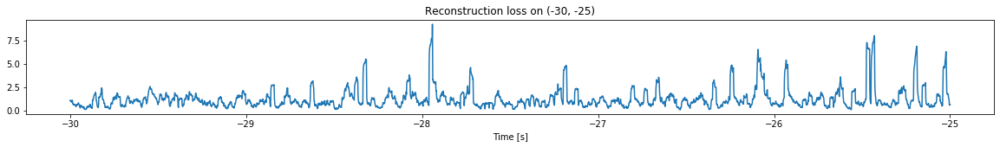

<--------
Entering sections:  (-25, -20)
-------->
Training for section:  (-30, -25)
Finished training, mean of the log(loss) is:  -0.409892573997847
Triggering for section:  (-25, -20)
Using this mean for triggering: -0.42310102135828476


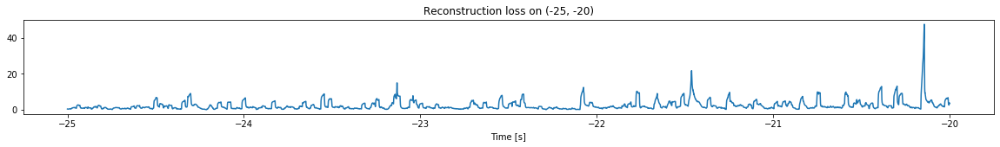

<--------
Entering sections:  (-20, -15)
-------->
Training for section:  (-25, -20)
Finished training, mean of the log(loss) is:  -0.15484959291575137
Triggering for section:  (-20, -15)
Using this mean for triggering: -0.409892573997847


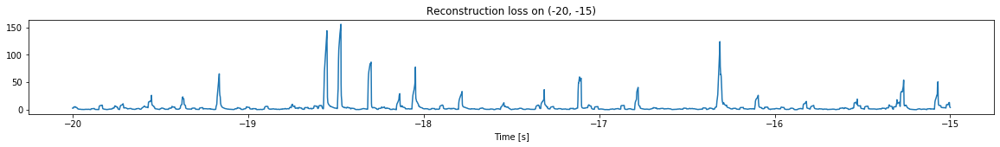

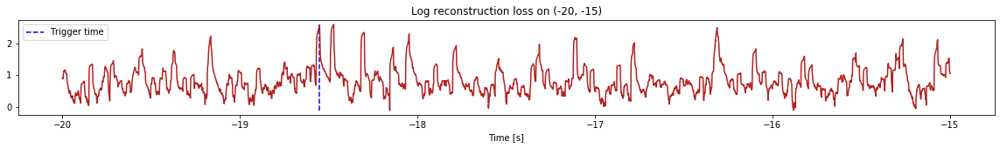

Triggered at:  -18.55489


-18.55489

In [13]:
simulation("./data/Ramp26/", 5, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.6442040594235797
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.537549163715408
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.6442040594235797


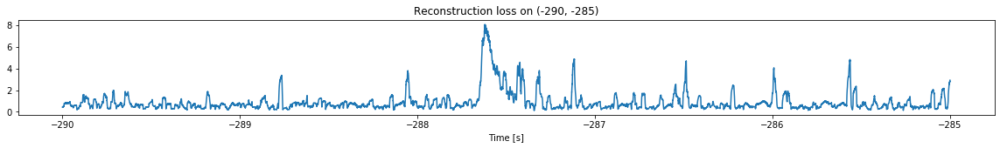

<--------
Entering sections:  (-285, -280)
-------->
Training for section:  (-290, -285)
Finished training, mean of the log(loss) is:  -0.537325928275632
Triggering for section:  (-285, -280)
Using this mean for triggering: -0.537549163715408


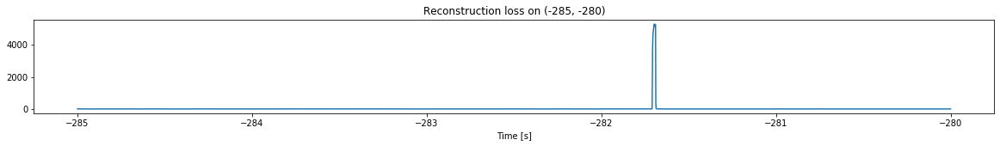

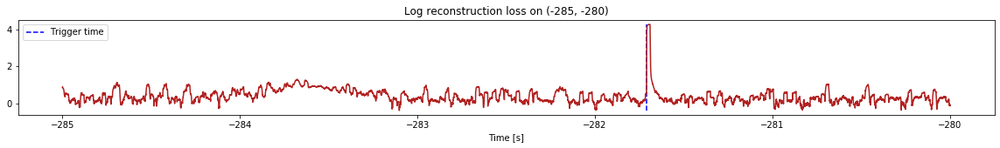

Triggered at:  -281.7092


-281.7092

In [14]:
simulation("./data/Ramp27/", 5, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.6672236070382034
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.663183988210874
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.6672236070382034


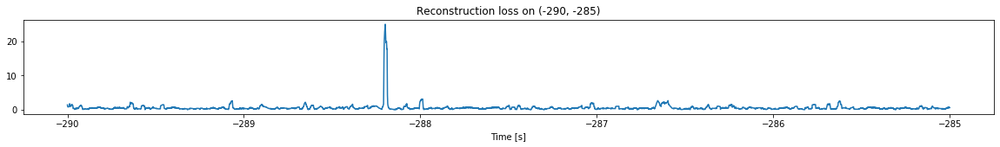

<--------
Entering sections:  (-285, -280)
-------->
Training for section:  (-290, -285)
Finished training, mean of the log(loss) is:  -0.6862163682215151
Triggering for section:  (-285, -280)
Using this mean for triggering: -0.663183988210874


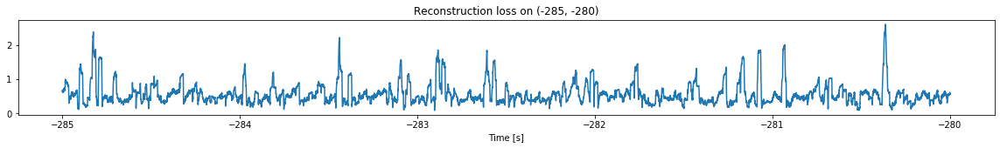

<--------
Entering sections:  (-280, -275)
-------->
Training for section:  (-285, -280)
Finished training, mean of the log(loss) is:  -0.7799967390412994
Triggering for section:  (-280, -275)
Using this mean for triggering: -0.6862163682215151


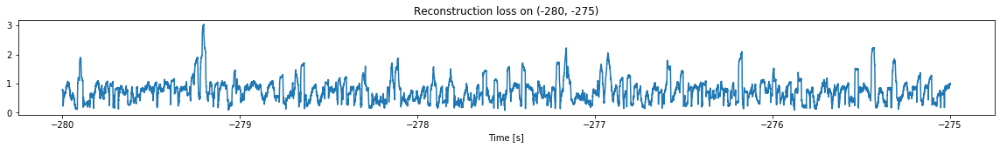

<--------
Entering sections:  (-275, -270)
-------->
Training for section:  (-280, -275)
Finished training, mean of the log(loss) is:  -0.6525829667537003
Triggering for section:  (-275, -270)
Using this mean for triggering: -0.7799967390412994


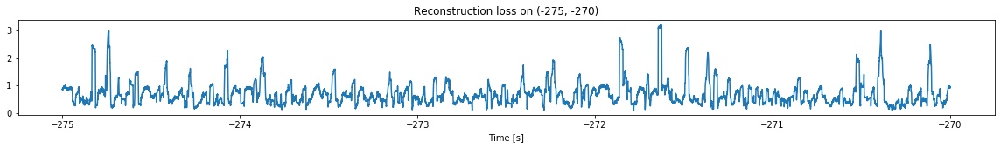

<--------
Entering sections:  (-270, -265)
-------->
Training for section:  (-275, -270)
Finished training, mean of the log(loss) is:  -0.6834551099562486
Triggering for section:  (-270, -265)
Using this mean for triggering: -0.6525829667537003


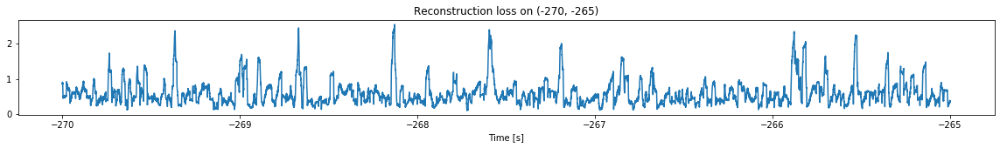

<--------
Entering sections:  (-265, -260)
-------->
Training for section:  (-270, -265)
Finished training, mean of the log(loss) is:  -0.6634385555362535
Triggering for section:  (-265, -260)
Using this mean for triggering: -0.6834551099562486


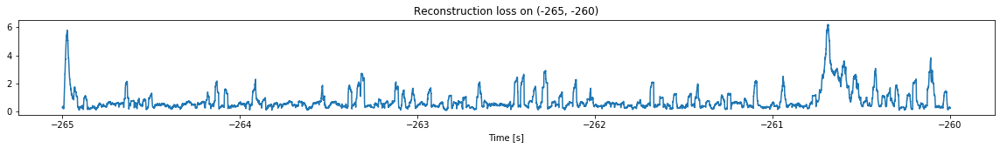

<--------
Entering sections:  (-260, -255)
-------->
Training for section:  (-265, -260)
Finished training, mean of the log(loss) is:  -0.6378914977251579
Triggering for section:  (-260, -255)
Using this mean for triggering: -0.6634385555362535


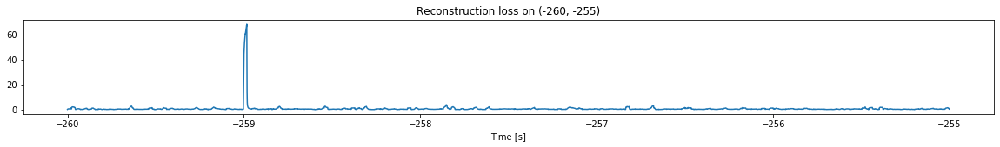

<--------
Entering sections:  (-255, -250)
-------->
Training for section:  (-260, -255)
Finished training, mean of the log(loss) is:  -0.5517293626136318
Triggering for section:  (-255, -250)
Using this mean for triggering: -0.6378914977251579


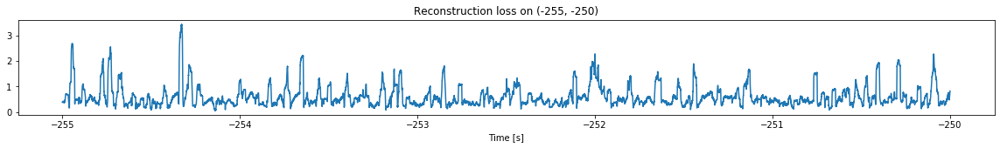

<--------
Entering sections:  (-250, -245)
-------->
Training for section:  (-255, -250)
Finished training, mean of the log(loss) is:  -0.6898606277830974
Triggering for section:  (-250, -245)
Using this mean for triggering: -0.5517293626136318


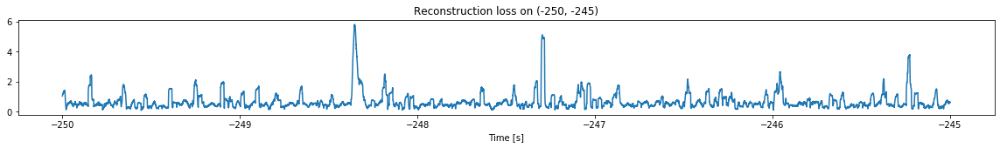

<--------
Entering sections:  (-245, -240)
-------->
Training for section:  (-250, -245)
Finished training, mean of the log(loss) is:  -0.5778046993446658
Triggering for section:  (-245, -240)
Using this mean for triggering: -0.6898606277830974


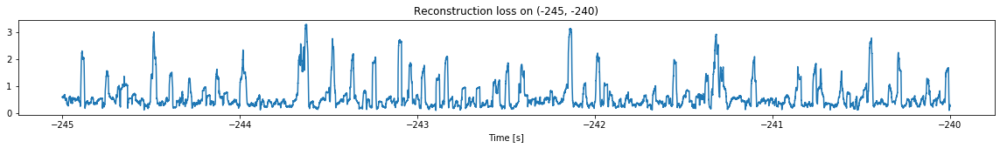

<--------
Entering sections:  (-240, -235)
-------->
Training for section:  (-245, -240)
Finished training, mean of the log(loss) is:  -0.6537680452966799
Triggering for section:  (-240, -235)
Using this mean for triggering: -0.5778046993446658


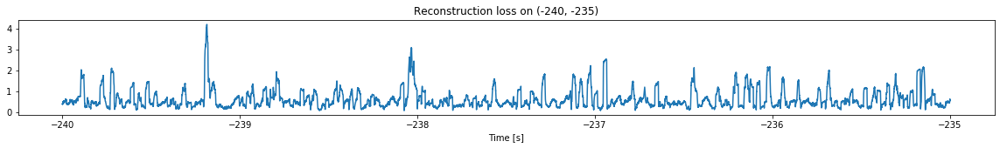

<--------
Entering sections:  (-235, -230)
-------->
Training for section:  (-240, -235)
Finished training, mean of the log(loss) is:  -0.6196515302814672
Triggering for section:  (-235, -230)
Using this mean for triggering: -0.6537680452966799


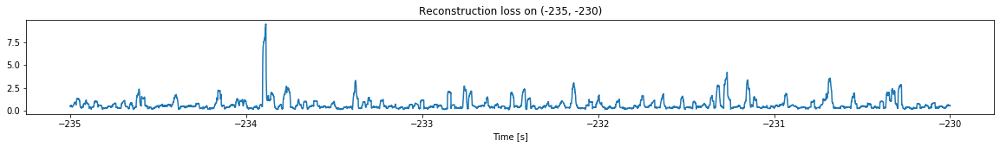

<--------
Entering sections:  (-230, -225)
-------->
Training for section:  (-235, -230)
Finished training, mean of the log(loss) is:  -0.5496528915840013
Triggering for section:  (-230, -225)
Using this mean for triggering: -0.6196515302814672


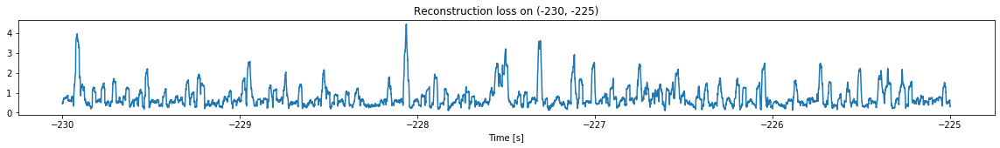

<--------
Entering sections:  (-225, -220)
-------->
Training for section:  (-230, -225)
Finished training, mean of the log(loss) is:  -0.5940336688304645
Triggering for section:  (-225, -220)
Using this mean for triggering: -0.5496528915840013


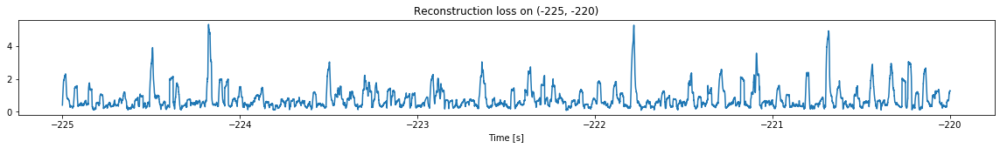

<--------
Entering sections:  (-220, -215)
-------->
Training for section:  (-225, -220)
Finished training, mean of the log(loss) is:  -0.5872984003003143
Triggering for section:  (-220, -215)
Using this mean for triggering: -0.5940336688304645


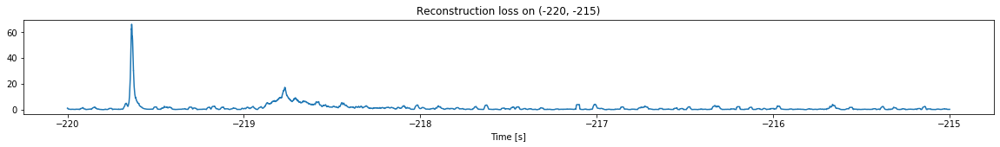

<--------
Entering sections:  (-215, -210)
-------->
Training for section:  (-220, -215)
Finished training, mean of the log(loss) is:  -0.3688418888621265
Triggering for section:  (-215, -210)
Using this mean for triggering: -0.5872984003003143


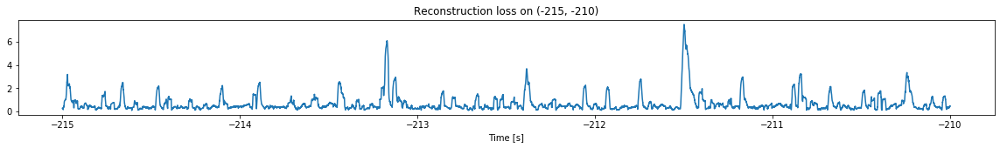

<--------
Entering sections:  (-210, -205)
-------->
Training for section:  (-215, -210)
Finished training, mean of the log(loss) is:  -0.5688844733024685
Triggering for section:  (-210, -205)
Using this mean for triggering: -0.3688418888621265


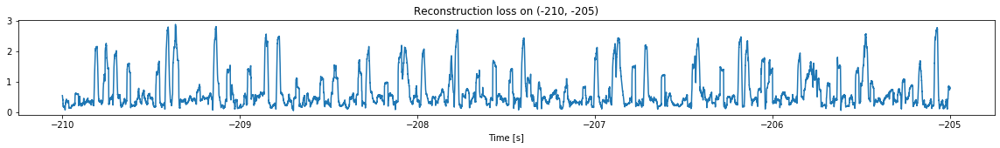

<--------
Entering sections:  (-205, -200)
-------->
Training for section:  (-210, -205)
Finished training, mean of the log(loss) is:  -0.6604279766604939
Triggering for section:  (-205, -200)
Using this mean for triggering: -0.5688844733024685


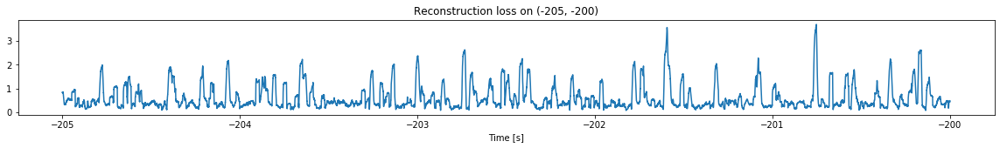

<--------
Entering sections:  (-200, -195)
-------->
Training for section:  (-205, -200)
Finished training, mean of the log(loss) is:  -0.6341533678846574
Triggering for section:  (-200, -195)
Using this mean for triggering: -0.6604279766604939


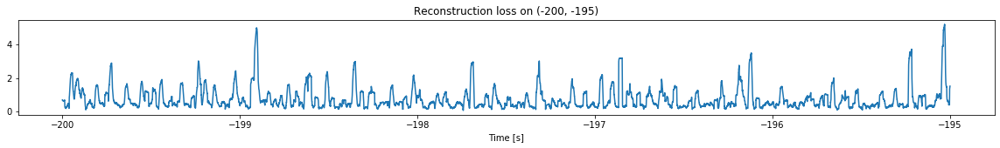

<--------
Entering sections:  (-195, -190)
-------->
Training for section:  (-200, -195)
Finished training, mean of the log(loss) is:  -0.5581620442070365
Triggering for section:  (-195, -190)
Using this mean for triggering: -0.6341533678846574


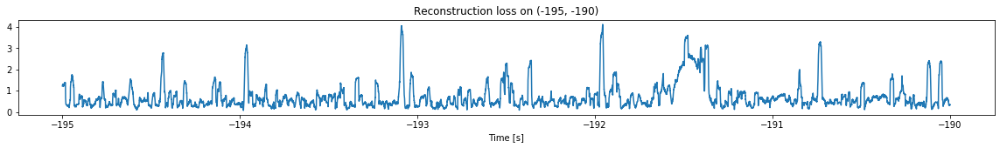

<--------
Entering sections:  (-190, -185)
-------->
Training for section:  (-195, -190)
Finished training, mean of the log(loss) is:  -0.646278824990412
Triggering for section:  (-190, -185)
Using this mean for triggering: -0.5581620442070365


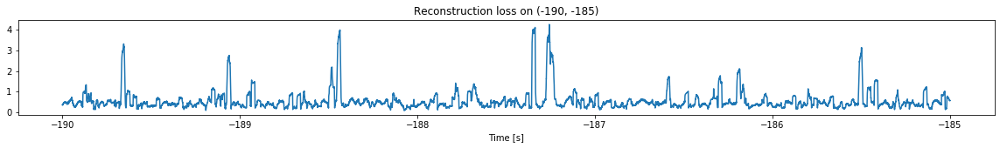

<--------
Entering sections:  (-185, -180)
-------->
Training for section:  (-190, -185)
Finished training, mean of the log(loss) is:  -0.7565046967100787
Triggering for section:  (-185, -180)
Using this mean for triggering: -0.646278824990412


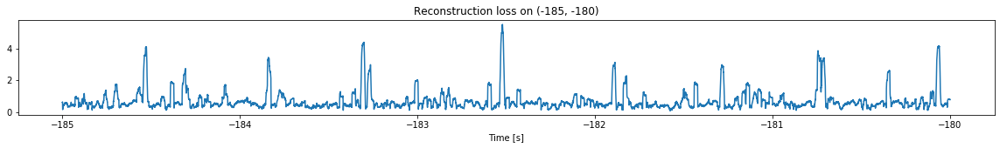

<--------
Entering sections:  (-180, -175)
-------->
Training for section:  (-185, -180)
Finished training, mean of the log(loss) is:  -0.6828381367455891
Triggering for section:  (-180, -175)
Using this mean for triggering: -0.7565046967100787


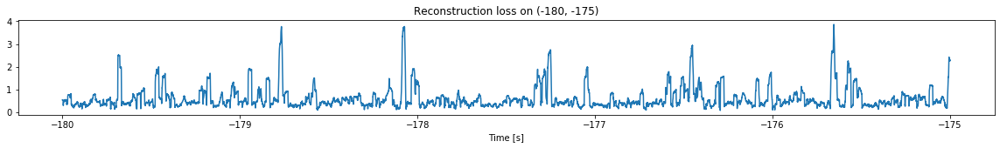

<--------
Entering sections:  (-175, -170)
-------->
Training for section:  (-180, -175)
Finished training, mean of the log(loss) is:  -0.7116024740341305
Triggering for section:  (-175, -170)
Using this mean for triggering: -0.6828381367455891


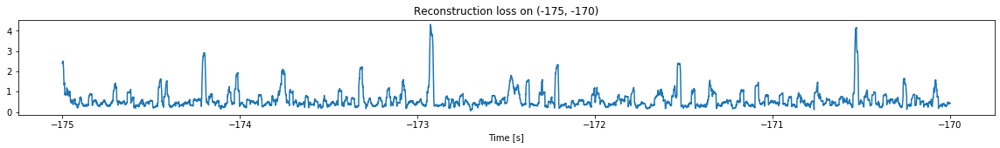

<--------
Entering sections:  (-170, -165)
-------->
Training for section:  (-175, -170)
Finished training, mean of the log(loss) is:  -0.7141805015585602
Triggering for section:  (-170, -165)
Using this mean for triggering: -0.7116024740341305


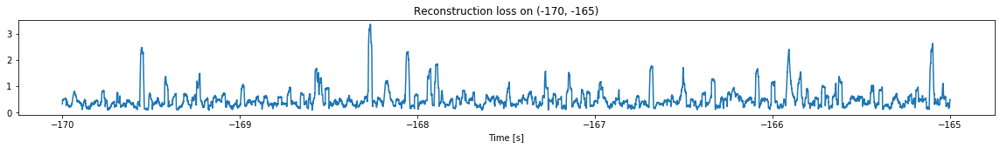

<--------
Entering sections:  (-165, -160)
-------->
Training for section:  (-170, -165)
Finished training, mean of the log(loss) is:  -0.6498563145052579
Triggering for section:  (-165, -160)
Using this mean for triggering: -0.7141805015585602


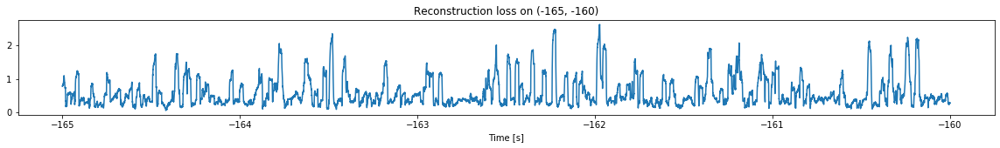

<--------
Entering sections:  (-160, -155)
-------->
Training for section:  (-165, -160)
Finished training, mean of the log(loss) is:  -0.748180817113913
Triggering for section:  (-160, -155)
Using this mean for triggering: -0.6498563145052579


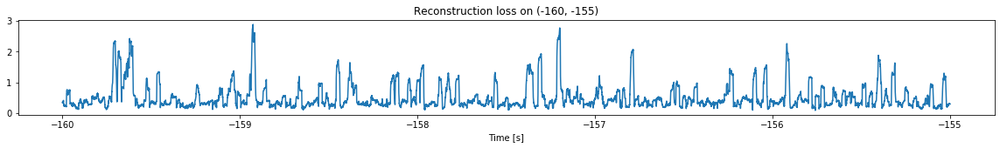

<--------
Entering sections:  (-155, -150)
-------->
Training for section:  (-160, -155)
Finished training, mean of the log(loss) is:  -0.6660957559034562
Triggering for section:  (-155, -150)
Using this mean for triggering: -0.748180817113913


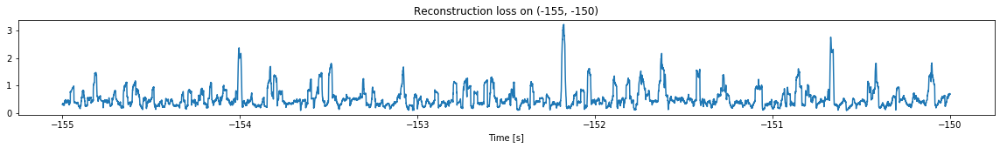

<--------
Entering sections:  (-150, -145)
-------->
Training for section:  (-155, -150)
Finished training, mean of the log(loss) is:  -0.6878967902170648
Triggering for section:  (-150, -145)
Using this mean for triggering: -0.6660957559034562


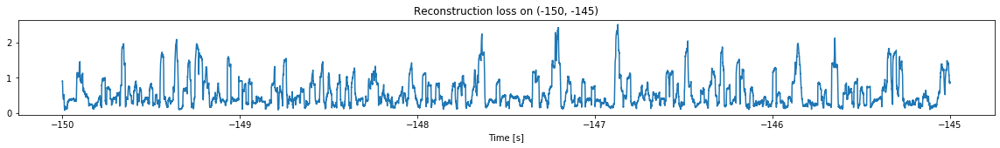

<--------
Entering sections:  (-145, -140)
-------->
Training for section:  (-150, -145)
Finished training, mean of the log(loss) is:  -0.6223775645945806
Triggering for section:  (-145, -140)
Using this mean for triggering: -0.6878967902170648


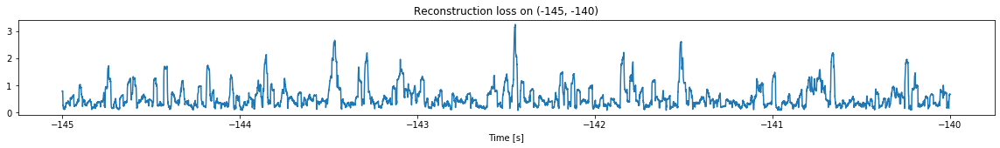

<--------
Entering sections:  (-140, -135)
-------->
Training for section:  (-145, -140)
Finished training, mean of the log(loss) is:  -0.6795663605202756
Triggering for section:  (-140, -135)
Using this mean for triggering: -0.6223775645945806


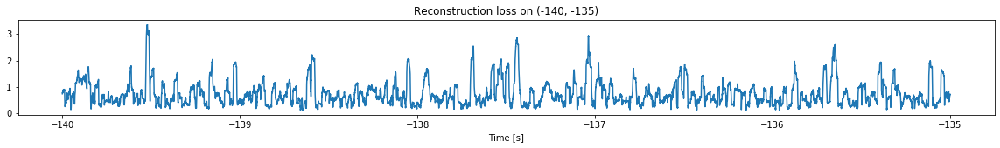

<--------
Entering sections:  (-135, -130)
-------->
Training for section:  (-140, -135)
Finished training, mean of the log(loss) is:  -0.6386298117214133
Triggering for section:  (-135, -130)
Using this mean for triggering: -0.6795663605202756


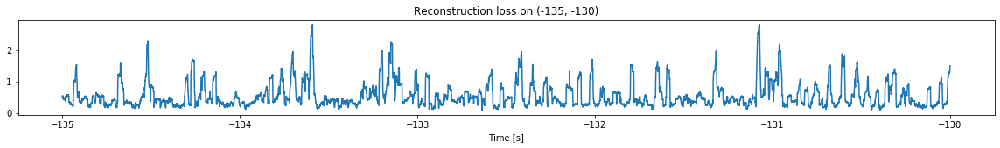

<--------
Entering sections:  (-130, -125)
-------->
Training for section:  (-135, -130)
Finished training, mean of the log(loss) is:  -0.7486216764391238
Triggering for section:  (-130, -125)
Using this mean for triggering: -0.6386298117214133


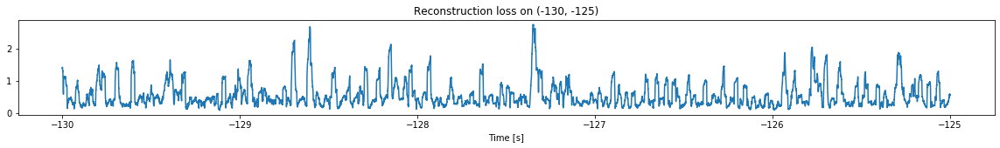

<--------
Entering sections:  (-125, -120)
-------->
Training for section:  (-130, -125)
Finished training, mean of the log(loss) is:  -0.6863003361943925
Triggering for section:  (-125, -120)
Using this mean for triggering: -0.7486216764391238


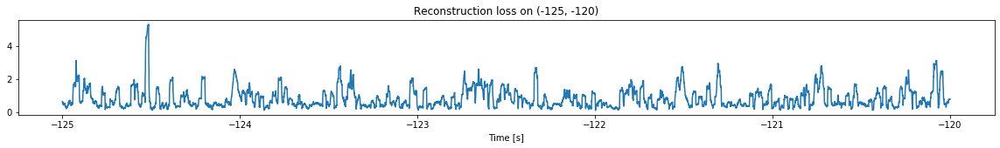

<--------
Entering sections:  (-120, -115)
-------->
Training for section:  (-125, -120)
Finished training, mean of the log(loss) is:  -0.6569682330226378
Triggering for section:  (-120, -115)
Using this mean for triggering: -0.6863003361943925


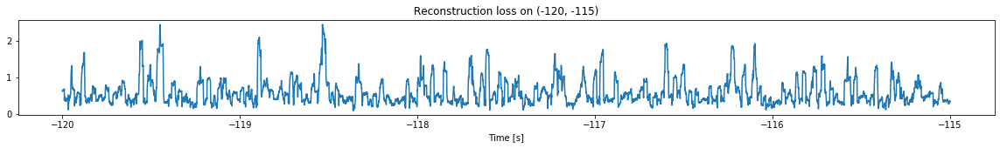

<--------
Entering sections:  (-115, -110)
-------->
Training for section:  (-120, -115)
Finished training, mean of the log(loss) is:  -0.6534570198674657
Triggering for section:  (-115, -110)
Using this mean for triggering: -0.6569682330226378


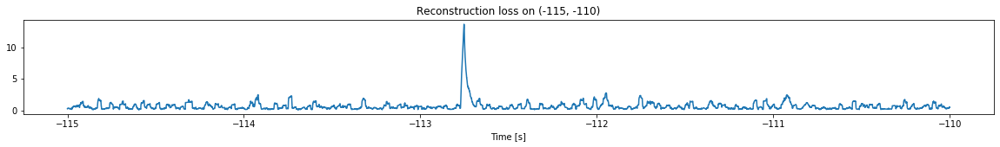

<--------
Entering sections:  (-110, -105)
-------->
Training for section:  (-115, -110)
Finished training, mean of the log(loss) is:  -0.579717056793084
Triggering for section:  (-110, -105)
Using this mean for triggering: -0.6534570198674657


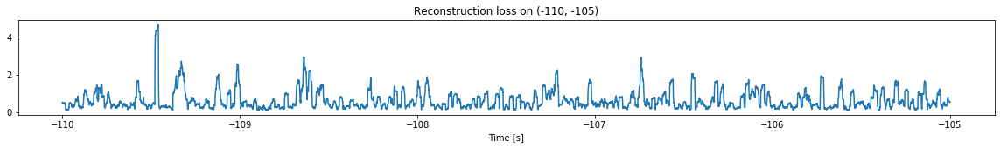

<--------
Entering sections:  (-105, -100)
-------->
Training for section:  (-110, -105)
Finished training, mean of the log(loss) is:  -0.6217241963045973
Triggering for section:  (-105, -100)
Using this mean for triggering: -0.579717056793084


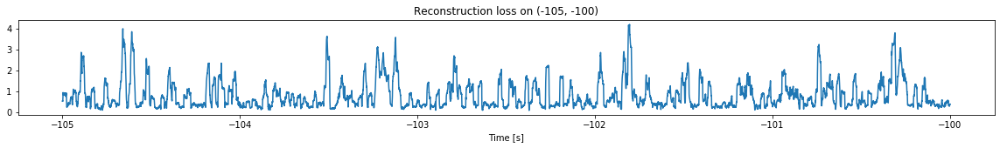

<--------
Entering sections:  (-100, -95)
-------->
Training for section:  (-105, -100)
Finished training, mean of the log(loss) is:  -0.6069396451102257
Triggering for section:  (-100, -95)
Using this mean for triggering: -0.6217241963045973


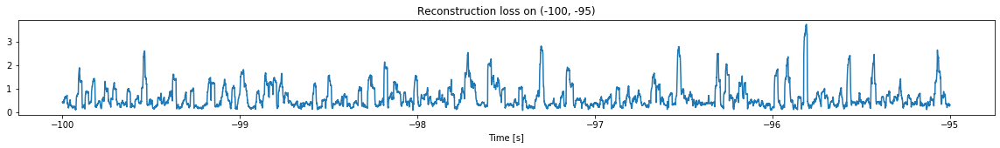

<--------
Entering sections:  (-95, -90)
-------->
Training for section:  (-100, -95)
Finished training, mean of the log(loss) is:  -0.5660465546868738
Triggering for section:  (-95, -90)
Using this mean for triggering: -0.6069396451102257


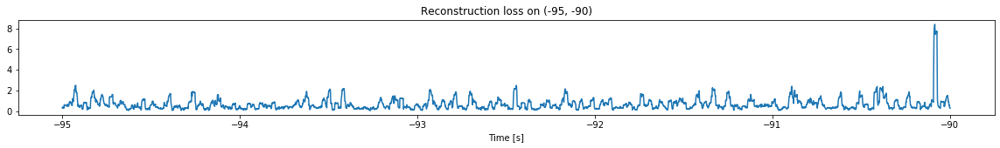

<--------
Entering sections:  (-90, -85)
-------->
Training for section:  (-95, -90)
Finished training, mean of the log(loss) is:  -0.612352229438973
Triggering for section:  (-90, -85)
Using this mean for triggering: -0.5660465546868738


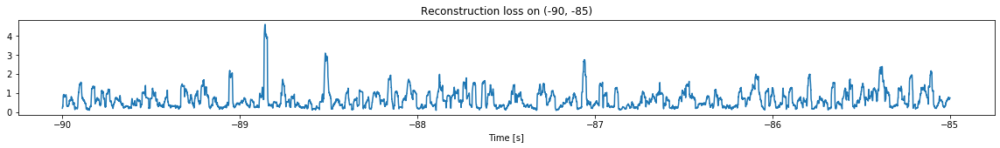

<--------
Entering sections:  (-85, -80)
-------->
Training for section:  (-90, -85)
Finished training, mean of the log(loss) is:  -0.5554956909608376
Triggering for section:  (-85, -80)
Using this mean for triggering: -0.612352229438973


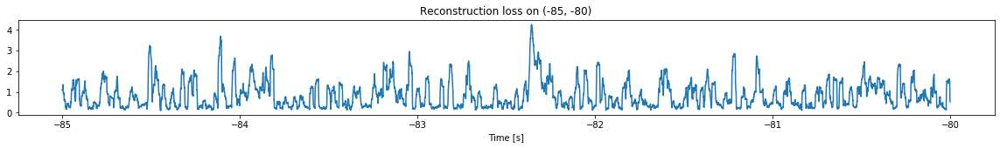

<--------
Entering sections:  (-80, -75)
-------->
Training for section:  (-85, -80)
Finished training, mean of the log(loss) is:  -0.5592662455770764
Triggering for section:  (-80, -75)
Using this mean for triggering: -0.5554956909608376


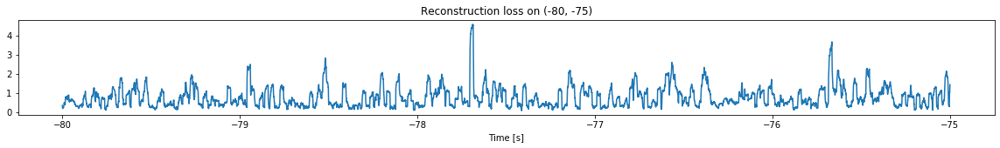

<--------
Entering sections:  (-75, -70)
-------->
Training for section:  (-80, -75)
Finished training, mean of the log(loss) is:  -0.6884190306566069
Triggering for section:  (-75, -70)
Using this mean for triggering: -0.5592662455770764


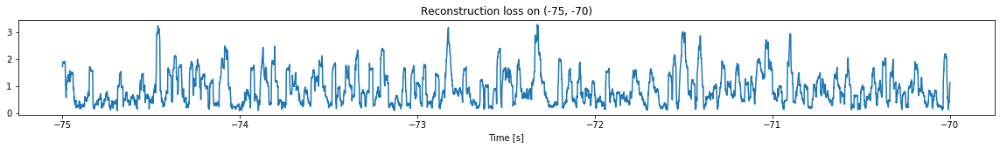

<--------
Entering sections:  (-70, -65)
-------->
Training for section:  (-75, -70)
Finished training, mean of the log(loss) is:  -0.5490814036976793
Triggering for section:  (-70, -65)
Using this mean for triggering: -0.6884190306566069


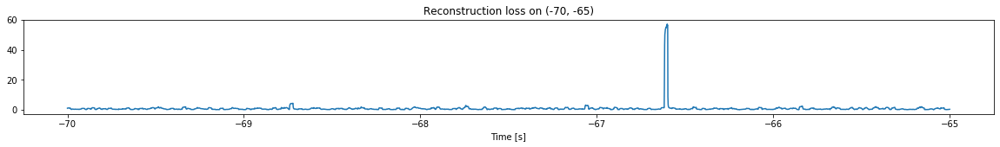

<--------
Entering sections:  (-65, -60)
-------->
Training for section:  (-70, -65)
Finished training, mean of the log(loss) is:  -0.5203078260064863
Triggering for section:  (-65, -60)
Using this mean for triggering: -0.5490814036976793


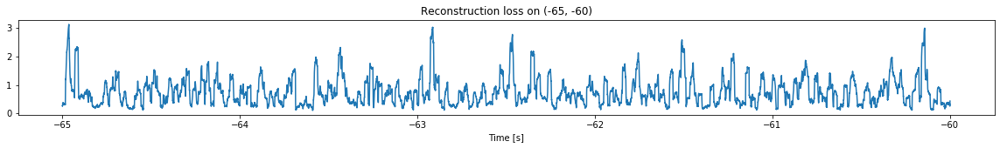

<--------
Entering sections:  (-60, -55)
-------->
Training for section:  (-65, -60)
Finished training, mean of the log(loss) is:  -0.5944533416419766
Triggering for section:  (-60, -55)
Using this mean for triggering: -0.5203078260064863


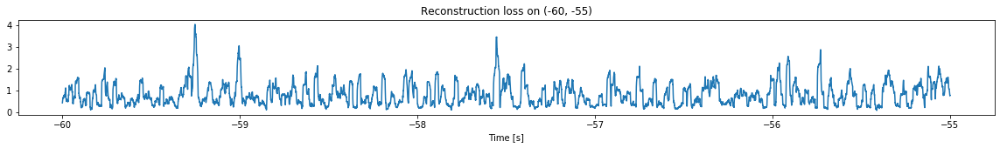

<--------
Entering sections:  (-55, -50)
-------->
Training for section:  (-60, -55)
Finished training, mean of the log(loss) is:  -0.5954843592812766
Triggering for section:  (-55, -50)
Using this mean for triggering: -0.5944533416419766


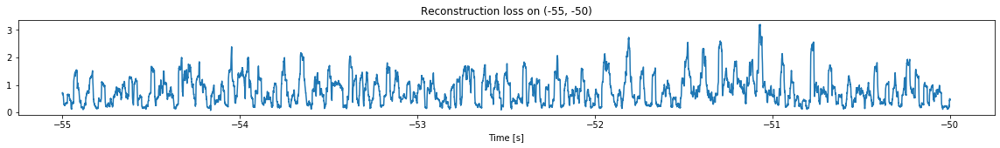

<--------
Entering sections:  (-50, -45)
-------->
Training for section:  (-55, -50)
Finished training, mean of the log(loss) is:  -0.5758063701895907
Triggering for section:  (-50, -45)
Using this mean for triggering: -0.5954843592812766


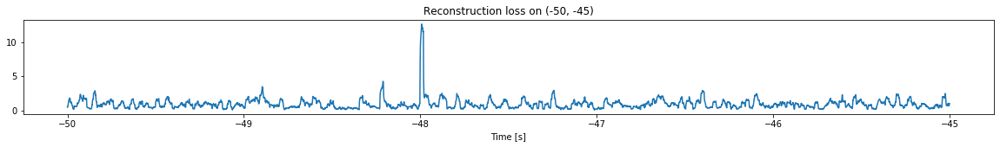

<--------
Entering sections:  (-45, -40)
-------->
Training for section:  (-50, -45)
Finished training, mean of the log(loss) is:  -0.5364356396102813
Triggering for section:  (-45, -40)
Using this mean for triggering: -0.5758063701895907


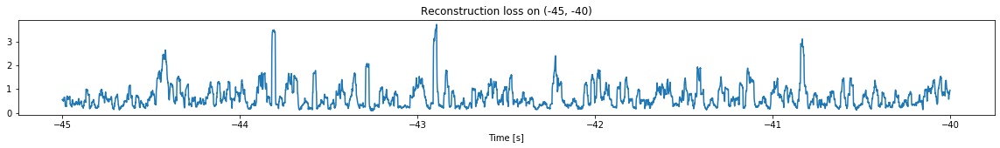

<--------
Entering sections:  (-40, -35)
-------->
Training for section:  (-45, -40)
Finished training, mean of the log(loss) is:  -0.5555985185333685
Triggering for section:  (-40, -35)
Using this mean for triggering: -0.5364356396102813


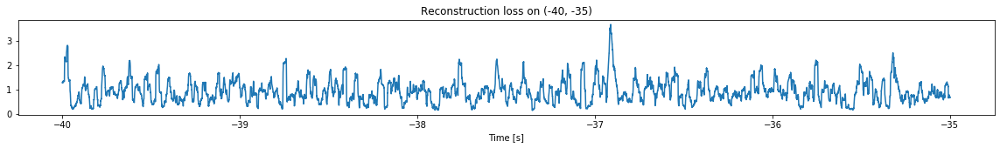

<--------
Entering sections:  (-35, -30)
-------->
Training for section:  (-40, -35)
Finished training, mean of the log(loss) is:  -0.5985584216489199
Triggering for section:  (-35, -30)
Using this mean for triggering: -0.5555985185333685


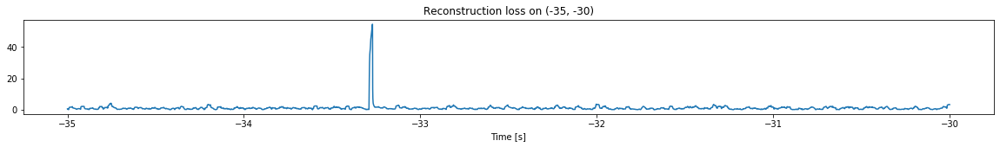

<--------
Entering sections:  (-30, -25)
-------->
Training for section:  (-35, -30)
Finished training, mean of the log(loss) is:  -0.4430115104367254
Triggering for section:  (-30, -25)
Using this mean for triggering: -0.5985584216489199


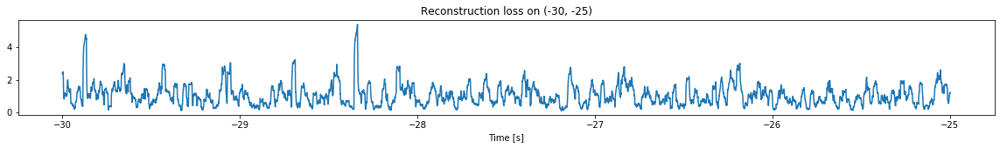

<--------
Entering sections:  (-25, -20)
-------->
Training for section:  (-30, -25)
Finished training, mean of the log(loss) is:  -0.5405304728502596
Triggering for section:  (-25, -20)
Using this mean for triggering: -0.4430115104367254


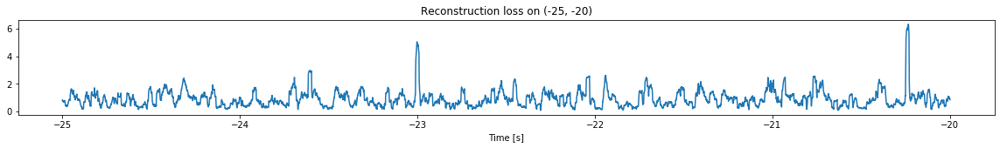

<--------
Entering sections:  (-20, -15)
-------->
Training for section:  (-25, -20)
Finished training, mean of the log(loss) is:  -0.5744709515920748
Triggering for section:  (-20, -15)
Using this mean for triggering: -0.5405304728502596


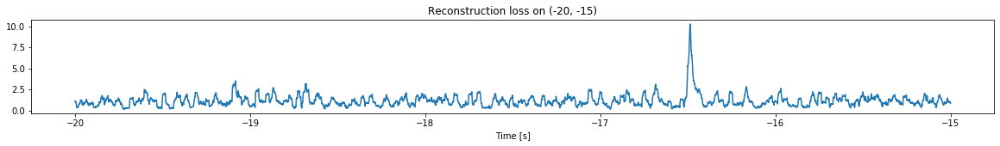

<--------
Entering sections:  (-15, -10)
-------->
Training for section:  (-20, -15)
Finished training, mean of the log(loss) is:  -0.54472007838702
Triggering for section:  (-15, -10)
Using this mean for triggering: -0.5744709515920748


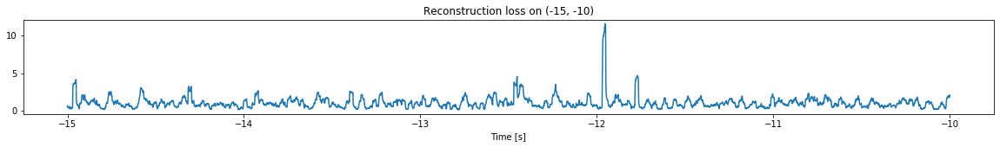

<--------
Entering sections:  (-10, -5)
-------->
Training for section:  (-15, -10)
Finished training, mean of the log(loss) is:  -0.5857936834722326
Triggering for section:  (-10, -5)
Using this mean for triggering: -0.54472007838702


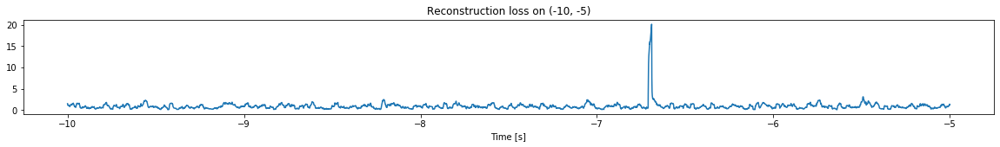

<--------
Entering sections:  (-5, 0)
-------->
Training for section:  (-10, -5)
Finished training, mean of the log(loss) is:  -0.49105016586675376
Triggering for section:  (-5, 0)
Using this mean for triggering: -0.5857936834722326


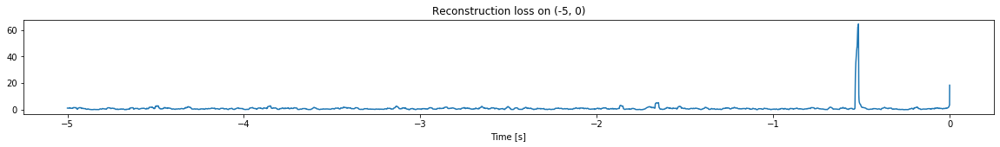

<--------


In [15]:
simulation("./data/Ramp28/", 5, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.6618647651842454
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.6024992351043257
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.6618647651842454


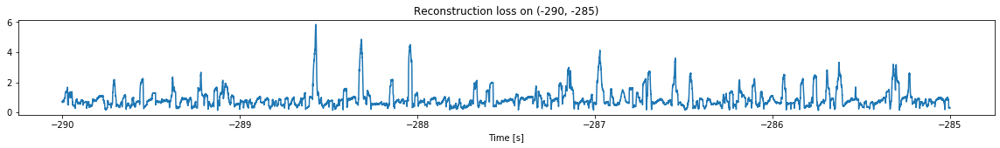

<--------
Entering sections:  (-285, -280)
-------->
Training for section:  (-290, -285)
Finished training, mean of the log(loss) is:  -0.5510744423897852
Triggering for section:  (-285, -280)
Using this mean for triggering: -0.6024992351043257


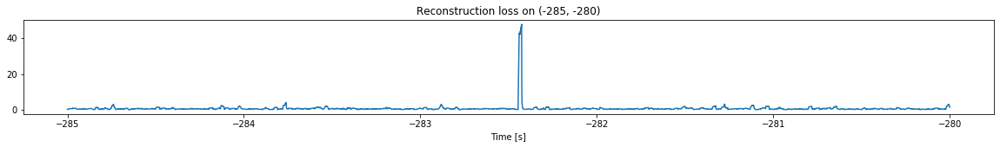

<--------
Entering sections:  (-280, -275)
-------->
Training for section:  (-285, -280)
Finished training, mean of the log(loss) is:  -0.6006733211408052
Triggering for section:  (-280, -275)
Using this mean for triggering: -0.5510744423897852


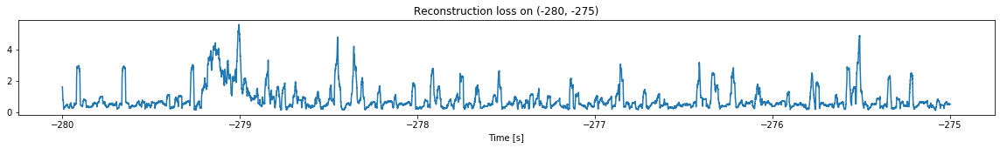

<--------
Entering sections:  (-275, -270)
-------->
Training for section:  (-280, -275)
Finished training, mean of the log(loss) is:  -0.5841345881207908
Triggering for section:  (-275, -270)
Using this mean for triggering: -0.6006733211408052


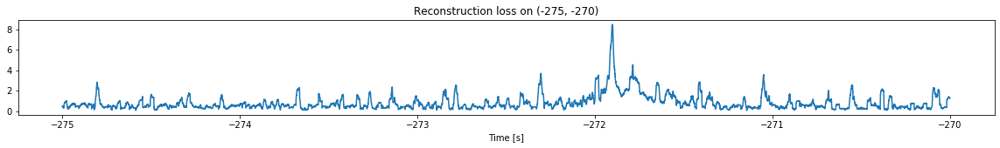

<--------
Entering sections:  (-270, -265)
-------->
Training for section:  (-275, -270)
Finished training, mean of the log(loss) is:  -0.5280617834568546
Triggering for section:  (-270, -265)
Using this mean for triggering: -0.5841345881207908


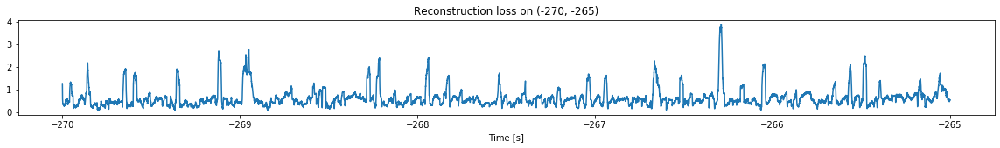

<--------
Entering sections:  (-265, -260)
-------->
Training for section:  (-270, -265)
Finished training, mean of the log(loss) is:  -0.6955541567888338
Triggering for section:  (-265, -260)
Using this mean for triggering: -0.5280617834568546


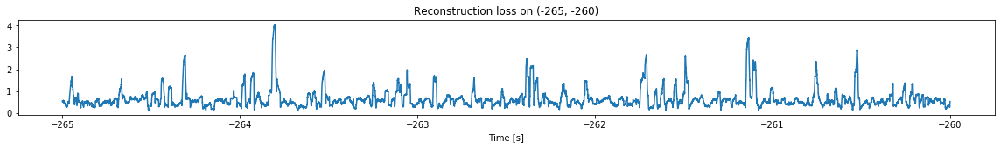

<--------
Entering sections:  (-260, -255)
-------->
Training for section:  (-265, -260)
Finished training, mean of the log(loss) is:  -0.6964635241986373
Triggering for section:  (-260, -255)
Using this mean for triggering: -0.6955541567888338


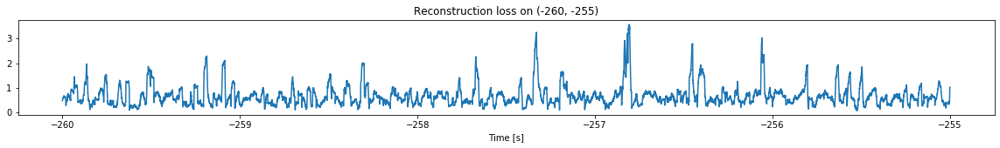

<--------
Entering sections:  (-255, -250)
-------->
Training for section:  (-260, -255)
Finished training, mean of the log(loss) is:  -0.6328486749392185
Triggering for section:  (-255, -250)
Using this mean for triggering: -0.6964635241986373


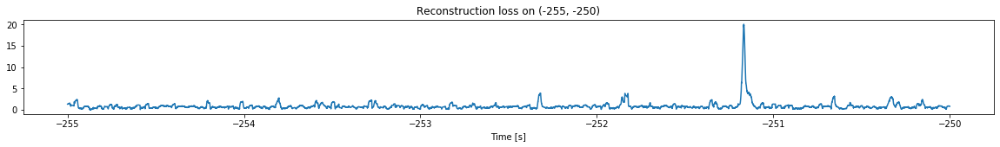

<--------
Entering sections:  (-250, -245)
-------->
Training for section:  (-255, -250)
Finished training, mean of the log(loss) is:  -0.5484546137846845
Triggering for section:  (-250, -245)
Using this mean for triggering: -0.6328486749392185


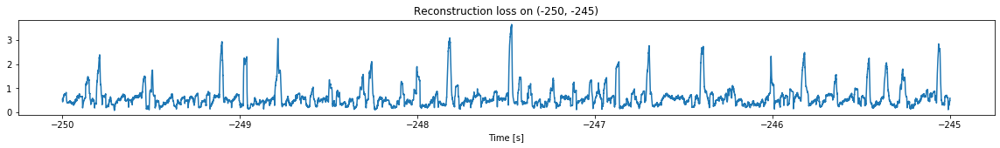

<--------
Entering sections:  (-245, -240)
-------->
Training for section:  (-250, -245)
Finished training, mean of the log(loss) is:  -0.7029206227048664
Triggering for section:  (-245, -240)
Using this mean for triggering: -0.5484546137846845


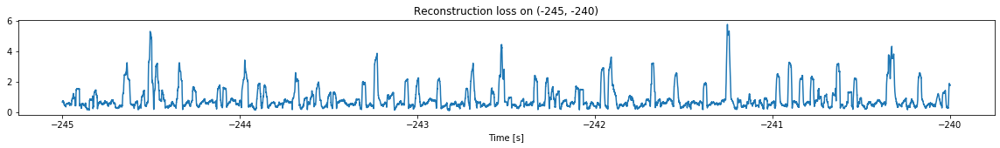

<--------
Entering sections:  (-240, -235)
-------->
Training for section:  (-245, -240)
Finished training, mean of the log(loss) is:  -0.6155435096318063
Triggering for section:  (-240, -235)
Using this mean for triggering: -0.7029206227048664


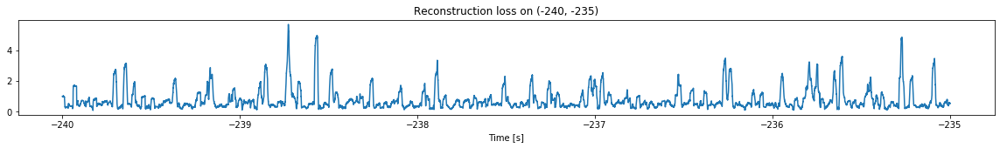

<--------
Entering sections:  (-235, -230)
-------->
Training for section:  (-240, -235)
Finished training, mean of the log(loss) is:  -0.5244494236042079
Triggering for section:  (-235, -230)
Using this mean for triggering: -0.6155435096318063


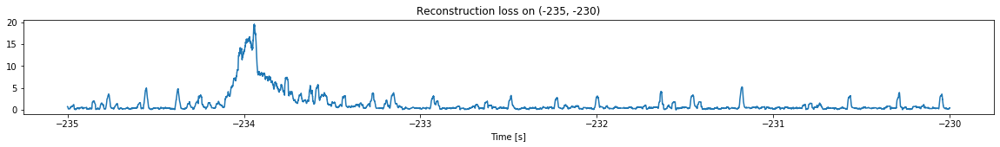

<--------
Entering sections:  (-230, -225)
-------->
Training for section:  (-235, -230)
Finished training, mean of the log(loss) is:  -0.49457969411574043
Triggering for section:  (-230, -225)
Using this mean for triggering: -0.5244494236042079


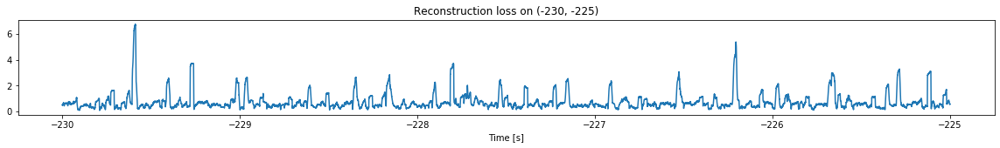

<--------
Entering sections:  (-225, -220)
-------->
Training for section:  (-230, -225)
Finished training, mean of the log(loss) is:  -0.6419670567137743
Triggering for section:  (-225, -220)
Using this mean for triggering: -0.49457969411574043


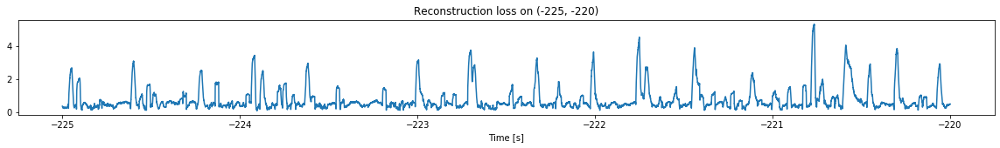

<--------
Entering sections:  (-220, -215)
-------->
Training for section:  (-225, -220)
Finished training, mean of the log(loss) is:  -0.6023631776196507
Triggering for section:  (-220, -215)
Using this mean for triggering: -0.6419670567137743


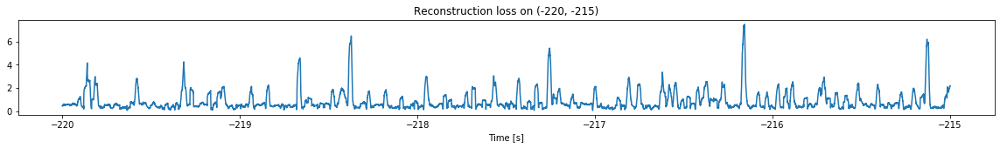

<--------
Entering sections:  (-215, -210)
-------->
Training for section:  (-220, -215)
Finished training, mean of the log(loss) is:  -0.542464216191101
Triggering for section:  (-215, -210)
Using this mean for triggering: -0.6023631776196507


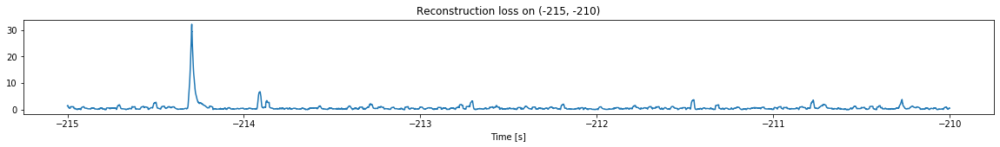

<--------
Entering sections:  (-210, -205)
-------->
Training for section:  (-215, -210)
Finished training, mean of the log(loss) is:  -0.6117367082357681
Triggering for section:  (-210, -205)
Using this mean for triggering: -0.542464216191101


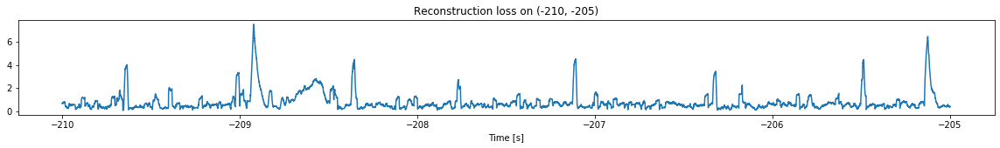

<--------
Entering sections:  (-205, -200)
-------->
Training for section:  (-210, -205)
Finished training, mean of the log(loss) is:  -0.5761801354891793
Triggering for section:  (-205, -200)
Using this mean for triggering: -0.6117367082357681


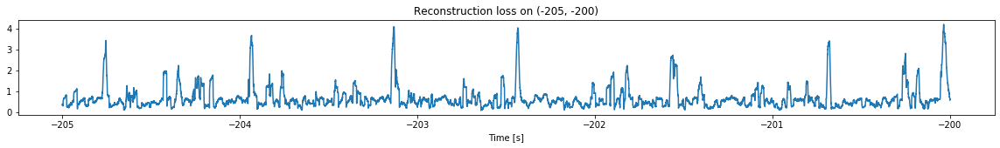

<--------
Entering sections:  (-200, -195)
-------->
Training for section:  (-205, -200)
Finished training, mean of the log(loss) is:  -0.7743120182218703
Triggering for section:  (-200, -195)
Using this mean for triggering: -0.5761801354891793


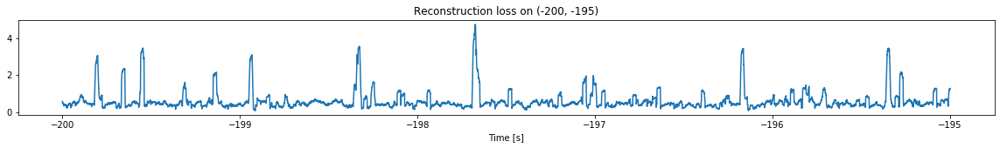

<--------
Entering sections:  (-195, -190)
-------->
Training for section:  (-200, -195)
Finished training, mean of the log(loss) is:  -0.736542533615788
Triggering for section:  (-195, -190)
Using this mean for triggering: -0.7743120182218703


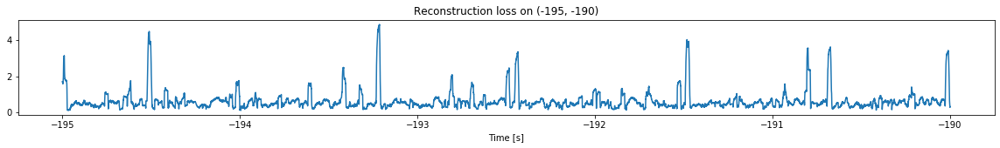

<--------
Entering sections:  (-190, -185)
-------->
Training for section:  (-195, -190)
Finished training, mean of the log(loss) is:  -0.7809146682894662
Triggering for section:  (-190, -185)
Using this mean for triggering: -0.736542533615788


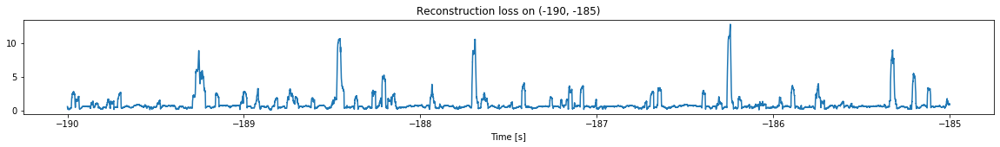

<--------
Entering sections:  (-185, -180)
-------->
Training for section:  (-190, -185)
Finished training, mean of the log(loss) is:  -0.7717317115567488
Triggering for section:  (-185, -180)
Using this mean for triggering: -0.7809146682894662


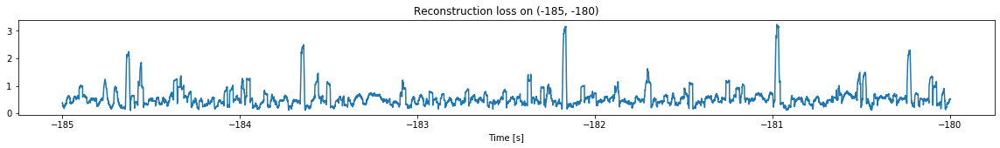

<--------
Entering sections:  (-180, -175)
-------->
Training for section:  (-185, -180)
Finished training, mean of the log(loss) is:  -0.7697603808502661
Triggering for section:  (-180, -175)
Using this mean for triggering: -0.7717317115567488


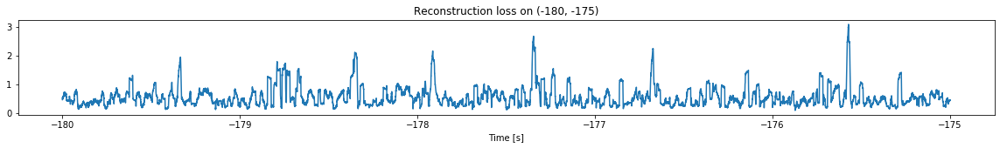

<--------
Entering sections:  (-175, -170)
-------->
Training for section:  (-180, -175)
Finished training, mean of the log(loss) is:  -0.7472196949151039
Triggering for section:  (-175, -170)
Using this mean for triggering: -0.7697603808502661


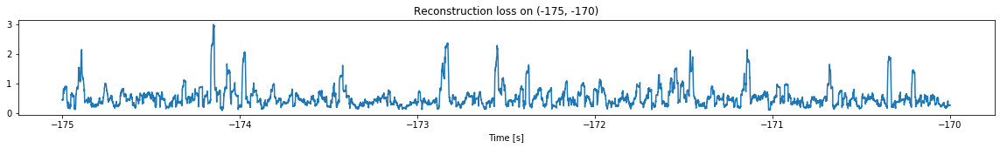

<--------
Entering sections:  (-170, -165)
-------->
Training for section:  (-175, -170)
Finished training, mean of the log(loss) is:  -0.7372180206672879
Triggering for section:  (-170, -165)
Using this mean for triggering: -0.7472196949151039


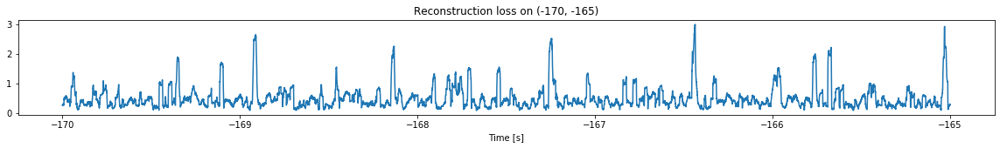

<--------
Entering sections:  (-165, -160)
-------->
Training for section:  (-170, -165)
Finished training, mean of the log(loss) is:  -0.8315105576880673
Triggering for section:  (-165, -160)
Using this mean for triggering: -0.7372180206672879


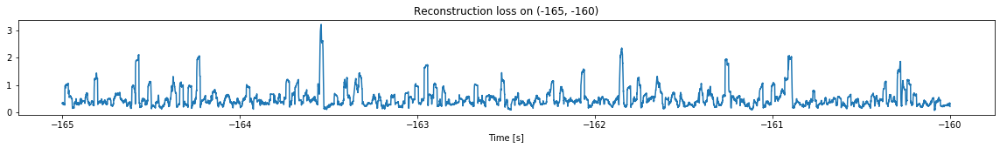

<--------
Entering sections:  (-160, -155)
-------->
Training for section:  (-165, -160)
Finished training, mean of the log(loss) is:  -0.7629752528703768
Triggering for section:  (-160, -155)
Using this mean for triggering: -0.8315105576880673


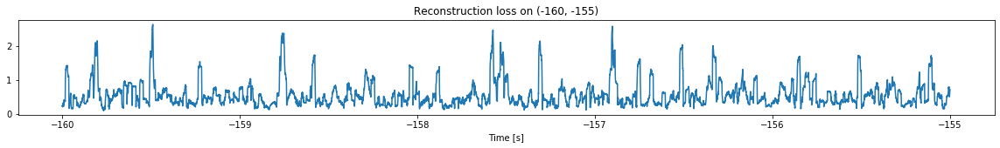

<--------
Entering sections:  (-155, -150)
-------->
Training for section:  (-160, -155)
Finished training, mean of the log(loss) is:  -0.669891342451563
Triggering for section:  (-155, -150)
Using this mean for triggering: -0.7629752528703768


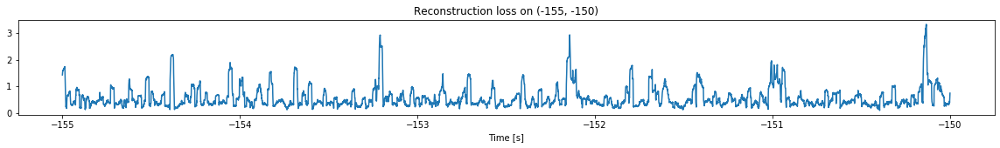

<--------
Entering sections:  (-150, -145)
-------->
Training for section:  (-155, -150)
Finished training, mean of the log(loss) is:  -0.654075337711873
Triggering for section:  (-150, -145)
Using this mean for triggering: -0.669891342451563


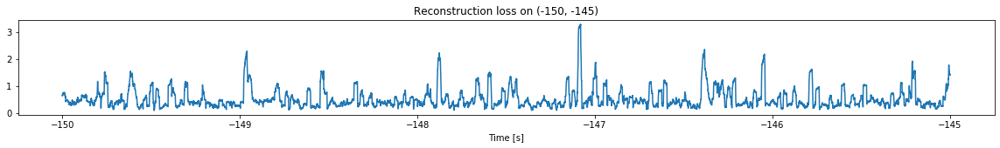

<--------
Entering sections:  (-145, -140)
-------->
Training for section:  (-150, -145)
Finished training, mean of the log(loss) is:  -0.7582240585591002
Triggering for section:  (-145, -140)
Using this mean for triggering: -0.654075337711873


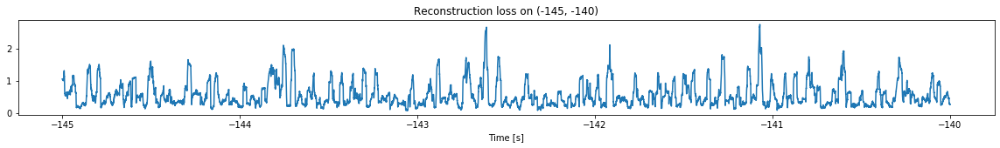

<--------
Entering sections:  (-140, -135)
-------->
Training for section:  (-145, -140)
Finished training, mean of the log(loss) is:  -0.6809038498105223
Triggering for section:  (-140, -135)
Using this mean for triggering: -0.7582240585591002


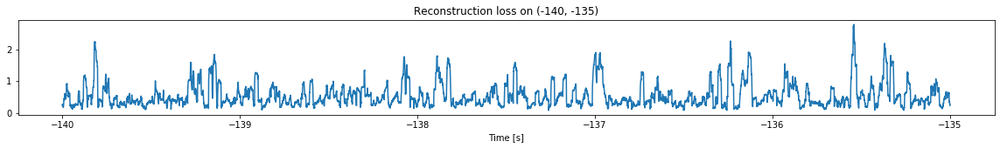

<--------
Entering sections:  (-135, -130)
-------->
Training for section:  (-140, -135)
Finished training, mean of the log(loss) is:  -0.7080495045504064
Triggering for section:  (-135, -130)
Using this mean for triggering: -0.6809038498105223


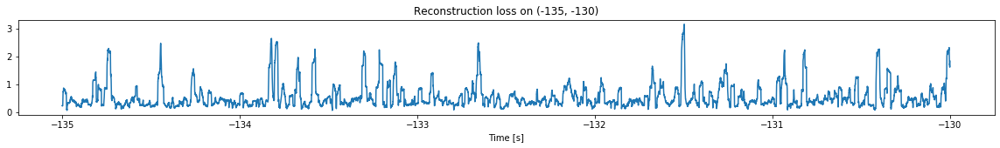

<--------
Entering sections:  (-130, -125)
-------->
Training for section:  (-135, -130)
Finished training, mean of the log(loss) is:  -0.6074397797010181
Triggering for section:  (-130, -125)
Using this mean for triggering: -0.7080495045504064


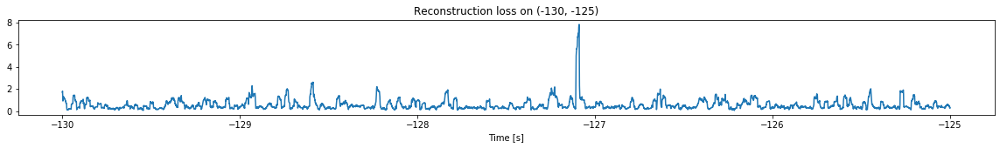

<--------
Entering sections:  (-125, -120)
-------->
Training for section:  (-130, -125)
Finished training, mean of the log(loss) is:  -0.6567363998919349
Triggering for section:  (-125, -120)
Using this mean for triggering: -0.6074397797010181


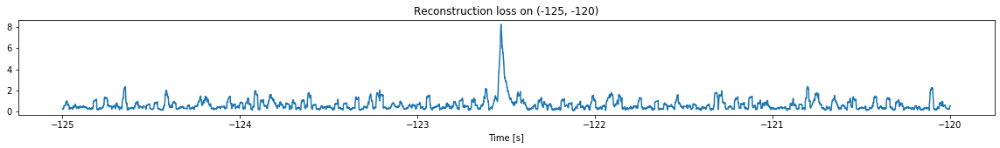

<--------
Entering sections:  (-120, -115)
-------->
Training for section:  (-125, -120)
Finished training, mean of the log(loss) is:  -0.6413594402798036
Triggering for section:  (-120, -115)
Using this mean for triggering: -0.6567363998919349


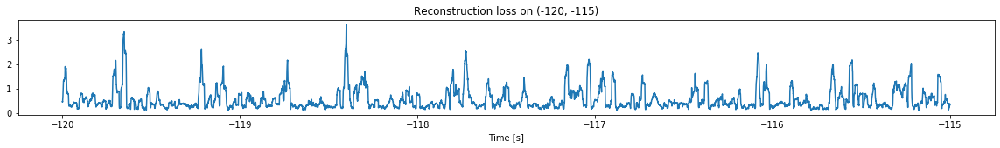

<--------
Entering sections:  (-115, -110)
-------->
Training for section:  (-120, -115)
Finished training, mean of the log(loss) is:  -0.674129731394541
Triggering for section:  (-115, -110)
Using this mean for triggering: -0.6413594402798036


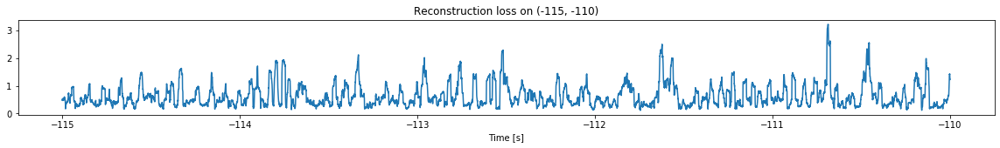

<--------
Entering sections:  (-110, -105)
-------->
Training for section:  (-115, -110)
Finished training, mean of the log(loss) is:  -0.5944016491995352
Triggering for section:  (-110, -105)
Using this mean for triggering: -0.674129731394541


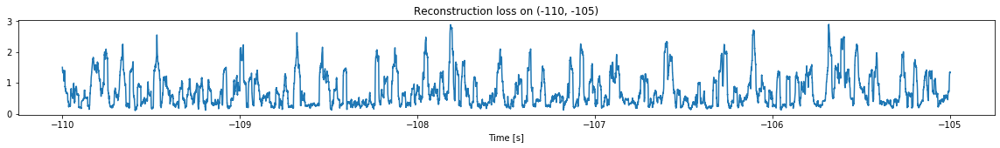

<--------
Entering sections:  (-105, -100)
-------->
Training for section:  (-110, -105)
Finished training, mean of the log(loss) is:  -0.6680865822254596
Triggering for section:  (-105, -100)
Using this mean for triggering: -0.5944016491995352


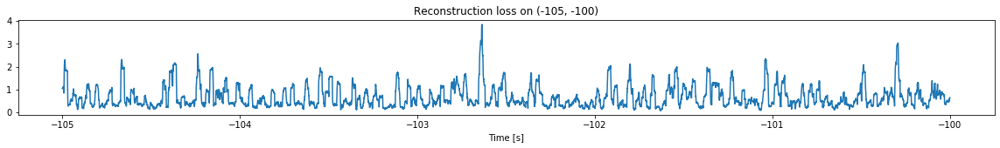

<--------
Entering sections:  (-100, -95)
-------->
Training for section:  (-105, -100)
Finished training, mean of the log(loss) is:  -0.6870181175833739
Triggering for section:  (-100, -95)
Using this mean for triggering: -0.6680865822254596


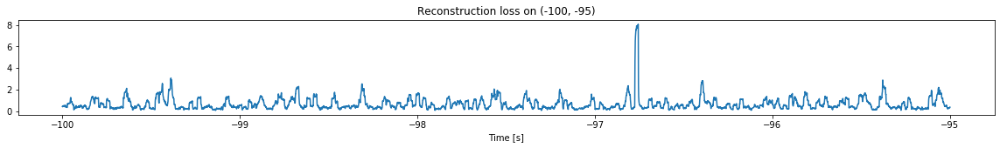

<--------
Entering sections:  (-95, -90)
-------->
Training for section:  (-100, -95)
Finished training, mean of the log(loss) is:  -0.583678966612595
Triggering for section:  (-95, -90)
Using this mean for triggering: -0.6870181175833739


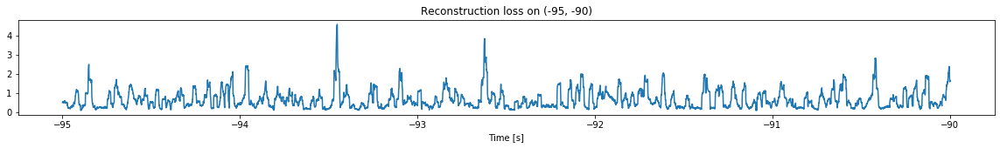

<--------
Entering sections:  (-90, -85)
-------->
Training for section:  (-95, -90)
Finished training, mean of the log(loss) is:  -0.5829763088061082
Triggering for section:  (-90, -85)
Using this mean for triggering: -0.583678966612595


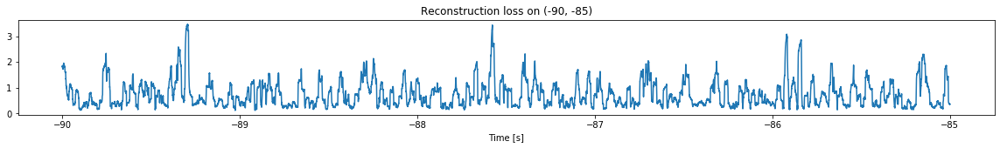

<--------
Entering sections:  (-85, -80)
-------->
Training for section:  (-90, -85)
Finished training, mean of the log(loss) is:  -0.6248562009060341
Triggering for section:  (-85, -80)
Using this mean for triggering: -0.5829763088061082


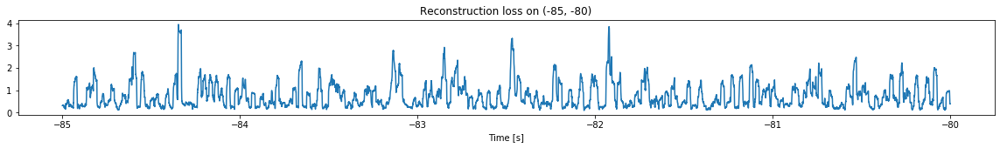

<--------
Entering sections:  (-80, -75)
-------->
Training for section:  (-85, -80)
Finished training, mean of the log(loss) is:  -0.5566438489183761
Triggering for section:  (-80, -75)
Using this mean for triggering: -0.6248562009060341


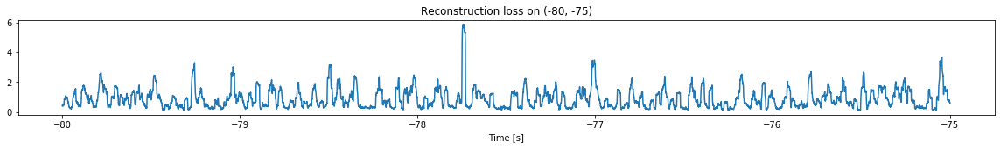

<--------
Entering sections:  (-75, -70)
-------->
Training for section:  (-80, -75)
Finished training, mean of the log(loss) is:  -0.5829519462360392
Triggering for section:  (-75, -70)
Using this mean for triggering: -0.5566438489183761


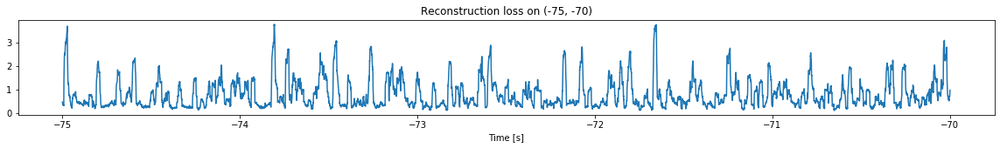

<--------
Entering sections:  (-70, -65)
-------->
Training for section:  (-75, -70)
Finished training, mean of the log(loss) is:  -0.6242654170656168
Triggering for section:  (-70, -65)
Using this mean for triggering: -0.5829519462360392


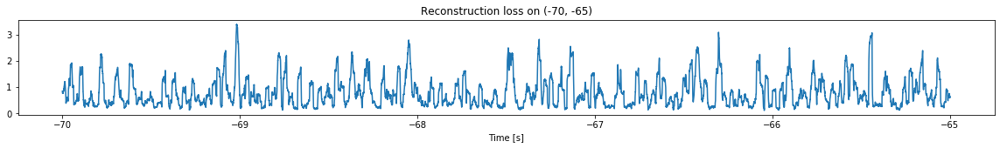

<--------
Entering sections:  (-65, -60)
-------->
Training for section:  (-70, -65)
Finished training, mean of the log(loss) is:  -0.5673776298989329
Triggering for section:  (-65, -60)
Using this mean for triggering: -0.6242654170656168


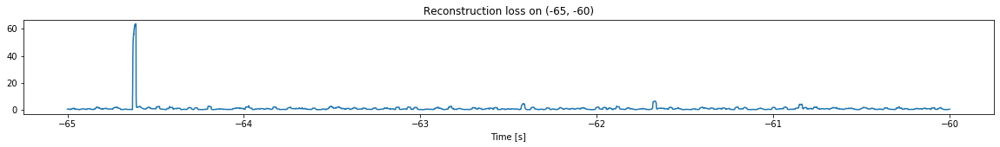

<--------
Entering sections:  (-60, -55)
-------->
Training for section:  (-65, -60)
Finished training, mean of the log(loss) is:  -0.39322096770396037
Triggering for section:  (-60, -55)
Using this mean for triggering: -0.5673776298989329


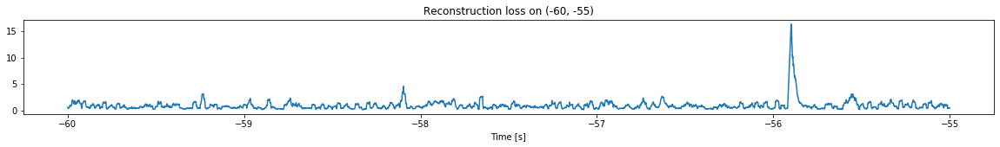

<--------
Entering sections:  (-55, -50)
-------->
Training for section:  (-60, -55)
Finished training, mean of the log(loss) is:  -0.5127687340834901
Triggering for section:  (-55, -50)
Using this mean for triggering: -0.39322096770396037


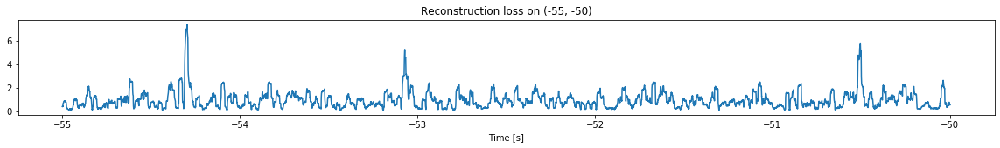

<--------
Entering sections:  (-50, -45)
-------->
Training for section:  (-55, -50)
Finished training, mean of the log(loss) is:  -0.5316914232098893
Triggering for section:  (-50, -45)
Using this mean for triggering: -0.5127687340834901


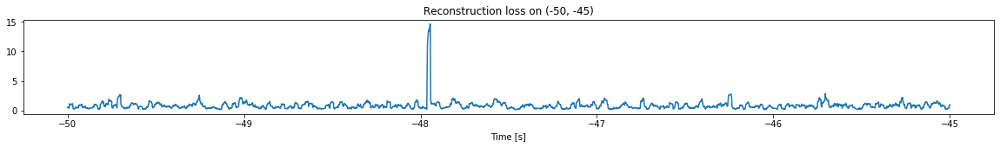

<--------
Entering sections:  (-45, -40)
-------->
Training for section:  (-50, -45)
Finished training, mean of the log(loss) is:  -0.4955779842016277
Triggering for section:  (-45, -40)
Using this mean for triggering: -0.5316914232098893


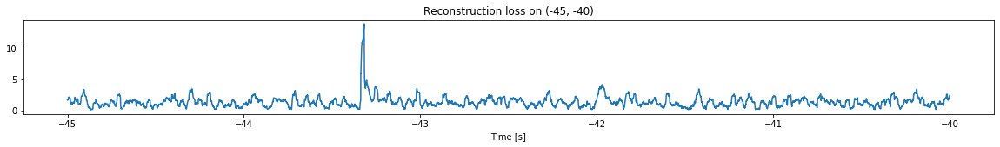

<--------
Entering sections:  (-40, -35)
-------->
Training for section:  (-45, -40)
Finished training, mean of the log(loss) is:  -0.4940993590486712
Triggering for section:  (-40, -35)
Using this mean for triggering: -0.4955779842016277


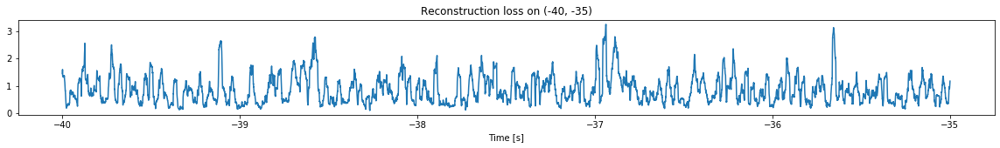

<--------
Entering sections:  (-35, -30)
-------->
Training for section:  (-40, -35)
Finished training, mean of the log(loss) is:  -0.5674231351586771
Triggering for section:  (-35, -30)
Using this mean for triggering: -0.4940993590486712


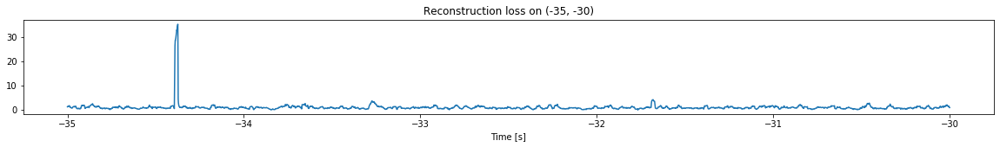

<--------
Entering sections:  (-30, -25)
-------->
Training for section:  (-35, -30)
Finished training, mean of the log(loss) is:  -0.49544675829045665
Triggering for section:  (-30, -25)
Using this mean for triggering: -0.5674231351586771


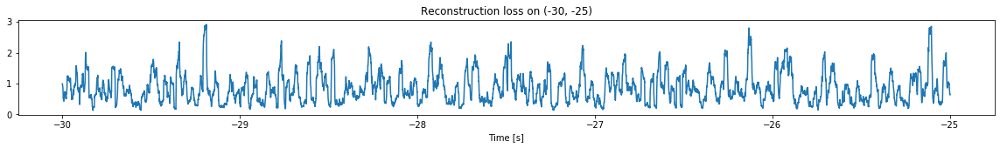

<--------
Entering sections:  (-25, -20)
-------->
Training for section:  (-30, -25)
Finished training, mean of the log(loss) is:  -0.5880525742328946
Triggering for section:  (-25, -20)
Using this mean for triggering: -0.49544675829045665


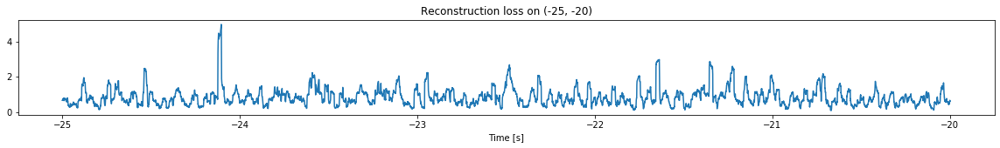

<--------
Entering sections:  (-20, -15)
-------->
Training for section:  (-25, -20)
Finished training, mean of the log(loss) is:  -0.4398205930884443
Triggering for section:  (-20, -15)
Using this mean for triggering: -0.5880525742328946


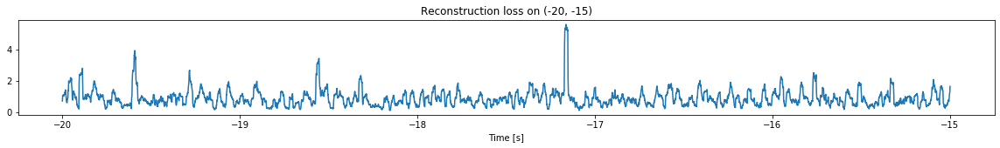

<--------
Entering sections:  (-15, -10)
-------->
Training for section:  (-20, -15)
Finished training, mean of the log(loss) is:  -0.5557598388218395
Triggering for section:  (-15, -10)
Using this mean for triggering: -0.4398205930884443


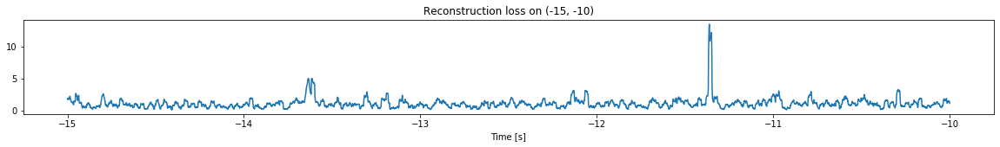

<--------
Entering sections:  (-10, -5)
-------->
Training for section:  (-15, -10)
Finished training, mean of the log(loss) is:  -0.47366367608415966
Triggering for section:  (-10, -5)
Using this mean for triggering: -0.5557598388218395


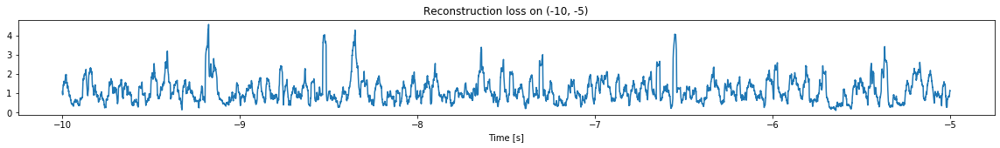

<--------
Entering sections:  (-5, 0)
-------->
Training for section:  (-10, -5)
Finished training, mean of the log(loss) is:  -0.5208702864208069
Triggering for section:  (-5, 0)
Using this mean for triggering: -0.47366367608415966


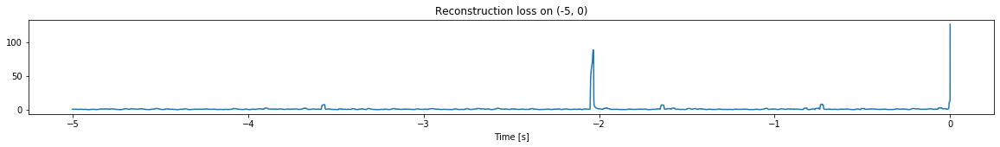

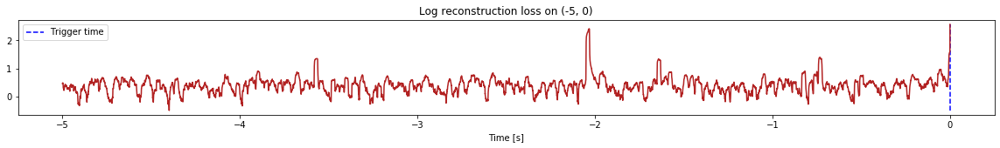

Triggered at:  -9e-05


-9e-05

In [16]:
simulation("./data/Ramp29/", 5, (-300,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (2997500, 12)
Flushing input history
Number of sections: 60
Entering sections:  (-300, -295)
-------->
Entering sections:  (-295, -290)
-------->
Training for section:  (None, -295)
Finished training, mean of the log(loss) is:  -0.6735618204924828
<--------
Entering sections:  (-290, -285)
-------->
Training for section:  (-295, -290)
Finished training, mean of the log(loss) is:  -0.602239794087756
Triggering for section:  (-290, -285)
Using this mean for triggering: -0.6735618204924828


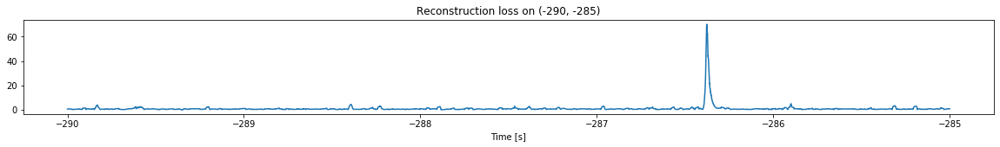

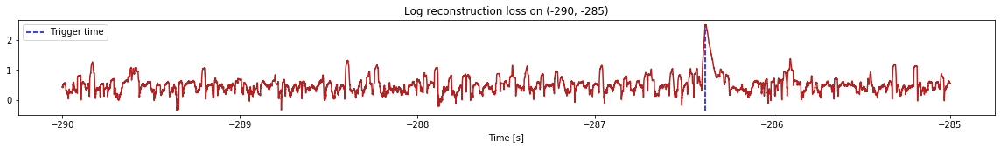

Triggered at:  -286.37827


-286.37827

In [18]:
simulation("./data/Ramp30/", 5, (-300,0))